<h1 id="tocheading">Table of Contents</h1>

<div id="toc"></div>

In [1]:
%%javascript
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

# **Data Exploration <<< Starts from here >>>**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [233]:
na_values_to_mark_as_na = ["Not Applicable","Not Available"]
survey = pd.read_csv("./Data/Patient_survey__HCAHPS__-_Hospital.csv", 
                     na_values={"Patient Survey Star Rating":na_values_to_mark_as_na,
                                "HCAHPS Answer Percent": na_values_to_mark_as_na,
                                "HCAHPS Linear Mean Value":na_values_to_mark_as_na,
                               "Number of Completed Surveys":na_values_to_mark_as_na,
                               "Survey Response Rate Percent":na_values_to_mark_as_na

                               })

complications = pd.read_csv('./Data/Complications_and_Deaths_-_Hospital.csv',
                           na_values={"Score":na_values_to_mark_as_na})


Question I have
1. Not Avaialbe vs Not Aplicable

In [234]:
complications.shape

(92155, 19)

In [235]:
survey.shape

(245450, 23)

In [236]:
complications.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92155 entries, 0 to 92154
Data columns (total 19 columns):
Provider ID             92155 non-null object
Hospital Name           92155 non-null object
Address                 92155 non-null object
City                    92155 non-null object
State                   92155 non-null object
ZIP Code                92155 non-null int64
County Name             91934 non-null object
Phone Number            92155 non-null int64
Measure Name            92155 non-null object
Measure ID              92155 non-null object
Compared to National    92155 non-null object
Denominator             92155 non-null object
Score                   54368 non-null float64
Lower Estimate          92155 non-null object
Higher Estimate         92155 non-null object
Footnote                37846 non-null object
Measure Start Date      92155 non-null object
Measure End Date        92155 non-null object
Location                92155 non-null object
dtypes: float64(1)

In [237]:
# This shows counts without NaN
survey.count()

Provider ID                              245450
Hospital Name                            245450
Address                                  245450
City                                     245450
State                                    245450
ZIP Code                                 245450
County Name                              244800
Phone Number                             245450
HCAHPS Measure ID                        245450
HCAHPS Question                          245450
HCAHPS Answer Description                245450
Patient Survey Star Rating                38819
Patient Survey Star Rating Footnote       15180
HCAHPS Answer Percent                    122612
HCAHPS Answer Percent Footnote            44341
HCAHPS Linear Mean Value                  35290
Number of Completed Surveys              211400
Number of Completed Surveys Footnote      76450
Survey Response Rate Percent             211400
Survey Response Rate Percent Footnote     76450
Measure Start Date                      

In [238]:
# getting column names and thier indexes
for ind,val in enumerate(survey.columns):
    print(ind,":", val)

0 : Provider ID
1 : Hospital Name
2 : Address
3 : City
4 : State
5 : ZIP Code
6 : County Name
7 : Phone Number
8 : HCAHPS Measure ID
9 : HCAHPS Question
10 : HCAHPS Answer Description
11 : Patient Survey Star Rating
12 : Patient Survey Star Rating Footnote
13 : HCAHPS Answer Percent
14 : HCAHPS Answer Percent Footnote
15 : HCAHPS Linear Mean Value
16 : Number of Completed Surveys
17 : Number of Completed Surveys Footnote
18 : Survey Response Rate Percent
19 : Survey Response Rate Percent Footnote
20 : Measure Start Date
21 : Measure End Date
22 : Location


In [239]:
data_set = pd.DataFrame([survey.shape, complications.shape], columns=['Total Records', 'Columns'], index=['Survey','Complication'])
data_set.T
data_set3 = data_set.reset_index().rename(columns={"index":"Type"})
data_set3

,Type,Total Records,Columns
0,Survey,245450,23
1,Complication,92155,19


In [240]:
data_set3.dtypes

Type             object
Total Records     int64
Columns           int64
dtype: object

In [241]:
data_set3.iloc[:,[0,1,2]]

,Type,Total Records,Columns
0,Survey,245450,23
1,Complication,92155,19


In [242]:
data_set_2= data_set.T.reset_index().rename(columns={"index":"Type"})
data_set_2

,Type,Survey,Complication
0,Total Records,245450,92155
1,Columns,23,19


<class 'matplotlib.axes._subplots.AxesSubplot'>


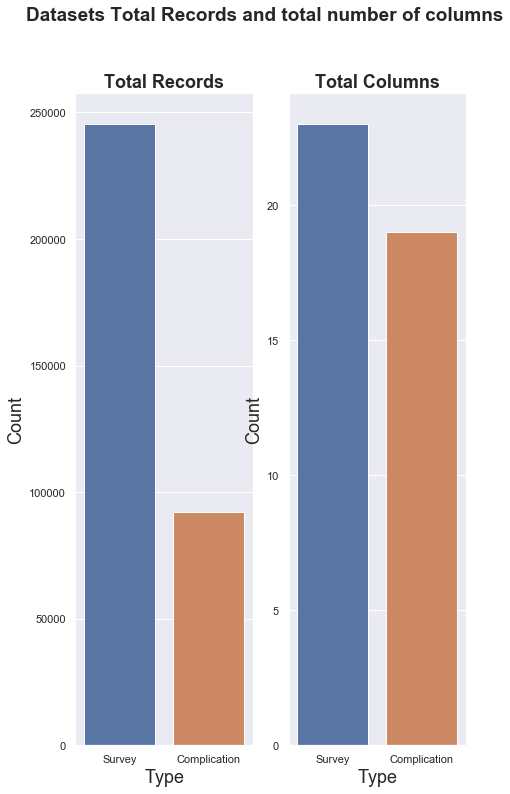

In [280]:

fig, ax = plt.subplots(1,2, figsize=(7,12))

plt.suptitle("Datasets Total Records and total number of columns",fontsize=19, **{"fontweight":"semibold"})
surv_comp = sns.barplot(x="Type", y="Total Records", data=data_set3, ax=ax[0])
col_total = sns.barplot(x="Type", y="Columns", data=data_set3, ax=ax[1])

surv_comp.set_title("Total Records", fontsize=18, **{"fontweight":"semibold"})
col_total.set_title("Total Columns", fontsize=18, **{"fontweight":"semibold"})
col_total.set_ylabel("Count", fontsize=18)
surv_comp.set_ylabel("Count", fontsize=18)
col_total.set_xlabel("Type", fontsize=18)
surv_comp.set_xlabel("Type", fontsize=18)

print(type(surv_comp))
# row.text("10","20","40")
# for idx,row in data_set3.iterrows():
# #     surv_comp.text("Survey",25000,"text")
#     surv_comp.text(row.Type, row['Total Records'], row['Total Records'], color='black', ha="center")

In [244]:
# Removing last 3 columns Measure Start Date, Measure End Date, Location
survey.drop(survey.columns[[2,6,7,20,21,22]], axis=1, inplace=True)
survey.head(2)

,Provider ID,Hospital Name,City,State,ZIP Code,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote
0,241335,ST ELIZABETH MEDICAL CENTER,WABASHA,MN,55981,H_COMP_5_LINEAR_SCORE,Communication about medicines - linear mean score,Communication about medicines - linear mean score,NaN,NaN,NaN,NaN,NaN,58.0,6 - Fewer than 100 patients completed the HCAH...,34.0,6 - Fewer than 100 patients completed the HCAH...
1,241322,RAINY LAKE MEDICAL CENTER,INTERNATIONAL FALLS,MN,56649,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",NaN,NaN,4.0,6 - Fewer than 100 patients completed the HCAH...,NaN,86.0,6 - Fewer than 100 patients completed the HCAH...,32.0,6 - Fewer than 100 patients completed the HCAH...


In [245]:
survey.shape

(245450, 17)

# Exploring data a bit

## Grouping by total counts of hospitals by state
### Should we only do our analysis on `TX` states?

In [246]:
data_set

,Total Records,Columns
Survey,245450,23
Complication,92155,19


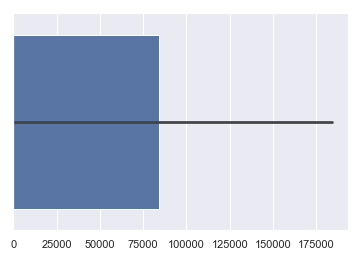

In [247]:
sns.barplot(data_set.values)

In [248]:
len(np.unique(survey["State"]))

56

In [249]:
unique_hospital_by_state = survey.groupby(["State"]).agg({"Hospital Name":"nunique"}, axis=0).sort_values(by="Hospital Name", ascending=0)
# survey.groupby(["State"]).agg({"Provider ID":"nunique"}) 
unique_hospital_by_state.head(10)

,Hospital Name
State,
TX,402
CA,344
FL,191
IL,183
PA,178
NY,178
OH,169
KS,139
MI,136


In [250]:
complic_unique_hospital_by_state = complications.groupby(['State']).agg({'Hospital Name':"nunique"}, axis=0).sort_values(by="Hospital Name", ascending=0)
complic_unique_hospital_by_state.head()

complic_unique_hospital_by_state = complications.groupby(['HCAHPS Measure ID']).agg({'Hospital Name':"nunique"}, axis=0).sort_values(by="Hospital Name", ascending=0)



KeyError: 'HCAHPS Measure ID'

Text(0, 0.5, 'Counts')

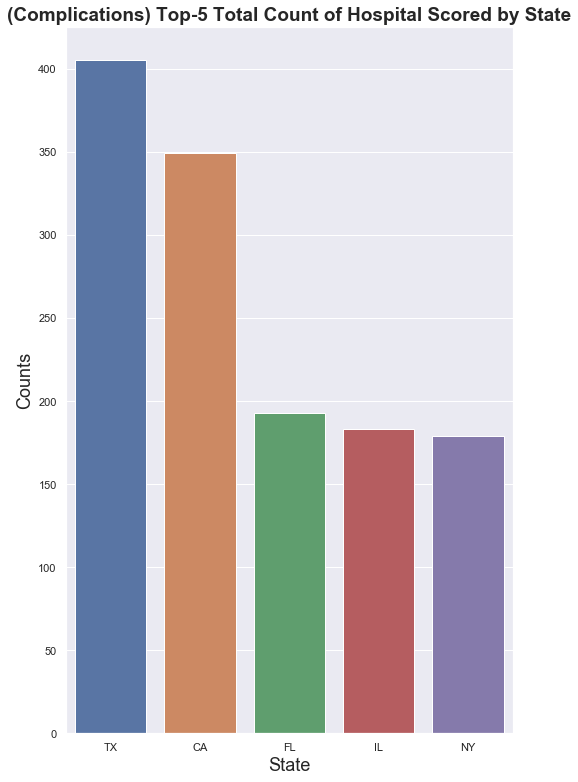

In [263]:
bar_plot_data = complic_unique_hospital_by_state.reset_index()
sns.set()
plt.figure(figsize=(8,13))
sns.barplot(x="State", y="Hospital Name", data=bar_plot_data[0:5])
plt.title("(Complications) Top-5 Total Count of Hospital Scored by State", fontsize=19, **{"fontweight":"semibold"})
plt.xlabel("State",fontsize=18)
plt.ylabel("Counts",fontsize=18)

Text(0, 0.5, 'Counts')

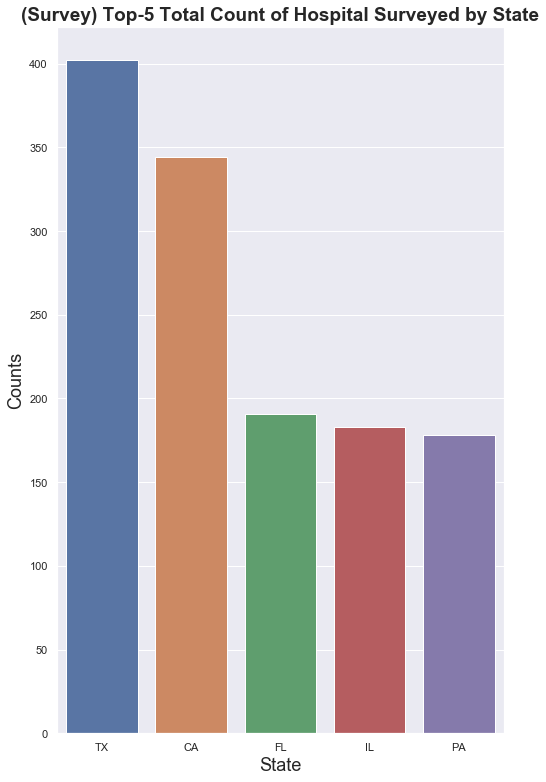

In [268]:
bar_plot_data = unique_hospital_by_state.reset_index()
sns.set()
plt.figure(figsize=(8,13))
sns.barplot(x="State", y="Hospital Name", data=bar_plot_data[0:5])
plt.title("(Survey) Top-5 Total Count of Hospital Surveyed by State", fontsize=19, **{"fontweight":"semibold"})
plt.xlabel("State",fontsize=18)
plt.ylabel("Counts",fontsize=18)

In [188]:
bar_plot_data.head(2)

,State,Hospital Name
0,TX,405
1,CA,349


[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

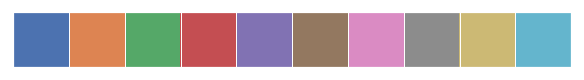

In [198]:
sns.palplot(sns.color_palette())
sns.color_palette()


In [200]:
survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245450 entries, 0 to 245449
Data columns (total 23 columns):
Provider ID                              245450 non-null object
Hospital Name                            245450 non-null object
Address                                  245450 non-null object
City                                     245450 non-null object
State                                    245450 non-null object
ZIP Code                                 245450 non-null int64
County Name                              244800 non-null object
Phone Number                             245450 non-null int64
HCAHPS Measure ID                        245450 non-null object
HCAHPS Question                          245450 non-null object
HCAHPS Answer Description                245450 non-null object
Patient Survey Star Rating               38819 non-null float64
Patient Survey Star Rating Footnote      15180 non-null object
HCAHPS Answer Percent                    122612 non-null flo

In [199]:
linear_score_col = ['H_CLEAN_LINEAR_SCORE','H_COMP_1_LINEAR_SCORE',
       'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
       'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE',
       'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
       'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']

In [ ]:
survey.groupby(['State','HCAHPS Measure ID'])

## Exploring little bit about `HCAHPS Measure ID` and `HCAHPS Question`

In [12]:
survey["HCAHPS Measure ID"].unique()

array(['H_COMP_5_LINEAR_SCORE', 'H_COMP_1_SN_P', 'H_COMP_5_STAR_RATING',
       'H_STAR_RATING', 'H_COMP_5_SN_P', 'H_HSP_RATING_STAR_RATING',
       'H_CLEAN_LINEAR_SCORE', 'H_HSP_RATING_7_8', 'H_COMP_7_D_SD',
       'H_RECMND_LINEAR_SCORE', 'H_COMP_7_STAR_RATING',
       'H_COMP_7_LINEAR_SCORE', 'H_COMP_7_A', 'H_HSP_RATING_LINEAR_SCORE',
       'H_COMP_2_LINEAR_SCORE', 'H_COMP_1_U_P', 'H_COMP_3_STAR_RATING',
       'H_CLEAN_HSP_A_P', 'H_HSP_RATING_0_6', 'H_QUIET_HSP_A_P',
       'H_RECMND_DN', 'H_COMP_2_U_P', 'H_COMP_1_LINEAR_SCORE',
       'H_COMP_3_SN_P', 'H_COMP_6_LINEAR_SCORE', 'H_CLEAN_HSP_SN_P',
       'H_CLEAN_HSP_U_P', 'H_CLEAN_STAR_RATING', 'H_COMP_1_A_P',
       'H_COMP_1_STAR_RATING', 'H_COMP_2_A_P', 'H_COMP_2_SN_P',
       'H_COMP_2_STAR_RATING', 'H_COMP_3_A_P', 'H_COMP_3_LINEAR_SCORE',
       'H_COMP_3_U_P', 'H_COMP_5_A_P', 'H_COMP_5_U_P', 'H_COMP_6_N_P',
       'H_COMP_6_STAR_RATING', 'H_COMP_6_Y_P', 'H_COMP_7_SA',
       'H_HSP_RATING_9_10', 'H_QUIET_HSP_SN_P', 'H_QUIET

So look like there are a total of `50` `HCAHPS Measure ID` accorss the dataset.

In [13]:
len(survey["HCAHPS Measure ID"].unique())

50

And the same for `HCAHPS Question`

In [14]:
len(survey["HCAHPS Question"].unique())

50

Making sure that `HCAHPS Measure ID` is a code for `HCAHPS Question`

### This confirms that for each question there is a mesure id. So we could use either the measure id or question as our columns

In [15]:
survey.groupby(["HCAHPS Measure ID","HCAHPS Question"]).size().reset_index().rename(columns={0:'count'})

,HCAHPS Measure ID,HCAHPS Question,count
0,H_CLEAN_HSP_A_P,Patients who reported that their room and bath...,4909
1,H_CLEAN_HSP_SN_P,Patients who reported that their room and bath...,4909
2,H_CLEAN_HSP_U_P,Patients who reported that their room and bath...,4909
3,H_CLEAN_LINEAR_SCORE,Cleanliness - linear mean score,4909
4,H_CLEAN_STAR_RATING,Cleanliness - star rating,4909
5,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...",4909
6,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,4909
7,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...",4909
8,H_COMP_1_STAR_RATING,Nurse communication - star rating,4909
9,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...",4909


## Total number of surveys completed by state

In [16]:
survey["Number of Completed Surveys"].fillna(0, inplace=True)

In [17]:
total_surveys = survey.groupby(["State","Hospital Name","Number of Completed Surveys"]).agg({"Number of Completed Surveys":"max"}).rename(columns={'Number of Completed Surveys':'duplicate'})

# [["Number of Completed Surveys"]].sum()
# [["State","Number of Completed Surveys"]]

# .agg({"Number of Completed Surveys":pd.Series.nunique}, axis=0)
total_surveys.head()
# print(type(unique_hospital_by_state))
# .sort_values(by="Hospital Name", ascending=True)
# survey.groupby(["State"]).agg({"Provider ID":"nunique"}) 
# unique_hospital_by_state.head(10)
# unique_hospital_by_state.reset_index()

duplicate
State Hospital Name                      Number of Completed Surveys           
AK    ALASKA NATIVE MEDICAL CENTER       1114.0                          1114.0
      ALASKA REGIONAL HOSPITAL           1217.0                          1217.0
      BARTLETT REGIONAL HOSPITAL         269.0                            269.0
      CENTRAL PENINSULA GENERAL HOSPITAL 403.0                            403.0
      CORDOVA COMMUNITY MEDICAL CENTER   0.0                                0.0

In [18]:
total_surveys = total_surveys.reset_index()
total_surveys.drop(["duplicate"], axis=1, inplace=True)

In [19]:
total_surveys.head(2)

,State,Hospital Name,Number of Completed Surveys
0,AK,ALASKA NATIVE MEDICAL CENTER,1114.0
1,AK,ALASKA REGIONAL HOSPITAL,1217.0


In [20]:
total_surveys_filter = total_surveys.groupby(["State"])

In [21]:
total_surveys_filter.get_group("DE")

,State,Hospital Name,Number of Completed Surveys
748,DE,ALFRED I DUPONT HOSPITAL FOR CHILDREN,0.0
749,DE,BAYHEALTH - MILFORD MEMORIAL HOSPITAL,751.0
750,DE,"BAYHEALTH HOSPITAL, KENT CAMPUS",956.0
751,DE,BEEBE MEDICAL CENTER,500.0
752,DE,"CHRISTIANA CARE HEALTH SERVICES, INC.",897.0
753,DE,NANTICOKE MEMORIAL HOSPITAL,708.0
754,DE,ST FRANCIS HOSPITAL,565.0
755,DE,WILMINGTON VA MEDICAL CENTER,282.0


In [22]:
total_surveys_filter = total_surveys.groupby(["State"]).sum().sort_values(by="Number of Completed Surveys", ascending=False).reset_index()

Text(0, 0.5, 'Counts')

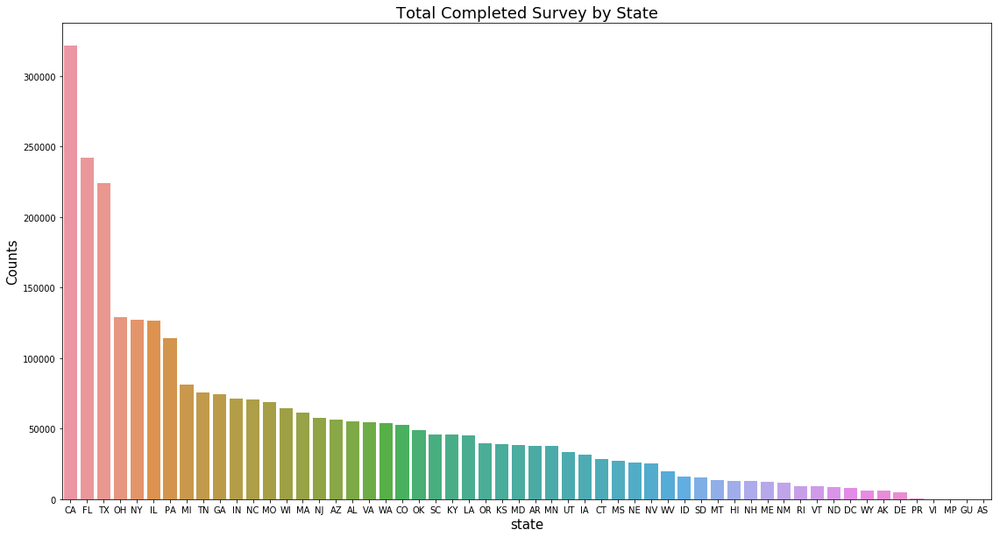

In [23]:
fig = plt.figure(figsize=(19,10))
sns.barplot(x="State", y="Number of Completed Surveys", data=total_surveys_filter)
plt.title("Total Completed Survey by State", fontsize=18)
plt.xlabel("state",fontsize=15)
plt.ylabel("Counts",fontsize=15)

# Pivot'ing the data as suggested in the call (pending)

In [24]:
survey.head(2)

,Provider ID,Hospital Name,City,State,ZIP Code,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote
0,241335,ST ELIZABETH MEDICAL CENTER,WABASHA,MN,55981,H_COMP_5_LINEAR_SCORE,Communication about medicines - linear mean score,Communication about medicines - linear mean score,NaN,NaN,NaN,NaN,NaN,58.0,6 - Fewer than 100 patients completed the HCAH...,34.0,6 - Fewer than 100 patients completed the HCAH...
1,241322,RAINY LAKE MEDICAL CENTER,INTERNATIONAL FALLS,MN,56649,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",NaN,NaN,4.0,6 - Fewer than 100 patients completed the HCAH...,NaN,86.0,6 - Fewer than 100 patients completed the HCAH...,32.0,6 - Fewer than 100 patients completed the HCAH...


In [25]:
survey.pivot(index='Provider ID',columns='HCAHPS Measure ID', values=['Patient Survey Star Rating','HCAHPS Answer Percent'])

Patient Survey Star Rating                                   \
HCAHPS Measure ID            H_CLEAN_HSP_A_P H_CLEAN_HSP_SN_P H_CLEAN_HSP_U_P   
Provider ID                                                                     
010001                                   NaN              NaN             NaN   
010005                                   NaN              NaN             NaN   
010006                                   NaN              NaN             NaN   
010007                                   NaN              NaN             NaN   
010008                                   NaN              NaN             NaN   
010011                                   NaN              NaN             NaN   
010012                                   NaN              NaN             NaN   
010016                                   NaN              NaN             NaN   
010018                                   NaN              NaN             NaN   
010019                                   NaN              NaN             NaN   
010021                                   NaN              NaN             NaN   
010022                                   NaN              NaN             NaN   
010023                                   NaN              NaN             NaN   
010024                                   NaN              NaN             NaN   
010029                                   NaN              NaN             NaN   
010032                                   NaN              NaN             NaN   
010033                                   NaN              NaN             NaN   
010034                                   NaN              NaN             NaN   
010035                                   NaN              NaN             NaN   
010036                                   NaN              NaN             NaN   
010038                                   NaN              NaN             NaN   
010039                                   NaN              NaN             NaN   
010040                                   NaN              NaN             NaN   
010044                                   NaN              NaN             NaN   
010045                                   NaN              NaN             NaN   
010046                                   NaN              NaN             NaN   
010047                                   NaN              NaN             NaN   
010049                                   NaN              NaN             NaN   
010051                                   NaN              NaN             NaN   
010052                                   NaN              NaN             NaN   
...                                      ...              ...             ...   
670082                                   NaN              NaN             NaN   
670083                                   NaN              NaN             NaN   
670085                                   NaN              NaN             NaN   
670087                                   NaN              NaN             NaN   
670088                                   NaN              NaN             NaN   
670090                                   NaN              NaN             NaN   
670093                                   NaN              NaN             NaN   
670094                                   NaN              NaN             NaN   
670095                                   NaN              NaN             NaN   
670097                                   NaN              NaN             NaN   
670098                                   NaN              NaN             NaN   
670099                                   NaN              NaN             NaN   
670102                                   NaN              NaN             NaN   
670103                                   NaN              NaN             NaN   
670106                                   NaN              NaN             NaN   
670107                                   NaN     

In [26]:
import numpy as np
np.where(survey.index.duplicated())
# 0 : Provider ID
# 1 : Hospital Name
# 2 : Address
# 3 : City
# 4 : State
# 5 : ZIP Code
# 6 : County Name
# 7 : Phone Number
# 8 : HCAHPS Measure ID
# 9 : HCAHPS Question
# 10 : HCAHPS Answer Description
# 11 : Patient Survey Star Rating
# 12 : Patient Survey Star Rating Footnote
# 13 : HCAHPS Answer Percent
# 14 : HCAHPS Answer Percent Footnote
# 15 : HCAHPS Linear Mean Value
# 16 : Number of Completed Surveys
# 17 : Number of Completed Surveys Footnote
# 18 : Survey Response Rate Percent
# 19 : Survey Response Rate Percent Footnote
# 20 : Measure Start Date
# 21 : Measure End Date
# 22 : Location

(array([], dtype=int64),)

In [27]:
survey.head(2)

,Provider ID,Hospital Name,City,State,ZIP Code,HCAHPS Measure ID,HCAHPS Question,HCAHPS Answer Description,Patient Survey Star Rating,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote
0,241335,ST ELIZABETH MEDICAL CENTER,WABASHA,MN,55981,H_COMP_5_LINEAR_SCORE,Communication about medicines - linear mean score,Communication about medicines - linear mean score,NaN,NaN,NaN,NaN,NaN,58.0,6 - Fewer than 100 patients completed the HCAH...,34.0,6 - Fewer than 100 patients completed the HCAH...
1,241322,RAINY LAKE MEDICAL CENTER,INTERNATIONAL FALLS,MN,56649,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...","Nurses ""sometimes"" or ""never"" communicated well",NaN,NaN,4.0,6 - Fewer than 100 patients completed the HCAH...,NaN,86.0,6 - Fewer than 100 patients completed the HCAH...,32.0,6 - Fewer than 100 patients completed the HCAH...


In [1]:
def initial_checks(df, col):
    print('Total Counts', df[col].count())
    print('Total Nulls', df[col].isnull().sum() )
    print('Unique', df[col].unique())
    print("Data Type", df[col].dtype)

In [ ]:
survey, complications

In [6]:
survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245450 entries, 0 to 245449
Data columns (total 23 columns):
Provider ID                              245450 non-null object
Hospital Name                            245450 non-null object
Address                                  245450 non-null object
City                                     245450 non-null object
State                                    245450 non-null object
ZIP Code                                 245450 non-null int64
County Name                              244800 non-null object
Phone Number                             245450 non-null int64
HCAHPS Measure ID                        245450 non-null object
HCAHPS Question                          245450 non-null object
HCAHPS Answer Description                245450 non-null object
Patient Survey Star Rating               38819 non-null float64
Patient Survey Star Rating Footnote      15180 non-null object
HCAHPS Answer Percent                    122612 non-null flo

# HCAHPS Measure ID

In [7]:
initial_checks(survey, 'HCAHPS Measure ID')

Total Counts 245450
Total Nulls 0
Unique ['H_COMP_5_LINEAR_SCORE' 'H_COMP_1_SN_P' 'H_COMP_5_STAR_RATING'
 'H_STAR_RATING' 'H_COMP_5_SN_P' 'H_HSP_RATING_STAR_RATING'
 'H_CLEAN_LINEAR_SCORE' 'H_HSP_RATING_7_8' 'H_COMP_7_D_SD'
 'H_RECMND_LINEAR_SCORE' 'H_COMP_7_STAR_RATING' 'H_COMP_7_LINEAR_SCORE'
 'H_COMP_7_A' 'H_HSP_RATING_LINEAR_SCORE' 'H_COMP_2_LINEAR_SCORE'
 'H_COMP_1_U_P' 'H_COMP_3_STAR_RATING' 'H_CLEAN_HSP_A_P'
 'H_HSP_RATING_0_6' 'H_QUIET_HSP_A_P' 'H_RECMND_DN' 'H_COMP_2_U_P'
 'H_COMP_1_LINEAR_SCORE' 'H_COMP_3_SN_P' 'H_COMP_6_LINEAR_SCORE'
 'H_CLEAN_HSP_SN_P' 'H_CLEAN_HSP_U_P' 'H_CLEAN_STAR_RATING' 'H_COMP_1_A_P'
 'H_COMP_1_STAR_RATING' 'H_COMP_2_A_P' 'H_COMP_2_SN_P'
 'H_COMP_2_STAR_RATING' 'H_COMP_3_A_P' 'H_COMP_3_LINEAR_SCORE'
 'H_COMP_3_U_P' 'H_COMP_5_A_P' 'H_COMP_5_U_P' 'H_COMP_6_N_P'
 'H_COMP_6_STAR_RATING' 'H_COMP_6_Y_P' 'H_COMP_7_SA' 'H_HSP_RATING_9_10'
 'H_QUIET_HSP_SN_P' 'H_QUIET_HSP_U_P' 'H_QUIET_LINEAR_SCORE'
 'H_QUIET_STAR_RATING' 'H_RECMND_DY' 'H_RECMND_PY' 'H_RECMND_

In [21]:
for i in survey['HCAHPS Measure ID'].unique():
    if 'LINEAR'in i:
        print(i, '****')
    else:
        print(i)

H_COMP_5_LINEAR_SCORE ****
H_COMP_1_SN_P
H_COMP_5_STAR_RATING
H_STAR_RATING
H_COMP_5_SN_P
H_HSP_RATING_STAR_RATING
H_CLEAN_LINEAR_SCORE ****
H_HSP_RATING_7_8
H_COMP_7_D_SD
H_RECMND_LINEAR_SCORE ****
H_COMP_7_STAR_RATING
H_COMP_7_LINEAR_SCORE ****
H_COMP_7_A
H_HSP_RATING_LINEAR_SCORE ****
H_COMP_2_LINEAR_SCORE ****
H_COMP_1_U_P
H_COMP_3_STAR_RATING
H_CLEAN_HSP_A_P
H_HSP_RATING_0_6
H_QUIET_HSP_A_P
H_RECMND_DN
H_COMP_2_U_P
H_COMP_1_LINEAR_SCORE ****
H_COMP_3_SN_P
H_COMP_6_LINEAR_SCORE ****
H_CLEAN_HSP_SN_P
H_CLEAN_HSP_U_P
H_CLEAN_STAR_RATING
H_COMP_1_A_P
H_COMP_1_STAR_RATING
H_COMP_2_A_P
H_COMP_2_SN_P
H_COMP_2_STAR_RATING
H_COMP_3_A_P
H_COMP_3_LINEAR_SCORE ****
H_COMP_3_U_P
H_COMP_5_A_P
H_COMP_5_U_P
H_COMP_6_N_P
H_COMP_6_STAR_RATING
H_COMP_6_Y_P
H_COMP_7_SA
H_HSP_RATING_9_10
H_QUIET_HSP_SN_P
H_QUIET_HSP_U_P
H_QUIET_LINEAR_SCORE ****
H_QUIET_STAR_RATING
H_RECMND_DY
H_RECMND_PY
H_RECMND_STAR_RATING


In [14]:
complications.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92155 entries, 0 to 92154
Data columns (total 19 columns):
Provider ID             92155 non-null object
Hospital Name           92155 non-null object
Address                 92155 non-null object
City                    92155 non-null object
State                   92155 non-null object
ZIP Code                92155 non-null int64
County Name             91934 non-null object
Phone Number            92155 non-null int64
Measure Name            92155 non-null object
Measure ID              92155 non-null object
Compared to National    92155 non-null object
Denominator             92155 non-null object
Score                   92155 non-null object
Lower Estimate          92155 non-null object
Higher Estimate         92155 non-null object
Footnote                37846 non-null object
Measure Start Date      92155 non-null object
Measure End Date        92155 non-null object
Location                92155 non-null object
dtypes: int64(2), o

In [15]:
initial_checks(complications, 'Measure ID')

Total Counts 92155
Total Nulls 0
Unique ['COMP_HIP_KNEE' 'PSI_3_ULCER' 'MORT_30_STK' 'PSI_10_POST_KIDNEY'
 'PSI_4_SURG_COMP' 'PSI_12_POSTOP_PULMEMB_DVT' 'MORT_30_PN'
 'PSI_11_POST_RESP' 'PSI_14_POSTOP_DEHIS' 'MORT_30_AMI' 'PSI_9_POST_HEM'
 'PSI_13_POST_SEPSIS' 'MORT_30_CABG' 'MORT_30_COPD' 'MORT_30_HF'
 'PSI_15_ACC_LAC' 'PSI_6_IAT_PTX' 'PSI_8_POST_HIP' 'PSI_90_SAFETY']
Data Type object


In [17]:
for idx, i in enumerate(complications['Measure ID'].unique()):
    print(idx+1, i)

1 COMP_HIP_KNEE
2 PSI_3_ULCER
3 MORT_30_STK
4 PSI_10_POST_KIDNEY
5 PSI_4_SURG_COMP
6 PSI_12_POSTOP_PULMEMB_DVT
7 MORT_30_PN
8 PSI_11_POST_RESP
9 PSI_14_POSTOP_DEHIS
10 MORT_30_AMI
11 PSI_9_POST_HEM
12 PSI_13_POST_SEPSIS
13 MORT_30_CABG
14 MORT_30_COPD
15 MORT_30_HF
16 PSI_15_ACC_LAC
17 PSI_6_IAT_PTX
18 PSI_8_POST_HIP
19 PSI_90_SAFETY


## Loading Marin's code

In [201]:
# %load data_prep.py
import pandas as pd
import numpy as np
import os

# read files (need to update to zip files on github)
# os.chdir('./Data Mining/Group Project')
outcomes = pd.read_csv('./Data/Complications_and_Deaths_-_Hospital.csv')
survey = pd.read_csv('./Data/Patient_survey__HCAHPS__-_Hospital.csv')

In [202]:
measure_id_unique_values = outcomes['Measure ID'].unique()
print(measure_id_unique_values)
print(len(measure_id_unique_values))

['COMP_HIP_KNEE' 'PSI_3_ULCER' 'MORT_30_STK' 'PSI_10_POST_KIDNEY'
 'PSI_4_SURG_COMP' 'PSI_12_POSTOP_PULMEMB_DVT' 'MORT_30_PN'
 'PSI_11_POST_RESP' 'PSI_14_POSTOP_DEHIS' 'MORT_30_AMI' 'PSI_9_POST_HEM'
 'PSI_13_POST_SEPSIS' 'MORT_30_CABG' 'MORT_30_COPD' 'MORT_30_HF'
 'PSI_15_ACC_LAC' 'PSI_6_IAT_PTX' 'PSI_8_POST_HIP' 'PSI_90_SAFETY']
19


In [214]:
# pivot outcomes data
outcomes_pivot = outcomes.pivot(index='Provider ID', columns='Measure ID', values='Score').reset_index()
outcomes_pivot.head()
outcomes_pivot.describe()

Measure ID,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM
count,4944,4944,4944,4944,4807,4944,4944,4944,4807,4807,4807,4807,4807,4807,4807,4807,4807,4807,4807,4807
unique,4944,41,84,59,82,110,137,104,205,980,465,520,163,158,189,1497,43,11,122,230
top,340145,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0.11,Not Available,Not Available
freq,1,2213,2533,3930,1256,1287,768,2373,2066,2089,1837,2082,2060,1872,1642,3101,1621,1838,1593,1841


KeyError: "None of [Index(['COMP_HIP_KNEE'], dtype='object')] are in the [columns]"

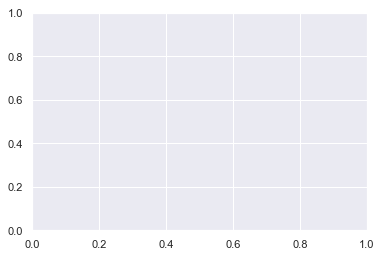

In [227]:
# plt.plot([0,20], outcomes_pivot.loc[:,["COMP_HIP_KNEE",'MORT_30_AMI']])
# outcomes_pivot.plot.line()
# df = pd.DataFrame({
# 'pig': [20, 18, 489, 675, 1776],
# 'horse': [4, 25, 281, 600, 1900]
#  }, index=[1990, 1997, 2003, 2009, 2014])
# lines = df.plot.line()
# df

# plt.boxplot(outcomes_pivot.loc[:,['COMP_HIP_KNEE']])

# plt.plot(list(range(0,500)), )
# outcomes_pivot.loc[:,["COMP_HIP_KNEE",'MORT_30_AMI']]

outcomes_pivot.boxplot(column=["COMP_HIP_KNEE"])
# outcomes_pivot.head()
# type(outcomes_pivot)
# outcomes_pivot.loc[:,['COMP_HIP_KNEE']]

In [4]:
np.count_nonzero(outcomes_pivot.columns)

20

In [5]:
# write to file for QA
# outcomes_pivot.to_csv(path_or_buf=
#                       'C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/outcomesPivot2.csv')

# pivot survey data
survey_pivot = survey.pivot(index='Provider ID', columns='HCAHPS Measure ID',
                            values='HCAHPS Linear Mean Value').reset_index()
survey_pivot.head()

HCAHPS Measure ID,Provider ID,H_CLEAN_HSP_A_P,H_CLEAN_HSP_SN_P,H_CLEAN_HSP_U_P,H_CLEAN_LINEAR_SCORE,H_CLEAN_STAR_RATING,H_COMP_1_A_P,H_COMP_1_LINEAR_SCORE,H_COMP_1_SN_P,H_COMP_1_STAR_RATING,...,H_QUIET_HSP_SN_P,H_QUIET_HSP_U_P,H_QUIET_LINEAR_SCORE,H_QUIET_STAR_RATING,H_RECMND_DN,H_RECMND_DY,H_RECMND_LINEAR_SCORE,H_RECMND_PY,H_RECMND_STAR_RATING,H_STAR_RATING
0,010001,Not Applicable,Not Applicable,Not Applicable,83,Not Applicable,Not Applicable,87,Not Applicable,Not Applicable,...,Not Applicable,Not Applicable,86,Not Applicable,Not Applicable,Not Applicable,84,Not Applicable,Not Applicable,Not Applicable
1,010005,Not Applicable,Not Applicable,Not Applicable,87,Not Applicable,Not Applicable,91,Not Applicable,Not Applicable,...,Not Applicable,Not Applicable,85,Not Applicable,Not Applicable,Not Applicable,88,Not Applicable,Not Applicable,Not Applicable
2,010006,Not Applicable,Not Applicable,Not Applicable,79,Not Applicable,Not Applicable,89,Not Applicable,Not Applicable,...,Not Applicable,Not Applicable,82,Not Applicable,Not Applicable,Not Applicable,84,Not Applicable,Not Applicable,Not Applicable
3,010007,Not Applicable,Not Applicable,Not Applicable,86,Not Applicable,Not Applicable,89,Not Applicable,Not Applicable,...,Not Applicable,Not Applicable,86,Not Applicable,Not Applicable,Not Applicable,85,Not Applicable,Not Applicable,Not Applicable
4,010008,Not Applicable,Not Applicable,Not Applicable,Not Available,Not Applicable,Not Applicable,Not Available,Not Applicable,Not Applicable,...,Not Applicable,Not Applicable,Not Available,Not Applicable,Not Applicable,Not Applicable,Not Available,Not Applicable,Not Applicable,Not Applicable


 Quick check to see if provider is duplicated for any of the columns (HCAHPS Measure ID)

In [6]:
check_if_provider_id_duplicated = survey_pivot.groupby(['Provider ID']).agg({'Provider ID':'count'}).rename(columns={"Provider ID":"count"}).reset_index()
check_if_provider_id_duplicated.head()
check_if_provider_id_duplicated[check_if_provider_id_duplicated['count']>1]

,Provider ID,count


In [7]:
len(['H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE',
                                     'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE', 'H_COMP_5_LINEAR_SCORE',
                                     'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
                                     'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE'])

10

In [8]:
# write to file for QA
# survey_pivot.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/surveyPivot2.csv')

# drop all columns that are not linear mean scores
survey_pivot_trimmed = survey_pivot[['Provider ID', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE',
                                     'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE', 'H_COMP_5_LINEAR_SCORE',
                                     'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
                                     'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']]

# survey_pivot_trimmed.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/surveyPivotTrimmed.csv')

# merge dataframes together using Provider ID as join key
df = outcomes_pivot.merge(survey_pivot_trimmed, how='outer', on='Provider ID')
# df.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/joinedData.csv')
df.head()

,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,...,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
0,010001,3,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,...,83,87,90,75,70,85,79,83,86,84
1,010005,3,15.5,Not Available,10.9,15.3,20.8,15.7,1.10,12.17,...,87,91,94,85,81,88,81,88,85,88
2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,7.19,...,79,89,91,83,76,83,80,84,82,84
3,010007,2.8,Not Available,Not Available,8.3,13.3,21.6,15.9,1.30,9.46,...,86,89,94,84,79,85,80,85,86,85
4,010008,Not Available,Not Available,Not Available,8,12.9,15.7,Not Available,Not Available,Not Available,...,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available


In [9]:
df.shape

(4944, 30)

In [10]:
# checking counts of the duplicates
survey.groupby(['Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code',
                   'Number of Completed Surveys', 'Survey Response Rate Percent'],as_index=False).size().reset_index().head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,0
0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,50
1,010005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,1135,34,50
2,010006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,579,22,50
3,010007,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467,185,27,50
4,010008,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049,63,31,50


In [11]:
survey.groupby(["Provider ID",'Survey Response Rate Percent'],as_index=False).size().reset_index().head()

,Provider ID,Survey Response Rate Percent,0
0,010001,21,50
1,010005,34,50
2,010006,22,50
3,010007,27,50
4,010008,31,50


In [12]:
# add back hospital metadata columns - location fields, number of survey responses
metadata = survey[['Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code',
                   'Number of Completed Surveys', 'Survey Response Rate Percent']].drop_duplicates()
# metadata.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/metadata2.csv')

df_full = df.merge(metadata, how='left', on='Provider ID')
# df_full.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/fullData.csv')

# replace 'Not Available' values with blanks
df_full.replace(to_replace=['Not Available', 'Not Applicable'], value=[np.nan, np.nan], inplace=True)
# df_full.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/fullDataReplaced.csv')

In [13]:
#AbCdEfGhIjKlMnOpQrStUvWxYz
df_full.head()

,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,010001,3,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,...,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506,21
1,010005,3,15.5,NaN,10.9,15.3,20.8,15.7,1.10,12.17,...,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135,34
2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,7.19,...,84,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579,22
3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,9.46,...,85,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185,27
4,010008,NaN,NaN,NaN,8,12.9,15.7,NaN,NaN,NaN,...,NaN,NaN,NaN,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63,31


### Counts of each column

In [41]:

df_full.iloc[:,list(range(1,30))].describe()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
count,2731,2411,1014,3551,3657,4176,2571,2741,2718,2970,...,3529,3529,3529,3529,3529,3529,3529,3529,3529,3529
unique,40,83,58,81,109,136,103,204,979,464,...,27,24,24,34,36,30,27,28,37,36
top,2.5,12.8,2.6,8.1,11.8,15.4,14.8,1.30,6.41,3.65,...,87,92,92,85,78,87,83,89,83,90
freq,268,98,60,156,106,110,76,228,11,31,...,364,676,665,353,385,468,574,492,294,375


# filling na as 0's vs dropping na's

In [42]:
df_full.fillna(0).head()

,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,010001,3,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,...,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506,21
1,010005,3,15.5,0,10.9,15.3,20.8,15.7,1.10,12.17,...,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135,34
2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,7.19,...,84,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579,22
3,010007,2.8,0,0,8.3,13.3,21.6,15.9,1.30,9.46,...,85,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185,27
4,010008,0,0,0,8,12.9,15.7,0,0,0,...,0,0,0,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63,31


## Before Dropping NA.

In [43]:
rows_by_state_before_dropping_na = df_full.groupby(['State']).agg({"State":"count"}).rename(columns={'State':'count'}).reset_index().sort_values(by="count", ascending=False)
rows_by_state_before_dropping_na.head()

,State,count
47,TX,408
5,CA,348
10,FL,191
16,IL,185
41,PA,178


In [44]:
rows_by_state_before_dropping_na['count'].sum()

4909

## After dropping NA's

In [45]:
na_dropped_data = df_full.dropna()

In [46]:
rows_by_state_after_dropping_na = na_dropped_data.groupby(['State']).agg({"State":"count"}).rename(columns={'State':'count'}).reset_index().sort_values(by="count", ascending=False)

In [47]:
# plt.figure(figsize=(12,10))
# sns.barplot(x='State', y="count", data= rows_by_state)
rows_by_state_after_dropping_na.head()

,State,count
4,CA,91
43,TX,90
9,FL,68
14,IL,50
38,PA,49


In [48]:
rows_by_state_after_dropping_na['count'].sum()

942

## Dropping all instead of Any

In [49]:
na_dropped_data_all = df_full.dropna(how="all")
rows_by_state_after_dropping_na_all = na_dropped_data_all.groupby(['State']).agg({"State":"count"}).rename(columns={'State':'count'}).reset_index().sort_values(by="count", ascending=False)
rows_by_state_after_dropping_na_all.head()

,State,count
47,TX,408
5,CA,348
10,FL,191
16,IL,185
41,PA,178


In [135]:
rows_by_state_after_dropping_na_all['count'].sum()

4909

In [50]:
df_full.melt()

AttributeError: 'DataFrame' object has no attribute 'reshape'

# Applying KMeans to the data (unsupervise learning)

In [5]:
# %load data_prep.py
import pandas as pd
import numpy as np
import os

# read files (need to update to zip files on github)
# os.chdir('C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project')
outcomes = pd.read_csv('./Data/Complications_and_Deaths_-_Hospital.csv')
survey = pd.read_csv('./Data/Patient_survey__HCAHPS__-_Hospital.csv')

# pivot outcomes data
outcomes_pivot = outcomes.pivot(index='Provider ID', columns='Measure ID', values='Score').reset_index()
# print(outcomes_pivot)

# write to file for QA
# outcomes_pivot.to_csv(path_or_buf=
#                       'C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/outcomesPivot2.csv')

# pivot survey data
survey_pivot = survey.pivot(index='Provider ID', columns='HCAHPS Measure ID',
                            values='HCAHPS Linear Mean Value').reset_index()
# print(survey_pivot)

# write to file for QA
# survey_pivot.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/surveyPivot2.csv')

# drop all columns that are not linear mean scores
survey_pivot_trimmed = survey_pivot[['Provider ID', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE',
                                     'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE', 'H_COMP_5_LINEAR_SCORE',
                                     'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
                                     'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']]

# survey_pivot_trimmed.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/surveyPivotTrimmed.csv')

# merge dataframes together using Provider ID as join key
df = outcomes_pivot.merge(survey_pivot_trimmed, how='outer', on='Provider ID')
# df.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/joinedData.csv')

# add back hospital metadata columns - location fields, number of survey responses
metadata = survey[['Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code',
                   'Number of Completed Surveys', 'Survey Response Rate Percent']].drop_duplicates()
# metadata.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/metadata2.csv')

df_full = df.merge(metadata, how='left', on='Provider ID')
df_full.to_csv(path_or_buf='./Data/fullData.csv')

# replace 'Not Available' values with blanks
df_full.replace(to_replace=['Not Available', 'Not Applicable'], value=[np.nan, np.nan], inplace=True)
# df_full.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/fullDataReplaced.csv')


In [18]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import fcluster
import pandas as pd
pd.set_option('display.max_columns', None)


data = pd.read_csv('./Data/fullData.csv', na_values=['Not Available', 'Not Applicable'])
data.columns

all_cols = ['COMP_HIP_KNEE', 'MORT_30_AMI',
       'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
       'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP',
       'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
       'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER',
       'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX', 'PSI_8_POST_HIP', 'PSI_90_SAFETY',
       'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE',
       'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
       'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE',
       'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
       'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']

linear_score_col = ['H_CLEAN_LINEAR_SCORE','H_COMP_1_LINEAR_SCORE',
       'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
       'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE',
       'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
       'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']

non_linear_col = ['COMP_HIP_KNEE', 'MORT_30_AMI',
       'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
       'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP',
       'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
       'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER',
       'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX', 'PSI_8_POST_HIP', 'PSI_90_SAFETY',
       'PSI_9_POST_HEM']

mortality_col = [ 'MORT_30_AMI',
       'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
       'MORT_30_STK']

data.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135.0,34.0
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,7.19,3.31,4.95,0.65,1.38,0.46,181.42,0.30,0.11,0.97,3.38,79.0,89.0,91.0,83.0,76.0,83.0,80.0,84.0,82.0,84.0,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0
3,3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,9.46,4.76,5.11,0.84,1.26,0.27,NaN,0.28,0.11,1.04,2.56,86.0,89.0,94.0,84.0,79.0,85.0,80.0,85.0,86.0,85.0,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185.0,27.0
4,4,010008,NaN,NaN,NaN,8.0,12.9,15.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.36,NaN,0.29,0.11,0.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63.0,31.0


In [19]:
subset_data = data[all_cols]
subset_data.head()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
0,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0
1,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0
2,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,7.19,3.31,4.95,0.65,1.38,0.46,181.42,0.30,0.11,0.97,3.38,79.0,89.0,91.0,83.0,76.0,83.0,80.0,84.0,82.0,84.0
3,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,9.46,4.76,5.11,0.84,1.26,0.27,NaN,0.28,0.11,1.04,2.56,86.0,89.0,94.0,84.0,79.0,85.0,80.0,85.0,86.0,85.0
4,NaN,NaN,NaN,8.0,12.9,15.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.36,NaN,0.29,0.11,0.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
subset_data.head(2)

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
0,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0
1,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0


In [21]:
subset_data.dtypes

COMP_HIP_KNEE                float64
MORT_30_AMI                  float64
MORT_30_CABG                 float64
MORT_30_COPD                 float64
MORT_30_HF                   float64
MORT_30_PN                   float64
MORT_30_STK                  float64
PSI_10_POST_KIDNEY           float64
PSI_11_POST_RESP             float64
PSI_12_POSTOP_PULMEMB_DVT    float64
PSI_13_POST_SEPSIS           float64
PSI_14_POSTOP_DEHIS          float64
PSI_15_ACC_LAC               float64
PSI_3_ULCER                  float64
PSI_4_SURG_COMP              float64
PSI_6_IAT_PTX                float64
PSI_8_POST_HIP               float64
PSI_90_SAFETY                float64
PSI_9_POST_HEM               float64
H_CLEAN_LINEAR_SCORE         float64
H_COMP_1_LINEAR_SCORE        float64
H_COMP_2_LINEAR_SCORE        float64
H_COMP_3_LINEAR_SCORE        float64
H_COMP_5_LINEAR_SCORE        float64
H_COMP_6_LINEAR_SCORE        float64
H_COMP_7_LINEAR_SCORE        float64
H_HSP_RATING_LINEAR_SCORE    float64
H

In [22]:
subset_data = subset_data.apply(lambda x : x.fillna(x.mean()), axis=0)
subset_data.head()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
0,3.000000,14.500000,4.500000,8.9,12.5,16.2,13.700000,0.650000,6.020000,5.570000,4.450000,0.570000,1.130000,0.17,161.310000,0.38,0.14,0.90,2.650000,83.000000,87.000000,90.000000,75.000000,70.00000,85.000000,79.000000,83.000000,86.000000,84.000000
1,3.000000,15.500000,3.230178,10.9,15.3,20.8,15.700000,1.100000,12.170000,3.170000,5.200000,0.750000,1.300000,0.70,181.810000,0.24,0.10,1.14,2.090000,87.000000,91.000000,94.000000,85.000000,81.00000,88.000000,81.000000,88.000000,85.000000,88.000000
2,3.600000,14.900000,3.200000,8.8,13.2,17.2,17.200000,1.280000,7.190000,3.310000,4.950000,0.650000,1.380000,0.46,181.420000,0.30,0.11,0.97,3.380000,79.000000,89.000000,91.000000,83.000000,76.00000,83.000000,80.000000,84.000000,82.000000,84.000000
3,2.800000,13.179386,3.230178,8.3,13.3,21.6,15.900000,1.300000,9.460000,4.760000,5.110000,0.840000,1.260000,0.27,161.794959,0.28,0.11,1.04,2.560000,86.000000,89.000000,94.000000,84.000000,79.00000,85.000000,80.000000,85.000000,86.000000,85.000000
4,2.596741,13.179386,3.230178,8.0,12.9,15.7,14.289226,1.307723,8.037586,3.811502,5.212011,0.857961,1.289843,0.36,161.794959,0.29,0.11,0.99,2.588898,87.965146,91.375177,91.430434,85.736753,79.20119,87.199207,81.911873,88.447152,82.239445,88.086427


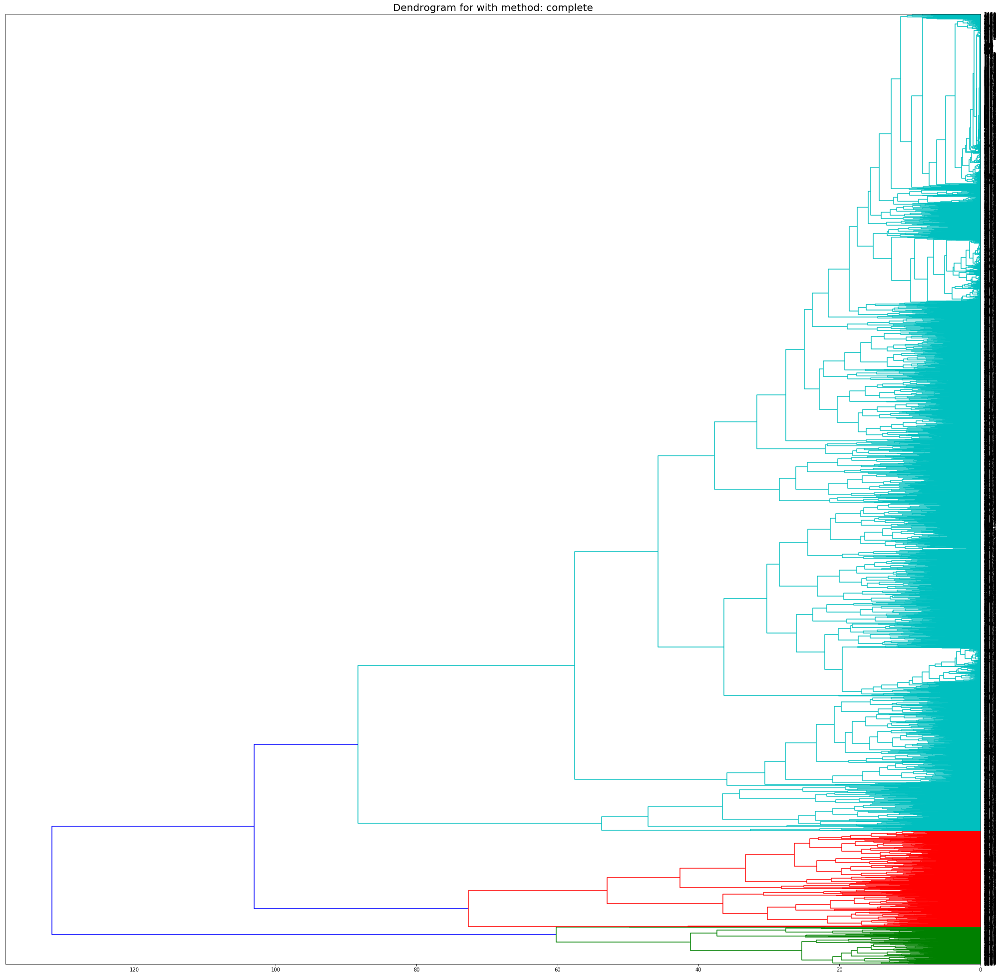

In [33]:
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
# data2 = StandardScaler().fit(subset_data)

import matplotlib.pyplot as plt
methods = ["complete"]#,"average", "weighted","centroid","ward"]
for idx, method in enumerate(methods):
    plt.figure(figsize=(35,35))


    mergings = linkage(subset_data, method=method)

    labels = fcluster(mergings, 120, criterion='distance')

    dendrogram(mergings, leaf_rotation=0, leaf_font_size=10,
               orientation="left"
              )#orientation="left"

    my_palette = plt.cm.get_cmap("Accent", 3)
    plt.title("Dendrogram for with method: {0}".format(method), fontsize=20)
    plt.show()



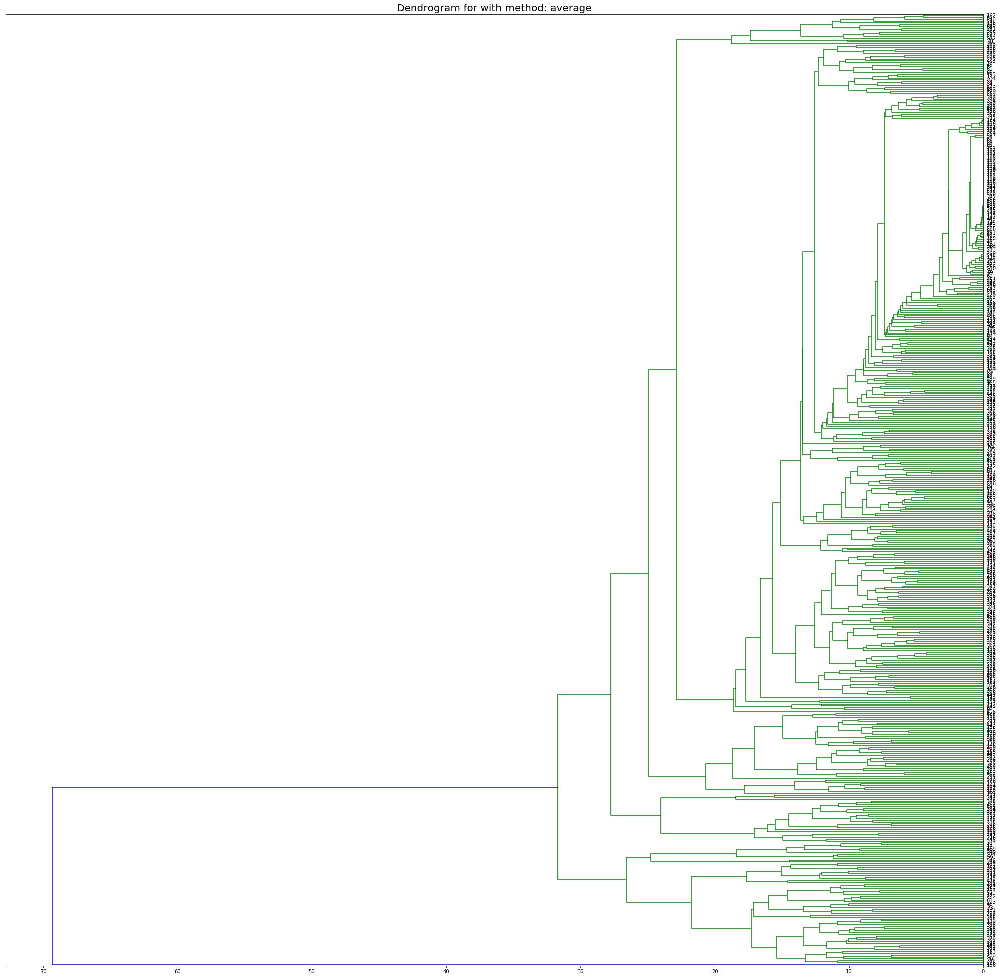

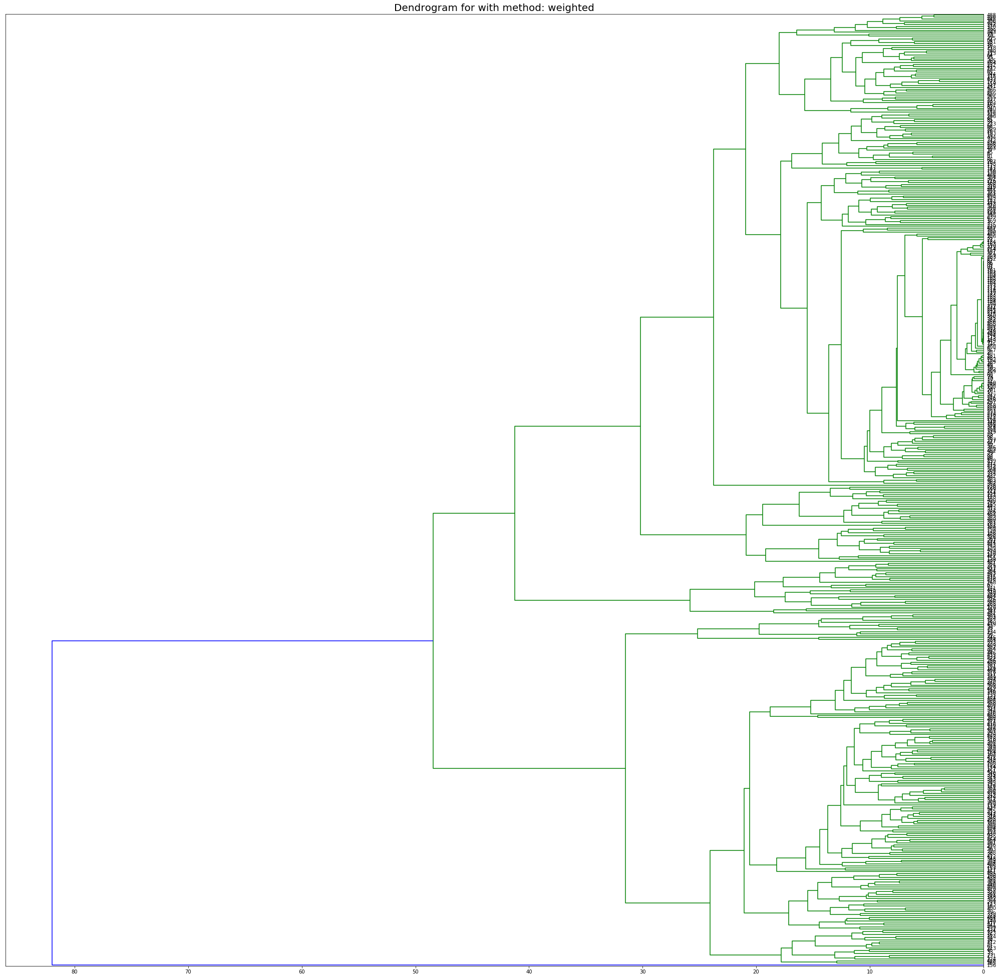

In [31]:
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
# data2 = StandardScaler().fit(subset_data)

import matplotlib.pyplot as plt
methods = ["average", "weighted"]
for idx, method in enumerate(methods):
    plt.figure(figsize=(35,35))


    mergings = linkage(subset_data[0:500], method=method)

    labels = fcluster(mergings, 120, criterion='distance')

    dendrogram(mergings, leaf_rotation=0, leaf_font_size=10,
               orientation="left"
              )#orientation="left"

    my_palette = plt.cm.get_cmap("Accent", 3)
    plt.title("Dendrogram for with method: {0}".format(method), fontsize=20)
    plt.show()

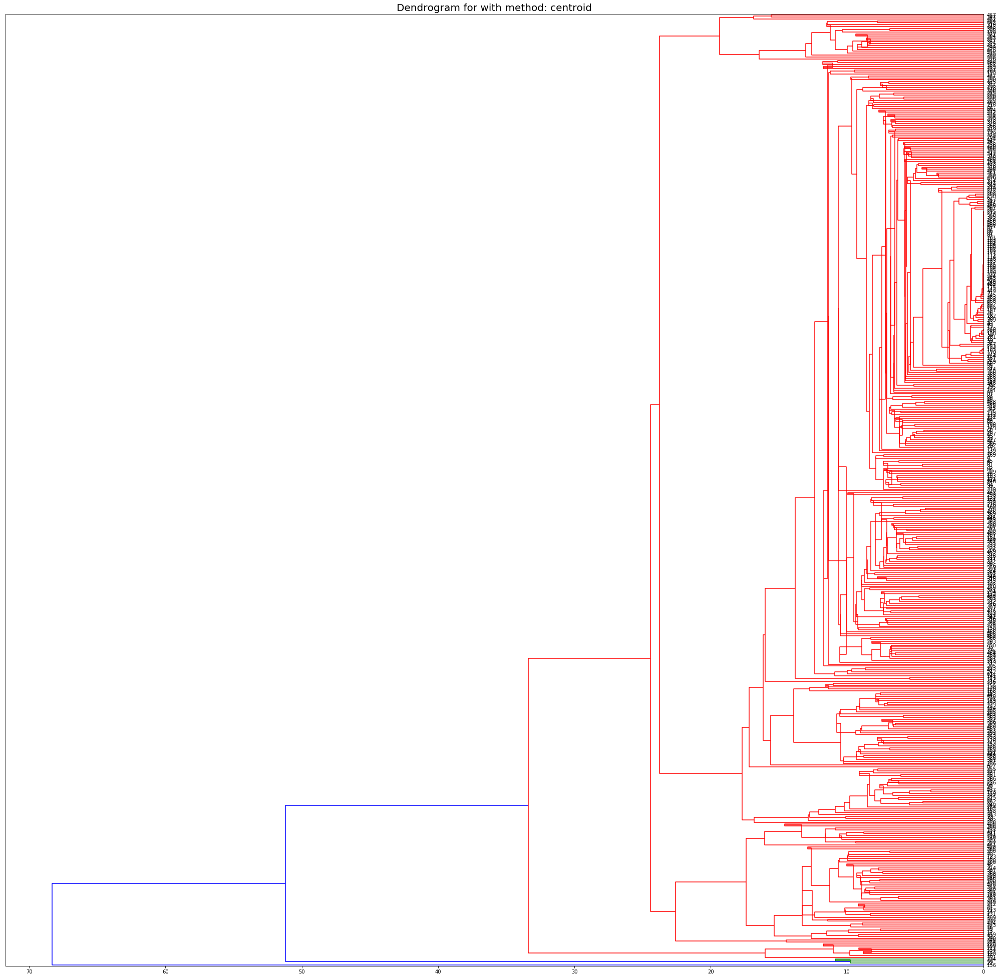

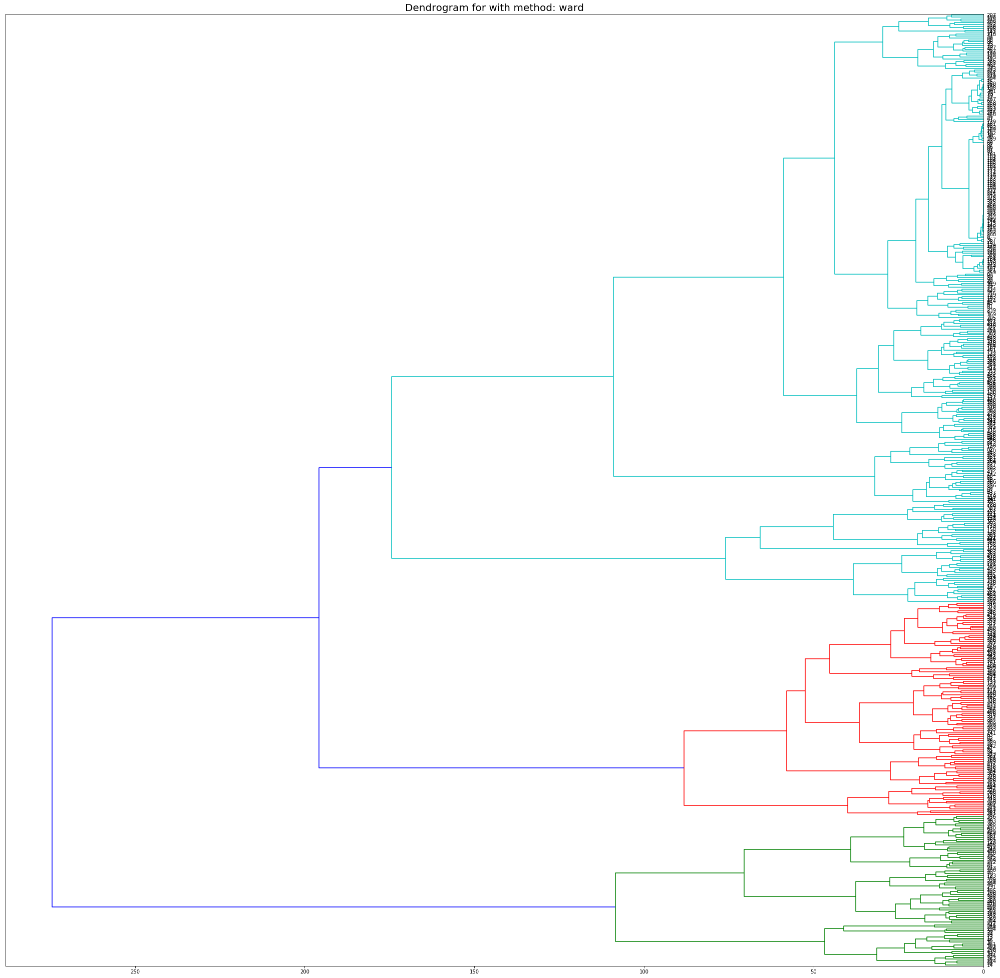

In [32]:
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
# data2 = StandardScaler().fit(subset_data)

import matplotlib.pyplot as plt
methods = ["centroid","ward"]
for idx, method in enumerate(methods):
    plt.figure(figsize=(35,35))


    mergings = linkage(subset_data[0:500], method=method)

    labels = fcluster(mergings, 120, criterion='distance')

    dendrogram(mergings, leaf_rotation=0, leaf_font_size=10,
               orientation="left"
              )#orientation="left"

    my_palette = plt.cm.get_cmap("Accent", 3)
    plt.title("Dendrogram for with method: {0}".format(method), fontsize=20)
    plt.show()

Collabrativ filter

In [15]:
survey.head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,HCAHPS Measure ID,HCAHPS Question,...,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote,Measure Start Date,Measure End Date,Location
0,241335,ST ELIZABETH MEDICAL CENTER,1200 GRANT BLVD W,WABASHA,MN,55981,WABASHA,6515654531,H_COMP_5_LINEAR_SCORE,Communication about medicines - linear mean score,...,NaN,NaN,NaN,58.0,6 - Fewer than 100 patients completed the HCAH...,34.0,6 - Fewer than 100 patients completed the HCAH...,07/01/2017,06/30/2018,"1200 GRANT BLVD W WABASHA, MN 55981 (44.386416..."
1,241322,RAINY LAKE MEDICAL CENTER,1400 HIGHWAY 71,INTERNATIONAL FALLS,MN,56649,KOOCHICHING,2182834481,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...",...,4.0,6 - Fewer than 100 patients completed the HCAH...,NaN,86.0,6 - Fewer than 100 patients completed the HCAH...,32.0,6 - Fewer than 100 patients completed the HCAH...,07/01/2017,06/30/2018,"1400 HIGHWAY 71 INTERNATIONAL FALLS, MN 56649 ..."
2,241317,NORTH SHORE HEALTH,515 5TH AVE WEST,GRAND MARAIS,MN,55604,COOK,2183873040,H_COMP_5_STAR_RATING,Communication about medicines - star rating,...,NaN,NaN,NaN,26.0,10 - Very few patients were eligible for the H...,46.0,10 - Very few patients were eligible for the H...,07/01/2017,06/30/2018,"515 5TH AVE WEST GRAND MARAIS, MN 55604 (47.75..."
3,241342,ORTONVILLE AREA HEALTH SERVICES,450 EASTVOLD AVE,ORTONVILLE,MN,56278,BIG STONE,3208392502,H_STAR_RATING,Summary star rating,...,NaN,NaN,NaN,81.0,6 - Fewer than 100 patients completed the HCAH...,36.0,6 - Fewer than 100 patients completed the HCAH...,07/01/2017,06/30/2018,"450 EASTVOLD AVE ORTONVILLE, MN 56278 (45.3147..."
4,241327,SLEEPY EYE MUNICIPAL HOSPITAL,400 FOURTH AVENUE NORTHWEST,SLEEPY EYE,MN,56085,BROWN,5077943571,H_COMP_5_SN_P,"Patients who reported that staff ""Sometimes"" o...",...,5.0,6 - Fewer than 100 patients completed the HCAH...,NaN,57.0,6 - Fewer than 100 patients completed the HCAH...,35.0,6 - Fewer than 100 patients completed the HCAH...,07/01/2017,06/30/2018,"400 FOURTH AVENUE NORTHWEST SLEEPY EYE, MN 560..."


In [31]:
survey_pivot = survey.pivot(index='Provider ID', columns='HCAHPS Measure ID',
                            values='HCAHPS Linear Mean Value')
survey_pivot.head()



HCAHPS Measure ID,H_CLEAN_HSP_A_P,H_CLEAN_HSP_SN_P,H_CLEAN_HSP_U_P,H_CLEAN_LINEAR_SCORE,H_CLEAN_STAR_RATING,H_COMP_1_A_P,H_COMP_1_LINEAR_SCORE,H_COMP_1_SN_P,H_COMP_1_STAR_RATING,H_COMP_1_U_P,...,H_QUIET_HSP_SN_P,H_QUIET_HSP_U_P,H_QUIET_LINEAR_SCORE,H_QUIET_STAR_RATING,H_RECMND_DN,H_RECMND_DY,H_RECMND_LINEAR_SCORE,H_RECMND_PY,H_RECMND_STAR_RATING,H_STAR_RATING
Provider ID,,,,,,,,,,,,,,,,,,,,,
010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,NaN,...,NaN,NaN,86.0,NaN,NaN,NaN,84.0,NaN,NaN,NaN
010005,NaN,NaN,NaN,87.0,NaN,NaN,91.0,NaN,NaN,NaN,...,NaN,NaN,85.0,NaN,NaN,NaN,88.0,NaN,NaN,NaN
010006,NaN,NaN,NaN,79.0,NaN,NaN,89.0,NaN,NaN,NaN,...,NaN,NaN,82.0,NaN,NaN,NaN,84.0,NaN,NaN,NaN
010007,NaN,NaN,NaN,86.0,NaN,NaN,89.0,NaN,NaN,NaN,...,NaN,NaN,86.0,NaN,NaN,NaN,85.0,NaN,NaN,NaN
010008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Checking the pivot the other way

In [110]:
survey_pivot_v2 = survey.pivot(index='HCAHPS Measure ID', columns='Provider ID',
                            values='HCAHPS Linear Mean Value')
survey_pivot_v2.head()



Provider ID,010001,010005,010006,010007,010008,010011,010012,010016,010018,010019,...,670113,670115,670116,670117,670118,670119,670120,670121,670122,670124
HCAHPS Measure ID,,,,,,,,,,,,,,,,,,,,,
H_CLEAN_HSP_A_P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H_CLEAN_HSP_SN_P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H_CLEAN_HSP_U_P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H_CLEAN_LINEAR_SCORE,83.0,87.0,79.0,86.0,NaN,84.0,86.0,84.0,NaN,82.0,...,NaN,NaN,92.0,NaN,NaN,NaN,89.0,NaN,88.0,NaN
H_CLEAN_STAR_RATING,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
outcomes.head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,County Name,Phone Number,Measure Name,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date,Location
0,241304,SANFORD MEDICAL CENTER WHEATON,401 12TH STREET NORTH,WHEATON,MN,56296,TRAVERSE,3205638226,Rate of complications for hip/knee replacement...,COMP_HIP_KNEE,Not Available,Not Available,Not Available,Not Available,Not Available,5 - Results are not available for this reporti...,04/01/2014,03/31/2017,"401 12TH STREET NORTH WHEATON, MN 56296 (45.80..."
1,240080,"UNIVERSITY OF MINNESOTA MEDICAL CENTER, FAIRVIEW",2450 RIVERSIDE AVENUE,MINNEAPOLIS,MN,55454,HENNEPIN,6122733000,Pressure sores,PSI_3_ULCER,No Different than the National Rate,5964,0.12,0,0.49,NaN,10/01/2015,06/30/2017,"2450 RIVERSIDE AVENUE MINNEAPOLIS, MN 55454 (4..."
2,240076,BUFFALO HOSPITAL,303 CATLIN ST,BUFFALO,MN,55313,WRIGHT,7636841212,Death rate for stroke patients,MORT_30_STK,Number of Cases Too Small,Not Available,Not Available,Not Available,Not Available,1 - The number of cases/patients is too few to...,07/01/2014,06/30/2017,"303 CATLIN ST BUFFALO, MN 55313 (45.1932, -93...."
3,240196,PHILLIPS EYE INSTITUTE,2215 PARK AVENUE SOUTH,MINNEAPOLIS,MN,55404,HENNEPIN,6127758751,Postoperative Acute Kidney Injury Requiring Di...,PSI_10_POST_KIDNEY,Number of Cases Too Small,Not Available,Not Available,Not Available,Not Available,1 - The number of cases/patients is too few to...,10/01/2015,06/30/2017,"2215 PARK AVENUE SOUTH MINNEAPOLIS, MN 55404 (..."
4,240084,ESSENTIA HEALTH VIRGINIA,901 9TH STREET NORTH,VIRGINIA,MN,55792,ST. LOUIS,2187413340,Pressure sores,PSI_3_ULCER,No Different than the National Rate,359,0.32,0,1.35,NaN,10/01/2015,06/30/2017,"901 9TH STREET NORTH VIRGINIA, MN 55792 (47.53..."


In [20]:
merged = pd.merge(survey_pivot, outcomes, on='Provider ID')


In [21]:
merged.head()

,Provider ID,H_CLEAN_HSP_A_P,H_CLEAN_HSP_SN_P,H_CLEAN_HSP_U_P,H_CLEAN_LINEAR_SCORE,H_CLEAN_STAR_RATING,H_COMP_1_A_P,H_COMP_1_LINEAR_SCORE,H_COMP_1_SN_P,H_COMP_1_STAR_RATING,...,Measure ID,Compared to National,Denominator,Score,Lower Estimate,Higher Estimate,Footnote,Measure Start Date,Measure End Date,Location
0,010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,...,MORT_30_STK,No Different than the National Rate,604,13.7,11.5,16.5,NaN,07/01/2014,06/30/2017,"1108 ROSS CLARK CIRCLE DOTHAN, AL 36301 (31.21..."
1,010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,...,MORT_30_PN,No Different than the National Rate,553,16.2,13.7,19.2,NaN,07/01/2014,06/30/2017,"1108 ROSS CLARK CIRCLE DOTHAN, AL 36301 (31.21..."
2,010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,...,MORT_30_CABG,No Different than the National Rate,302,4.5,2.9,7.0,NaN,07/01/2014,06/30/2017,"1108 ROSS CLARK CIRCLE DOTHAN, AL 36301 (31.21..."
3,010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,...,PSI_6_IAT_PTX,No Different than the National Rate,14020,0.38,0.2,0.56,NaN,10/01/2015,06/30/2017,"1108 ROSS CLARK CIRCLE DOTHAN, AL 36301 (31.21..."
4,010001,NaN,NaN,NaN,83.0,NaN,NaN,87.0,NaN,NaN,...,PSI_90_SAFETY,No Different than the National Value,Not Available,0.90,0.68,1.12,NaN,10/01/2015,06/30/2017,"1108 ROSS CLARK CIRCLE DOTHAN, AL 36301 (31.21..."


In [29]:
merged['Provider ID'].value_counts().sort_values(ascending=False).head(10)


110132    19
450211    19
440053    19
330125    19
450085    19
041300    19
360017    19
340041    19
530008    19
140089    19
Name: Provider ID, dtype: int64

In [30]:
survey_pivot.to_csv("survey_pivot.csv")

In [111]:
data = survey_pivot.applymap(lambda x : 1 if x>85 else 0).values

data2 = survey_pivot_v2.applymap(lambda x : 1 if x>85 else 0).values

In [112]:
data

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]])

In [113]:
data2

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [114]:
# Define the Cosine Similarity function

def cosine_similarity(u, v):
    return(np.dot(u, v)/np.sqrt((np.dot(u, u) * np.dot(v, v))))

In [115]:
data.shape

(4909, 51)

In [116]:
data2.shape

(50, 4909)

In [48]:
x[1:].shape

(4908, 50)

In [117]:
x = data
xx = data2

In [118]:
y = data[0]

yy = data2[0]

In [49]:
import numpy as np
similarity = np.apply_along_axis(cosine_similarity, 1, x[1:], y )

/Users/venku/anaconda3/envs/data_mining/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


In [50]:
similarity

array([0.47140452, 0.81649658, 0.8660254 , ...,        nan, 0.61237244,
              nan])

In [43]:
maximum = np.nanmax(similarity)

In [44]:
maximum

1.0

In [51]:
# Here we got the similarity of the row this first row matches.
usr_idx = np.where(similarity==maximum)[0][0]

In [59]:
usr_idx

33

In [82]:
x[1:][usr_idx]

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0])

In [84]:
x[usr_idx]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0])

In [89]:
y.shape
x[usr_idx].shape

(50,)

In [119]:
surv_vec = y - x[usr_idx+1]

In [120]:
surv_vec

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0])

In [121]:
surv_vec.shape

(51,)

In [122]:
# We want a mask aray, so we zero out any recommended movie.
# (any negative value is a movie to recommend)
surv_vec[surv_vec >= 0] = 1
surv_vec[surv_vec < 0] = 0

In [123]:
surv_vec

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1])

In [124]:
i, = np.where(x[1:][33] == 1)

In [125]:
i

array([ 6, 11, 42])

In [66]:
survey_pivot['tmp_idx'] = np.array(range(x.shape[0]))

In [67]:
surv_col_name  = survey_pivot[survey_pivot.tmp_idx == usr_idx].columns

In [68]:
surv_col_name

Index(['H_CLEAN_HSP_A_P', 'H_CLEAN_HSP_SN_P', 'H_CLEAN_HSP_U_P',
       'H_CLEAN_LINEAR_SCORE', 'H_CLEAN_STAR_RATING', 'H_COMP_1_A_P',
       'H_COMP_1_LINEAR_SCORE', 'H_COMP_1_SN_P', 'H_COMP_1_STAR_RATING',
       'H_COMP_1_U_P', 'H_COMP_2_A_P', 'H_COMP_2_LINEAR_SCORE',
       'H_COMP_2_SN_P', 'H_COMP_2_STAR_RATING', 'H_COMP_2_U_P', 'H_COMP_3_A_P',
       'H_COMP_3_LINEAR_SCORE', 'H_COMP_3_SN_P', 'H_COMP_3_STAR_RATING',
       'H_COMP_3_U_P', 'H_COMP_5_A_P', 'H_COMP_5_LINEAR_SCORE',
       'H_COMP_5_SN_P', 'H_COMP_5_STAR_RATING', 'H_COMP_5_U_P',
       'H_COMP_6_LINEAR_SCORE', 'H_COMP_6_N_P', 'H_COMP_6_STAR_RATING',
       'H_COMP_6_Y_P', 'H_COMP_7_A', 'H_COMP_7_D_SD', 'H_COMP_7_LINEAR_SCORE',
       'H_COMP_7_SA', 'H_COMP_7_STAR_RATING', 'H_HSP_RATING_0_6',
       'H_HSP_RATING_7_8', 'H_HSP_RATING_9_10', 'H_HSP_RATING_LINEAR_SCORE',
       'H_HSP_RATING_STAR_RATING', 'H_QUIET_HSP_A_P', 'H_QUIET_HSP_SN_P',
       'H_QUIET_HSP_U_P', 'H_QUIET_LINEAR_SCORE', 'H_QUIET_STAR_RATING',
      

In [71]:
import numpy.ma as ma

In [103]:
surv_vec.shape

(50,)

In [100]:
surv_col_name[:-1].shape

(50,)

In [101]:
surv_col_name[:-1]

Index(['H_CLEAN_HSP_A_P', 'H_CLEAN_HSP_SN_P', 'H_CLEAN_HSP_U_P',
       'H_CLEAN_LINEAR_SCORE', 'H_CLEAN_STAR_RATING', 'H_COMP_1_A_P',
       'H_COMP_1_LINEAR_SCORE', 'H_COMP_1_SN_P', 'H_COMP_1_STAR_RATING',
       'H_COMP_1_U_P', 'H_COMP_2_A_P', 'H_COMP_2_LINEAR_SCORE',
       'H_COMP_2_SN_P', 'H_COMP_2_STAR_RATING', 'H_COMP_2_U_P', 'H_COMP_3_A_P',
       'H_COMP_3_LINEAR_SCORE', 'H_COMP_3_SN_P', 'H_COMP_3_STAR_RATING',
       'H_COMP_3_U_P', 'H_COMP_5_A_P', 'H_COMP_5_LINEAR_SCORE',
       'H_COMP_5_SN_P', 'H_COMP_5_STAR_RATING', 'H_COMP_5_U_P',
       'H_COMP_6_LINEAR_SCORE', 'H_COMP_6_N_P', 'H_COMP_6_STAR_RATING',
       'H_COMP_6_Y_P', 'H_COMP_7_A', 'H_COMP_7_D_SD', 'H_COMP_7_LINEAR_SCORE',
       'H_COMP_7_SA', 'H_COMP_7_STAR_RATING', 'H_HSP_RATING_0_6',
       'H_HSP_RATING_7_8', 'H_HSP_RATING_9_10', 'H_HSP_RATING_LINEAR_SCORE',
       'H_HSP_RATING_STAR_RATING', 'H_QUIET_HSP_A_P', 'H_QUIET_HSP_SN_P',
       'H_QUIET_HSP_U_P', 'H_QUIET_LINEAR_SCORE', 'H_QUIET_STAR_RATING',
      

In [104]:
ma_surv_idx = ma.array(surv_col_name[:-1], mask=surv_vec)

In [105]:
ma_surv_idx

masked_array(data=['H_CLEAN_HSP_A_P', 'H_CLEAN_HSP_SN_P',
                   'H_CLEAN_HSP_U_P', 'H_CLEAN_LINEAR_SCORE',
                   'H_CLEAN_STAR_RATING', 'H_COMP_1_A_P', --,
                   'H_COMP_1_SN_P', 'H_COMP_1_STAR_RATING',
                   'H_COMP_1_U_P', 'H_COMP_2_A_P', --, 'H_COMP_2_SN_P',
                   'H_COMP_2_STAR_RATING', 'H_COMP_2_U_P', 'H_COMP_3_A_P',
                   'H_COMP_3_LINEAR_SCORE', 'H_COMP_3_SN_P',
                   'H_COMP_3_STAR_RATING', 'H_COMP_3_U_P', 'H_COMP_5_A_P',
                   'H_COMP_5_LINEAR_SCORE', 'H_COMP_5_SN_P',
                   'H_COMP_5_STAR_RATING', 'H_COMP_5_U_P',
                   'H_COMP_6_LINEAR_SCORE', 'H_COMP_6_N_P',
                   'H_COMP_6_STAR_RATING', 'H_COMP_6_Y_P', 'H_COMP_7_A',
                   'H_COMP_7_D_SD', 'H_COMP_7_LINEAR_SCORE',
                   'H_COMP_7_SA', 'H_COMP_7_STAR_RATING',
                   'H_HSP_RATING_0_6', 'H_HSP_RATING_7_8',
                   'H_HSP_RATING_9_10', 'H_H

In [107]:
surv_idx_col_name = ma_surv_idx[~ma_surv_idx.mask]

In [108]:
surv_idx_col_name

masked_array(data=['H_CLEAN_HSP_A_P', 'H_CLEAN_HSP_SN_P',
                   'H_CLEAN_HSP_U_P', 'H_CLEAN_LINEAR_SCORE',
                   'H_CLEAN_STAR_RATING', 'H_COMP_1_A_P', 'H_COMP_1_SN_P',
                   'H_COMP_1_STAR_RATING', 'H_COMP_1_U_P', 'H_COMP_2_A_P',
                   'H_COMP_2_SN_P', 'H_COMP_2_STAR_RATING',
                   'H_COMP_2_U_P', 'H_COMP_3_A_P',
                   'H_COMP_3_LINEAR_SCORE', 'H_COMP_3_SN_P',
                   'H_COMP_3_STAR_RATING', 'H_COMP_3_U_P', 'H_COMP_5_A_P',
                   'H_COMP_5_LINEAR_SCORE', 'H_COMP_5_SN_P',
                   'H_COMP_5_STAR_RATING', 'H_COMP_5_U_P',
                   'H_COMP_6_LINEAR_SCORE', 'H_COMP_6_N_P',
                   'H_COMP_6_STAR_RATING', 'H_COMP_6_Y_P', 'H_COMP_7_A',
                   'H_COMP_7_D_SD', 'H_COMP_7_LINEAR_SCORE',
                   'H_COMP_7_SA', 'H_COMP_7_STAR_RATING',
                   'H_HSP_RATING_0_6', 'H_HSP_RATING_7_8',
                   'H_HSP_RATING_9_10', 'H_HSP_RATIN

In [130]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [132]:
data[0]

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0])

In [133]:
data[33+1]

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0])

In [134]:
survey_pivot.iloc[0]

HCAHPS Measure ID
H_CLEAN_HSP_A_P               NaN
H_CLEAN_HSP_SN_P              NaN
H_CLEAN_HSP_U_P               NaN
H_CLEAN_LINEAR_SCORE         83.0
H_CLEAN_STAR_RATING           NaN
H_COMP_1_A_P                  NaN
H_COMP_1_LINEAR_SCORE        87.0
H_COMP_1_SN_P                 NaN
H_COMP_1_STAR_RATING          NaN
H_COMP_1_U_P                  NaN
H_COMP_2_A_P                  NaN
H_COMP_2_LINEAR_SCORE        90.0
H_COMP_2_SN_P                 NaN
H_COMP_2_STAR_RATING          NaN
H_COMP_2_U_P                  NaN
H_COMP_3_A_P                  NaN
H_COMP_3_LINEAR_SCORE        75.0
H_COMP_3_SN_P                 NaN
H_COMP_3_STAR_RATING          NaN
H_COMP_3_U_P                  NaN
H_COMP_5_A_P                  NaN
H_COMP_5_LINEAR_SCORE        70.0
H_COMP_5_SN_P                 NaN
H_COMP_5_STAR_RATING          NaN
H_COMP_5_U_P                  NaN
H_COMP_6_LINEAR_SCORE        85.0
H_COMP_6_N_P                  NaN
H_COMP_6_STAR_RATING          NaN
H_COMP_6_Y_P                  

In [135]:
survey_pivot.iloc[33+1]

HCAHPS Measure ID
H_CLEAN_HSP_A_P               NaN
H_CLEAN_HSP_SN_P              NaN
H_CLEAN_HSP_U_P               NaN
H_CLEAN_LINEAR_SCORE         83.0
H_CLEAN_STAR_RATING           NaN
H_COMP_1_A_P                  NaN
H_COMP_1_LINEAR_SCORE        90.0
H_COMP_1_SN_P                 NaN
H_COMP_1_STAR_RATING          NaN
H_COMP_1_U_P                  NaN
H_COMP_2_A_P                  NaN
H_COMP_2_LINEAR_SCORE        90.0
H_COMP_2_SN_P                 NaN
H_COMP_2_STAR_RATING          NaN
H_COMP_2_U_P                  NaN
H_COMP_3_A_P                  NaN
H_COMP_3_LINEAR_SCORE        85.0
H_COMP_3_SN_P                 NaN
H_COMP_3_STAR_RATING          NaN
H_COMP_3_U_P                  NaN
H_COMP_5_A_P                  NaN
H_COMP_5_LINEAR_SCORE        78.0
H_COMP_5_SN_P                 NaN
H_COMP_5_STAR_RATING          NaN
H_COMP_5_U_P                  NaN
H_COMP_6_LINEAR_SCORE        84.0
H_COMP_6_N_P                  NaN
H_COMP_6_STAR_RATING          NaN
H_COMP_6_Y_P                  

# Paris Grid

In [228]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [229]:
data=pd.read_csv('hospitalData.csv')

In [230]:
datafill = data.fillna(data.mean())

In [231]:
y=datafill.iloc[:,2:21]
x=datafill.iloc[:,22:31]

<Figure size 1080x1296 with 0 Axes>

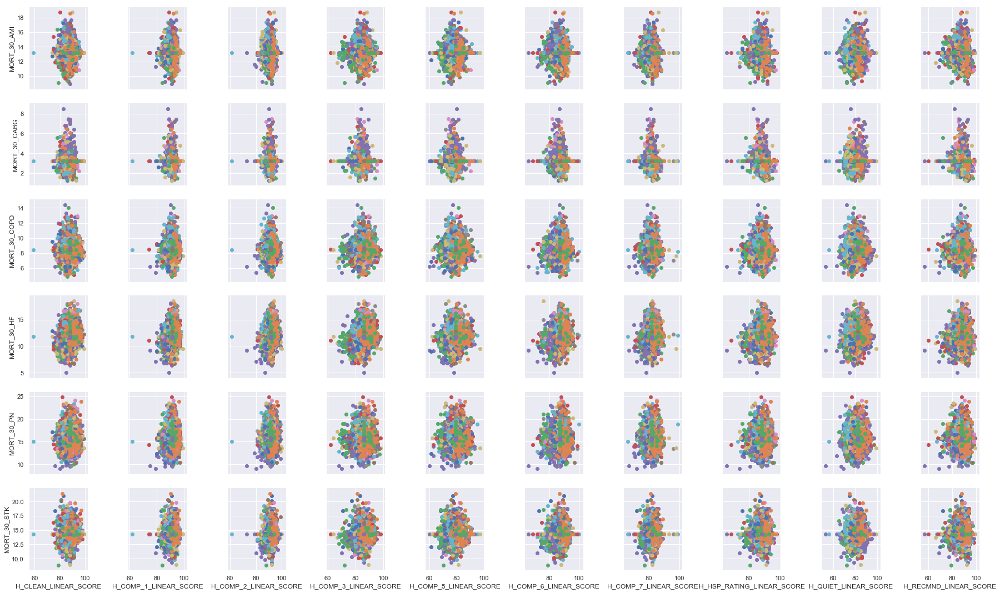

In [332]:
plt.figure(figsize=(15,18))
g = sns.PairGrid(datafill, 
                 x_vars = ['H_CLEAN_LINEAR_SCORE' , 'H_COMP_1_LINEAR_SCORE' , 'H_COMP_2_LINEAR_SCORE' , 
                           'H_COMP_3_LINEAR_SCORE' , 'H_COMP_5_LINEAR_SCORE' , 'H_COMP_6_LINEAR_SCORE' , 
                           'H_COMP_7_LINEAR_SCORE' , 'H_HSP_RATING_LINEAR_SCORE' , 'H_QUIET_LINEAR_SCORE' , 
                           'H_RECMND_LINEAR_SCORE'], 
                 y_vars= ['MORT_30_AMI' , 'MORT_30_CABG' , 'MORT_30_COPD' , 'MORT_30_HF' , 'MORT_30_PN' , 'MORT_30_STK'],
                 hue="State",palette=sns.color_palette() )
g = g.map(plt.scatter)
plt.savefig("PariGrid1.jpg")

<Figure size 1080x1296 with 0 Axes>

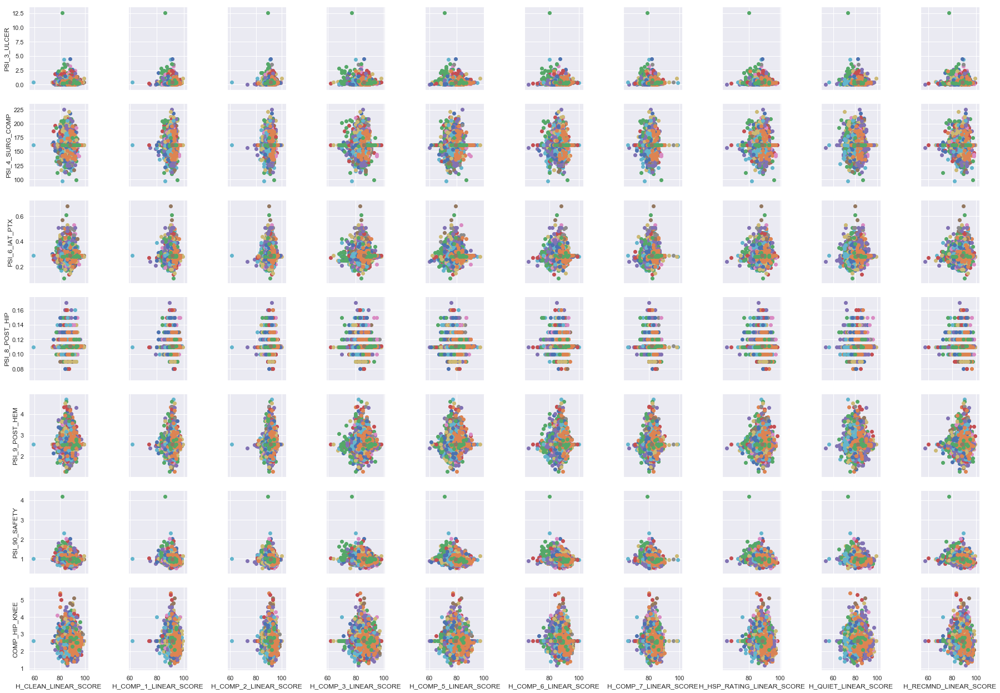

In [333]:
plt.figure(figsize=(15,18))
g = sns.PairGrid(datafill, 
                 x_vars = ['H_CLEAN_LINEAR_SCORE' , 'H_COMP_1_LINEAR_SCORE' , 'H_COMP_2_LINEAR_SCORE' , 
                           'H_COMP_3_LINEAR_SCORE' , 'H_COMP_5_LINEAR_SCORE' , 'H_COMP_6_LINEAR_SCORE' , 
                           'H_COMP_7_LINEAR_SCORE' , 'H_HSP_RATING_LINEAR_SCORE' , 'H_QUIET_LINEAR_SCORE' , 
                           'H_RECMND_LINEAR_SCORE'], 
                 y_vars= [
"PSI_3_ULCER",
"PSI_4_SURG_COMP",
"PSI_6_IAT_PTX",
"PSI_8_POST_HIP",
"PSI_9_POST_HEM",
"PSI_90_SAFETY",
"COMP_HIP_KNEE"],
                 hue="State", palette=sns.color_palette())
g = g.map(plt.scatter)

plt.savefig("PariGrid2.jpg")


<Figure size 1080x1296 with 0 Axes>

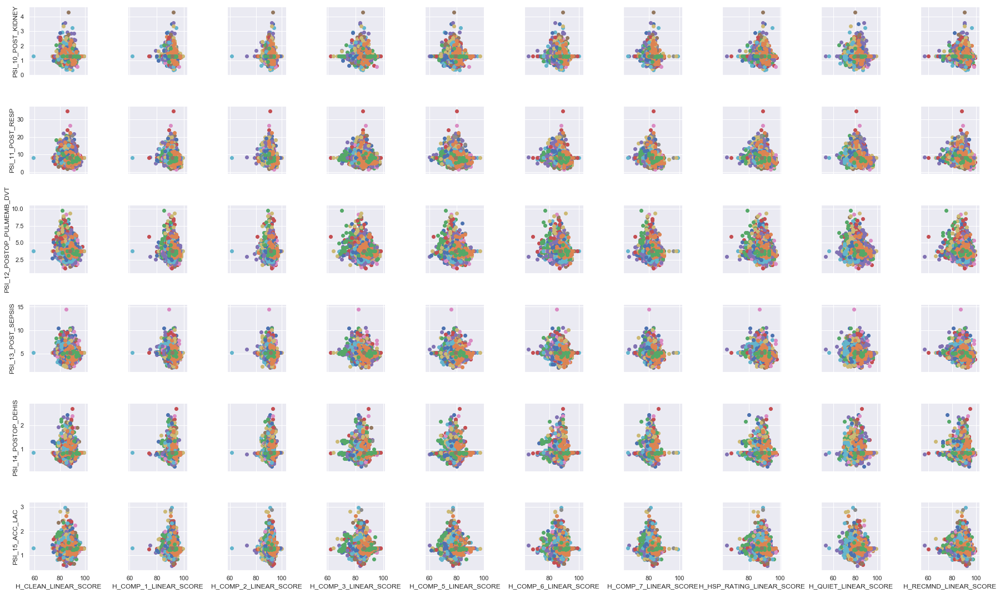

In [334]:
plt.figure(figsize=(15,18))
g = sns.PairGrid(datafill, 
                 x_vars = ['H_CLEAN_LINEAR_SCORE' , 'H_COMP_1_LINEAR_SCORE' , 'H_COMP_2_LINEAR_SCORE' , 
                           'H_COMP_3_LINEAR_SCORE' , 'H_COMP_5_LINEAR_SCORE' , 'H_COMP_6_LINEAR_SCORE' , 
                           'H_COMP_7_LINEAR_SCORE' , 'H_HSP_RATING_LINEAR_SCORE' , 'H_QUIET_LINEAR_SCORE' , 
                           'H_RECMND_LINEAR_SCORE'], 
                 y_vars= ["PSI_10_POST_KIDNEY",
"PSI_11_POST_RESP",
"PSI_12_POSTOP_PULMEMB_DVT",
"PSI_13_POST_SEPSIS",
"PSI_14_POSTOP_DEHIS",
"PSI_15_ACC_LAC"],
                 hue="State", palette=sns.color_palette())
g = g.map(plt.scatter)
plt.savefig("PariGrid3.jpg")

In [287]:

pd.set_option('display.max_columns', None)
datafill.describe()

,Unnamed: 0,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
count,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000,4944.000000
mean,2471.500000,2.596741,13.179386,3.230178,8.400422,11.773804,15.808070,14.289226,1.307723,8.037586,3.811502,5.212011,0.857961,1.289843,0.384768,161.794959,0.287304,0.110920,0.994331,2.588898,87.965146,91.375177,91.430434,85.736753,79.201190,87.199207,81.911873,88.447152,82.239445,88.086427,53858.319821,685.481552,26.372044
std,1427.354196,0.383712,0.851480,0.430685,0.941212,1.479533,1.826931,1.099641,0.231601,2.175556,0.709594,0.797482,0.186894,0.182006,0.338591,10.004094,0.037973,0.007518,0.140898,0.277518,3.236098,2.213072,2.129016,3.669054,3.610994,3.004783,2.323502,2.802141,4.346063,3.678971,26863.119996,806.878867,8.262556
min,0.000000,1.200000,8.900000,1.300000,4.900000,5.000000,9.000000,8.900000,0.330000,1.550000,1.210000,2.090000,0.270000,0.570000,0.020000,96.820000,0.110000,0.080000,0.520000,1.290000,59.000000,62.000000,61.000000,62.000000,60.000000,66.000000,66.000000,66.000000,53.000000,57.000000,603.000000,25.000000,3.000000
25%,1235.750000,2.500000,13.179386,3.230178,7.900000,11.000000,14.800000,14.100000,1.260000,7.190000,3.570000,4.990000,0.790000,1.230000,0.240000,161.794959,0.280000,0.110000,0.940000,2.510000,87.000000,91.000000,91.000000,84.000000,78.000000,86.000000,81.000000,87.000000,81.000000,87.000000,32951.250000,206.000000,21.000000
50%,2471.500000,2.596741,13.179386,3.230178,8.400422,11.773804,15.808070,14.289226,1.307723,8.037586,3.811502,5.212011,0.857961,1.289843,0.384768,161.794959,0.287304,0.110000,0.994331,2.588898,87.965146,91.375177,91.430434,85.736753,79.201190,87.199207,81.911873,88.447152,82.239445,88.086427,55037.000000,502.000000,26.372044
75%,3707.250000,2.600000,13.179386,3.230178,8.700000,12.400000,16.800000,14.300000,1.307723,8.037586,3.811502,5.212011,0.857961,1.289843,0.384768,161.794959,0.287304,0.110920,1.000000,2.588898,89.000000,92.000000,92.000000,87.000000,81.000000,89.000000,83.000000,90.000000,84.000000,90.000000,75987.250000,695.250000,30.000000
max,4943.000000,5.400000,18.700000,8.500000,14.400000,18.500000,24.800000,21.400000,4.310000,34.750000,9.820000,14.450000,2.700000,2.980000,12.600000,225.890000,0.680000,0.170000,4.210000,4.690000,99.000000,99.000000,100.000000,98.000000,97.000000,100.000000,99.000000,98.000000,99.000000,99.000000,99929.000000,11999.000000,82.000000


In [292]:
datafill[datafill['PSI_3_ULCER']>11]

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
2990,2990,330196,2.596741,12.6,3.230178,9.0,8.7,17.7,13.5,1.307723,8.037586,6.23,5.212011,1.27,1.16,12.6,172.12,0.4,0.12,4.21,2.58,82.0,86.0,89.0,77.0,71.0,80.0,79.0,80.0,73.0,77.0,CONEY ISLAND HOSPITAL,2601 OCEAN PARKWAY,BROOKLYN,NY,11235.0,571.0,10.0


In [294]:
datafill[datafill['PSI_90_SAFETY']>3]


,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
2990,2990,330196,2.596741,12.6,3.230178,9.0,8.7,17.7,13.5,1.307723,8.037586,6.23,5.212011,1.27,1.16,12.6,172.12,0.4,0.12,4.21,2.58,82.0,86.0,89.0,77.0,71.0,80.0,79.0,80.0,73.0,77.0,CONEY ISLAND HOSPITAL,2601 OCEAN PARKWAY,BROOKLYN,NY,11235.0,571.0,10.0


In [295]:
datafill['PSI_90_SAFETY'].idxmax()

2990

In [298]:
comp1 = [
"PSI_3_ULCER",
"PSI_4_SURG_COMP",
"PSI_6_IAT_PTX",
"PSI_8_POST_HIP",
"PSI_9_POST_HEM",
"PSI_90_SAFETY",
"COMP_HIP_KNEE"]

comp2 = ["PSI_10_POST_KIDNEY",
"PSI_11_POST_RESP",
"PSI_12_POSTOP_PULMEMB_DVT",
"PSI_13_POST_SEPSIS",
"PSI_14_POSTOP_DEHIS",
"PSI_15_ACC_LAC"]
comp3 = ['MORT_30_AMI' , 'MORT_30_CABG' , 'MORT_30_COPD' , 'MORT_30_HF' , 'MORT_30_PN' , 'MORT_30_STK']
len(comp1 + comp2 + comp3)

19

In [322]:
ar = []
for i in sorted(comp1 + comp2 + comp3):
    ar.append(datafill[i].idxmax())
    print("Max value for the column {0:^25} is {1:^10} and min {2:^10}".format(i, datafill[i].max(), datafill[i].min()))

#     print(datafill.iloc[datafill[i].idxmax()])

Max value for the column       COMP_HIP_KNEE       is    5.4     and min    1.2    
Max value for the column        MORT_30_AMI        is    18.7    and min    8.9    
Max value for the column       MORT_30_CABG        is    8.5     and min    1.3    
Max value for the column       MORT_30_COPD        is    14.4    and min    4.9    
Max value for the column        MORT_30_HF         is    18.5    and min    5.0    
Max value for the column        MORT_30_PN         is    24.8    and min    9.0    
Max value for the column        MORT_30_STK        is    21.4    and min    8.9    
Max value for the column    PSI_10_POST_KIDNEY     is    4.31    and min    0.33   
Max value for the column     PSI_11_POST_RESP      is   34.75    and min    1.55   
Max value for the column PSI_12_POSTOP_PULMEMB_DVT is    9.82    and min    1.21   
Max value for the column    PSI_13_POST_SEPSIS     is   14.45    and min    2.09   
Max value for the column    PSI_14_POSTOP_DEHIS    is    2.7     and min    

In [335]:
lin_scores = ['H_CLEAN_LINEAR_SCORE' , 'H_COMP_1_LINEAR_SCORE' , 'H_COMP_2_LINEAR_SCORE' , 
                           'H_COMP_3_LINEAR_SCORE' , 'H_COMP_5_LINEAR_SCORE' , 'H_COMP_6_LINEAR_SCORE' , 
                           'H_COMP_7_LINEAR_SCORE' , 'H_HSP_RATING_LINEAR_SCORE' , 'H_QUIET_LINEAR_SCORE' , 
                           'H_RECMND_LINEAR_SCORE']

arr = []
for i in sorted(lin_scores):
    arr.append(datafill[i].idxmax())
    print("Max value for the column {0:^25} is {1:^10} and min {2:^10}".format(i, datafill[i].max(), datafill[i].min()))

#     print(datafill.iloc[datafill[i].idxmax()])

Max value for the column   H_CLEAN_LINEAR_SCORE    is    99.0    and min    59.0   
Max value for the column   H_COMP_1_LINEAR_SCORE   is    99.0    and min    62.0   
Max value for the column   H_COMP_2_LINEAR_SCORE   is   100.0    and min    61.0   
Max value for the column   H_COMP_3_LINEAR_SCORE   is    98.0    and min    62.0   
Max value for the column   H_COMP_5_LINEAR_SCORE   is    97.0    and min    60.0   
Max value for the column   H_COMP_6_LINEAR_SCORE   is   100.0    and min    66.0   
Max value for the column   H_COMP_7_LINEAR_SCORE   is    99.0    and min    66.0   
Max value for the column H_HSP_RATING_LINEAR_SCORE is    98.0    and min    66.0   
Max value for the column   H_QUIET_LINEAR_SCORE    is    99.0    and min    53.0   
Max value for the column   H_RECMND_LINEAR_SCORE   is    99.0    and min    57.0   


In [344]:
col = pd.DataFrame(sorted(lin_scores) + sorted(comp1 + comp2 + comp3), columns=['fields'])
col


,fields
0,H_CLEAN_LINEAR_SCORE
1,H_COMP_1_LINEAR_SCORE
2,H_COMP_2_LINEAR_SCORE
3,H_COMP_3_LINEAR_SCORE
4,H_COMP_5_LINEAR_SCORE
5,H_COMP_6_LINEAR_SCORE
6,H_COMP_7_LINEAR_SCORE
7,H_HSP_RATING_LINEAR_SCORE
8,H_QUIET_LINEAR_SCORE
9,H_RECMND_LINEAR_SCORE


In [361]:
filters = survey.groupby(['HCAHPS Measure ID','HCAHPS Question']).size().reset_index()

In [363]:
filters[filters['HCAHPS Measure ID'].isin(col.values)]

ValueError: Buffer has wrong number of dimensions (expected 1, got 2)

In [305]:
datafill.iloc[ar]

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
2990,2990,330196,2.596741,12.600000,3.230178,9.0,8.7,17.7,13.500000,1.307723,8.037586,6.230000,5.212011,1.270000,1.160000,12.600000,172.120000,0.400000,0.12000,4.210000,2.580000,82.0,86.0,89.0,77.0,71.0,80.0,79.0,80.0,73.0,77.0,CONEY ISLAND HOSPITAL,2601 OCEAN PARKWAY,BROOKLYN,NY,11235.0,571.0,10.0
2406,2406,250104,1.700000,14.200000,4.500000,9.2,12.4,16.7,14.900000,1.340000,17.990000,3.610000,4.510000,1.120000,1.340000,0.310000,225.890000,0.240000,0.11000,1.230000,3.160000,83.0,91.0,92.0,85.0,84.0,88.0,81.0,89.0,84.0,91.0,ANDERSON REGIONAL MEDICAL CTR,2124 14 ST,MERIDIAN,MS,39301.0,632.0,25.0
1493,1493,160083,2.800000,12.300000,2.800000,9.1,13.5,16.2,14.200000,1.160000,16.340000,3.960000,6.770000,0.770000,2.090000,0.750000,184.640000,0.680000,0.13000,1.480000,2.170000,86.0,90.0,90.0,83.0,79.0,88.0,83.0,88.0,80.0,89.0,MERCY MEDICAL CENTER-DES MOINES,1111 6TH AVE,DES MOINES,IA,50314.0,1495.0,26.0
356,356,050152,2.100000,13.179386,3.230178,9.4,10.0,15.0,13.100000,1.260000,6.350000,2.680000,5.720000,0.810000,1.450000,0.140000,151.670000,0.260000,0.17000,0.860000,2.390000,85.0,89.0,92.0,80.0,76.0,85.0,80.0,86.0,71.0,86.0,SAINT FRANCIS MEMORIAL HOSPITAL,900 HYDE ST,SAN FRANCISCO,CA,94109.0,455.0,18.0
2777,2777,300034,2.000000,12.100000,1.500000,7.0,8.6,15.7,13.400000,1.490000,7.200000,2.580000,7.290000,1.930000,1.100000,0.940000,172.600000,0.180000,0.14000,1.190000,4.690000,85.0,92.0,92.0,82.0,77.0,88.0,83.0,88.0,73.0,90.0,CATHOLIC MEDICAL CENTER,100 MCGREGOR STREET,MANCHESTER,NH,3102.0,1239.0,29.0
2990,2990,330196,2.596741,12.600000,3.230178,9.0,8.7,17.7,13.500000,1.307723,8.037586,6.230000,5.212011,1.270000,1.160000,12.600000,172.120000,0.400000,0.12000,4.210000,2.580000,82.0,86.0,89.0,77.0,71.0,80.0,79.0,80.0,73.0,77.0,CONEY ISLAND HOSPITAL,2601 OCEAN PARKWAY,BROOKLYN,NY,11235.0,571.0,10.0
2859,2859,320002,5.400000,12.300000,3.230178,8.7,12.4,15.1,16.100000,1.110000,4.870000,3.710000,5.480000,0.680000,1.220000,0.410000,167.710000,0.270000,0.12000,0.900000,2.460000,80.0,90.0,90.0,83.0,77.0,86.0,80.0,85.0,75.0,83.0,CHRISTUS ST VINCENT REGIONAL MEDICAL CENTER,455 ST MICHAEL'S DRIVE,SANTA FE,NM,87505.0,494.0,20.0
2505,2505,260110,2.300000,12.900000,3.600000,8.6,14.9,17.2,11.800000,4.310000,6.720000,3.800000,8.850000,0.630000,1.570000,0.330000,183.800000,0.290000,0.10000,1.300000,2.470000,87.0,92.0,93.0,85.0,78.0,89.0,83.0,89.0,80.0,90.0,SOUTHEASTHEALTH,1701 LACEY ST,CAPE GIRARDEAU,MO,63701.0,1190.0,25.0
2276,2276,240210,2.800000,12.200000,3.230178,9.3,10.1,15.4,12.800000,1.900000,34.750000,3.760000,6.000000,0.710000,1.680000,0.620000,149.340000,0.260000,0.11000,1.920000,3.390000,86.0,92.0,91.0,85.0,80.0,89.0,83.0,89.0,81.0,88.0,HEALTHEAST ST JOHN'S HOSPITAL,1575 BEAM AVENUE,MAPLEWOOD,MN,55109.0,869.0,24.0
3015,3015,330233,2.596741,14.700000,3.230178,9.3,11.9,17.0,13.200000,1.280000,9.810000,9.820000,5.470000,0.810000,1.160000,2.500000,201.670000,0.420000,0.12000,1.900000,2.320000,82.0,85.0,89.0,70.0,72.0,77.0,75.0,79.0,76.0,75.0,BROOKDALE HOSPITAL MEDICAL CENTER,1 BROOKDALE PLAZA,BROOKLYN,NY,11212.0,773.0,9.0


In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns

os.chdir('C:/Users/mgow/PycharmProjects/DataMiningGroupProjectGit')

In [2]:
df = pd.read_csv('hospitalData.csv')

# build dataframe with just relevant data (omit hospital metadata) and fill NaNs with mean values

outcomes = df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM']].fillna(df.mean()).values

# np.savetxt('C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/outcomesFilled.csv', outcomes, delimiter=',')

surveys = df[['Provider ID', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE']].fillna(df.mean()).values

allData = df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']]

print(allData)

      COMP_HIP_KNEE  MORT_30_AMI  MORT_30_CABG  MORT_30_COPD  MORT_30_HF  \
0               3.0         14.5           4.5           8.9        12.5   
1               3.0         15.5           NaN          10.9        15.3   
2               3.6         14.9           3.2           8.8        13.2   
3               2.8          NaN           NaN           8.3        13.3   
4               NaN          NaN           NaN           8.0        12.9   
5               2.6         14.1           3.7           8.9        13.1   
6               NaN         16.0           NaN           7.6        13.8   
7               2.2         16.0           3.3           7.1        13.2   
8               NaN          NaN           NaN           NaN         NaN   
9               2.1         14.1           NaN           7.3        13.9   
10              NaN          NaN           NaN           6.4        12.7   
11              NaN          NaN           NaN           7.5        12.6   
12          

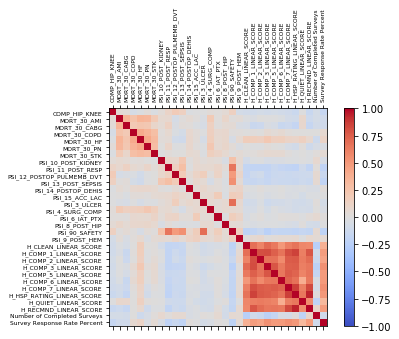

In [3]:
corr = allData.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(allData.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(allData.columns, fontsize=6)
ax.set_yticklabels(allData.columns, fontsize=6)
plt.show()

# Looks like the survey scores are generally highly correlated with each other.
# In addition, the mortality rate outcomes are moderately correlated with each other, and some 
# of the complications have a weak to moderate negative correlation with the survey scores

In [4]:
# standardize and fill NaNs with mean values

filledData = allData.fillna(allData.mean()).values
scaledData = StandardScaler().fit_transform(filledData)

print(filledData)

[[   3.           14.5           4.5        ...   84.
   506.           21.        ]
 [   3.           15.5           3.23017751 ...   88.
  1135.           34.        ]
 [   3.6          14.9           3.2        ...   84.
   579.           22.        ]
 ...
 [   2.59674112   13.17938615    3.23017751 ...   88.08642675
   685.48155156   26.37204352]
 [   2.59674112   13.17938615    3.23017751 ...   92.
  1027.           23.        ]
 [   2.59674112   13.17938615    3.23017751 ...   88.08642675
   685.48155156   26.37204352]]


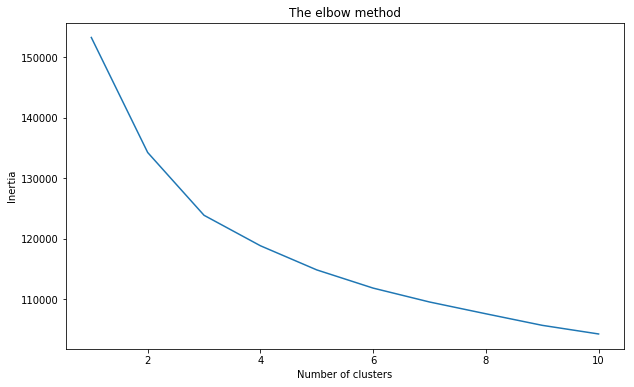

In [5]:
# determine optimal number of clusters

def plot_inertia(array, start=1, end=10):

    inertia = []

    for i in range(start, end + 1):
        kmeans = KMeans(n_clusters=i, random_state=0, init='k-means++')
        kmeans.fit(array)
        inertia.append(kmeans.inertia_)

    x_axis = range(start, end + 1)
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.set_title('The elbow method')
    ax.set_ylabel('Inertia')
    ax.set_xlabel('Number of clusters')
    plt.plot(x_axis, inertia)

    return ax

plot_inertia(scaledData, 1, 10)

# selecting 5 clusters based on plot

In [6]:
# fit and predict kmeans

def kmeans_cluster(array, random_state, n_clusters=5):

    model = KMeans(n_clusters=n_clusters, random_state=random_state)
    clusters = model.fit_predict(array)

    return model, clusters


model, clusters = kmeans_cluster(scaledData, 0, 5)

print(clusters)

[3 0 3 ... 0 0 0]


In [7]:
# rebuild dataframe with provider name and cluster labels

df = pd.read_csv('hospitalData.csv', index_col=0)
df['Clusters'] = clusters

df.groupby('Clusters').mean()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
Clusters,,,,,,,,,,,,,,,,,,,,,
0,2.630133,13.555302,3.537500,8.618548,12.341723,16.218843,14.571690,1.277415,7.744970,3.677757,...,86.066563,79.147833,87.331269,81.769350,88.202012,82.360681,87.674923,55743.819752,435.315869,26.423678
1,2.498611,13.152604,3.011364,8.399630,12.210152,15.633178,14.509408,1.270581,6.740585,3.577588,...,90.831004,84.209657,90.345616,85.039390,92.167726,87.448539,92.337992,54743.162643,382.452351,33.780178
2,2.729201,13.365873,3.431855,8.561979,11.688889,15.980412,14.523885,1.525469,11.304792,4.511026,...,83.613402,77.778351,86.548969,81.226804,87.752577,80.288660,87.765464,50386.629156,1392.611253,22.790281
3,2.652312,13.258022,3.287591,8.282591,11.125626,15.934528,14.264977,1.289286,8.444709,3.941293,...,80.076923,73.774859,82.545966,77.881801,83.362101,77.043152,81.594747,49864.921201,699.378987,19.469043
4,2.483047,12.333006,2.789836,7.668357,10.209178,14.130857,13.427926,1.248287,6.790760,3.647382,...,84.612476,78.391304,87.361059,82.170132,89.143667,80.860113,89.542533,49687.207477,1533.541353,24.768797


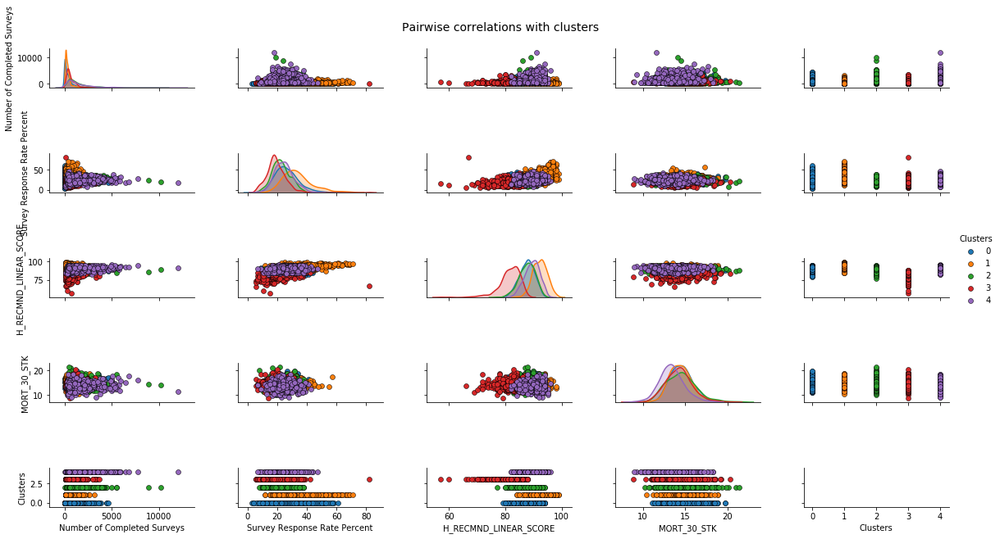

In [11]:
# show scatterplot color coded by cluster
cols = ['Number of Completed Surveys', 'Survey Response Rate Percent', 'H_RECMND_LINEAR_SCORE','MORT_30_STK', 'Clusters']
pp = sns.pairplot(df[cols], hue='Clusters', height=1.8, aspect=1.8, 
                  plot_kws=dict(edgecolor="black", linewidth=0.5))
fig = pp.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Pairwise correlations with clusters', fontsize=14)

# save df
#df.to_csv(path_or_buf='C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/KmeansResults.csv')

In [27]:
# Ignore Pandas warnings
import warnings
warnings.filterwarnings("ignore")

#import needed libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
from copy import deepcopy
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (15, 10)
plt.style.use('ggplot')
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import mglearn

In [26]:
#Import the dataset
df=pd.read_csv("/Users/michaeldiarra/Desktop/hospitalData.csv")
df.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,83.0,86.0,84.0,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,...,88.0,85.0,88.0,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135.0,34.0
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,84.0,82.0,84.0,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0
3,3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,...,85.0,86.0,85.0,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185.0,27.0
4,4,010008,NaN,NaN,NaN,8.0,12.9,15.7,NaN,NaN,...,NaN,NaN,NaN,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63.0,31.0


In [33]:
# fill NaNs with mean values

df = df.fillna(df.mean())

In [34]:
DPD = df.loc[:,'COMP_HIP_KNEE':'H_RECMND_LINEAR_SCORE']
DPD.head()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE
0,3.000000,14.500000,4.500000,8.9,12.5,16.2,13.700000,0.650000,6.020000,5.570000,...,83.000000,87.000000,90.000000,75.000000,70.00000,85.000000,79.000000,83.000000,86.000000,84.000000
1,3.000000,15.500000,3.230178,10.9,15.3,20.8,15.700000,1.100000,12.170000,3.170000,...,87.000000,91.000000,94.000000,85.000000,81.00000,88.000000,81.000000,88.000000,85.000000,88.000000
2,3.600000,14.900000,3.200000,8.8,13.2,17.2,17.200000,1.280000,7.190000,3.310000,...,79.000000,89.000000,91.000000,83.000000,76.00000,83.000000,80.000000,84.000000,82.000000,84.000000
3,2.800000,13.179386,3.230178,8.3,13.3,21.6,15.900000,1.300000,9.460000,4.760000,...,86.000000,89.000000,94.000000,84.000000,79.00000,85.000000,80.000000,85.000000,86.000000,85.000000
4,2.596741,13.179386,3.230178,8.0,12.9,15.7,14.289226,1.307723,8.037586,3.811502,...,87.965146,91.375177,91.430434,85.736753,79.20119,87.199207,81.911873,88.447152,82.239445,88.086427


In [35]:
#Standardize the dataset - This ensures that all features have similar ranges.
from sklearn.preprocessing import StandardScaler
import numpy as np
stscaler = StandardScaler().fit(DPD)
data = stscaler.transform(DPD)

In [59]:
#Create DBSCAN Model
dbsc = DBSCAN(eps = .1, min_samples = 10).fit(data)
labels = dbsc.labels_
core_samples = np.zeros_like(labels, dtype = bool)
core_samples[dbsc.core_sample_indices_] = True

Text(0,0.5,'Feature 1 (scaled)')

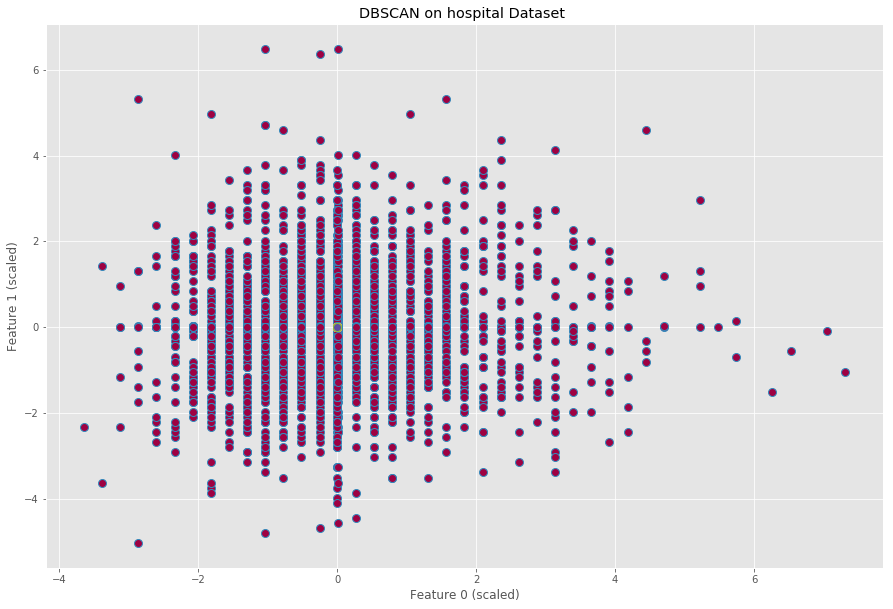

In [60]:
#Plot the DBSAN Cluster Map
unique_labels = np.unique(labels)
colors = plt.cm.Spectral(np.linspace(0,1, len(unique_labels)))
for (label, color) in zip(unique_labels, colors):
    class_member_mask = (labels == label)
    xy = data[class_member_mask & core_samples]
    plt.plot(xy[:,0],xy[:,1], 'o', markerfacecolor = color, markersize = 8)
    
    xy2 = data[class_member_mask & ~core_samples]
    plt.plot(xy2[:,0],xy2[:,1], 'o', markerfacecolor = color, markersize = 8)
plt.title("DBSCAN on hospital Dataset ")
plt.xlabel("Feature 0 (scaled)")
plt.ylabel("Feature 1 (scaled)")

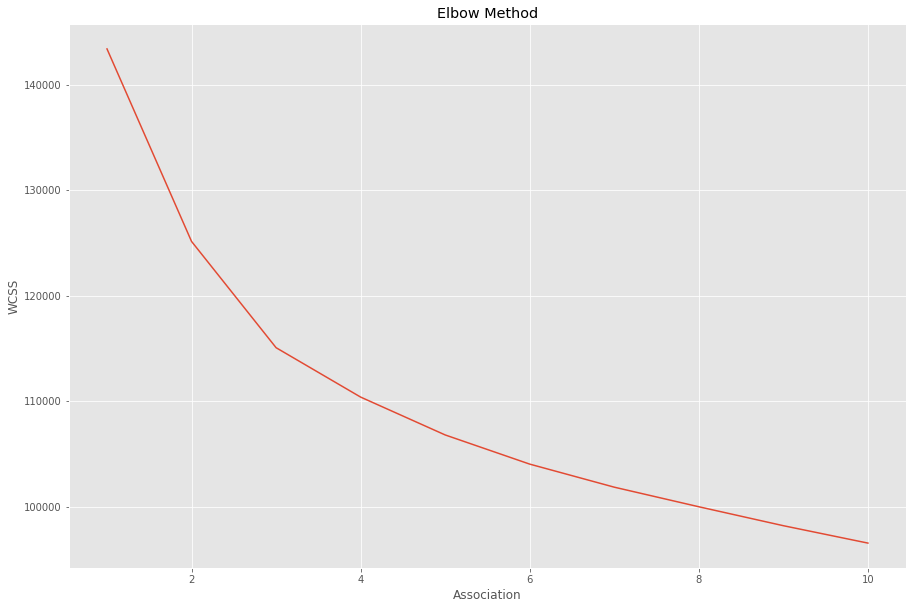

In [61]:
#Select the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = 0)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
    
#Plotting the results onto a line graph to observe 'The elbow'
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()

In [68]:
#Apply kmeans to the dataset / Creating the kmeans classifier
kmeans = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 500, 
                n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(data)

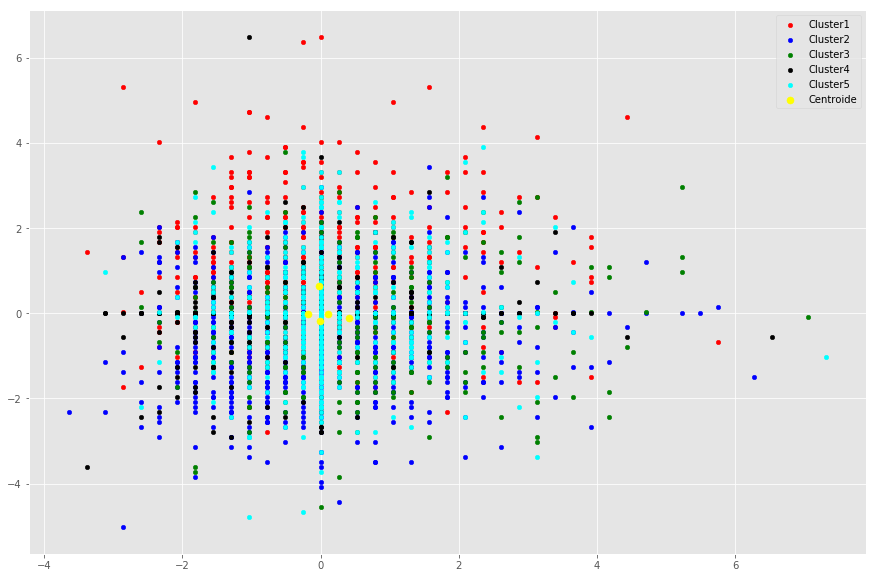

In [69]:
#Visualising the k-means clusters
plt.scatter(data[y_kmeans == 0, 0], data[y_kmeans == 0, 1], s = 20, 
            c = 'red', label = 'Cluster1')
plt.scatter(data[y_kmeans == 1, 0], data[y_kmeans == 1, 1], s = 20, 
            c = 'blue', label = 'Cluster2')
plt.scatter(data[y_kmeans == 2, 0], data[y_kmeans == 2, 1], s = 20, 
            c = 'green', label = 'Cluster3')
plt.scatter(data[y_kmeans == 3, 0], data[y_kmeans == 3, 1], s = 20, 
            c = 'black', label = 'Cluster4')
plt.scatter(data[y_kmeans == 4, 0], data[y_kmeans == 4, 1], s = 20, 
            c = 'cyan', label = 'Cluster5')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], 
            kmeans.cluster_centers_[:,1], s = 50, 
            c = 'yellow', label = 'Centroide')

plt.legend()

In [80]:
#import needed libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [81]:
## Create the categorical variable for Hospital Name
HospitalNames=df['Hospital Name'].astype('category').cat.codes

In [82]:
#Create t-SNE Model
model=TSNE(learning_rate=100)
Tsne_transformed=model.fit_transform(data)

In [85]:
## Create the categorical variable for Hospital Name
HospitalNames=df['Hospital Name']

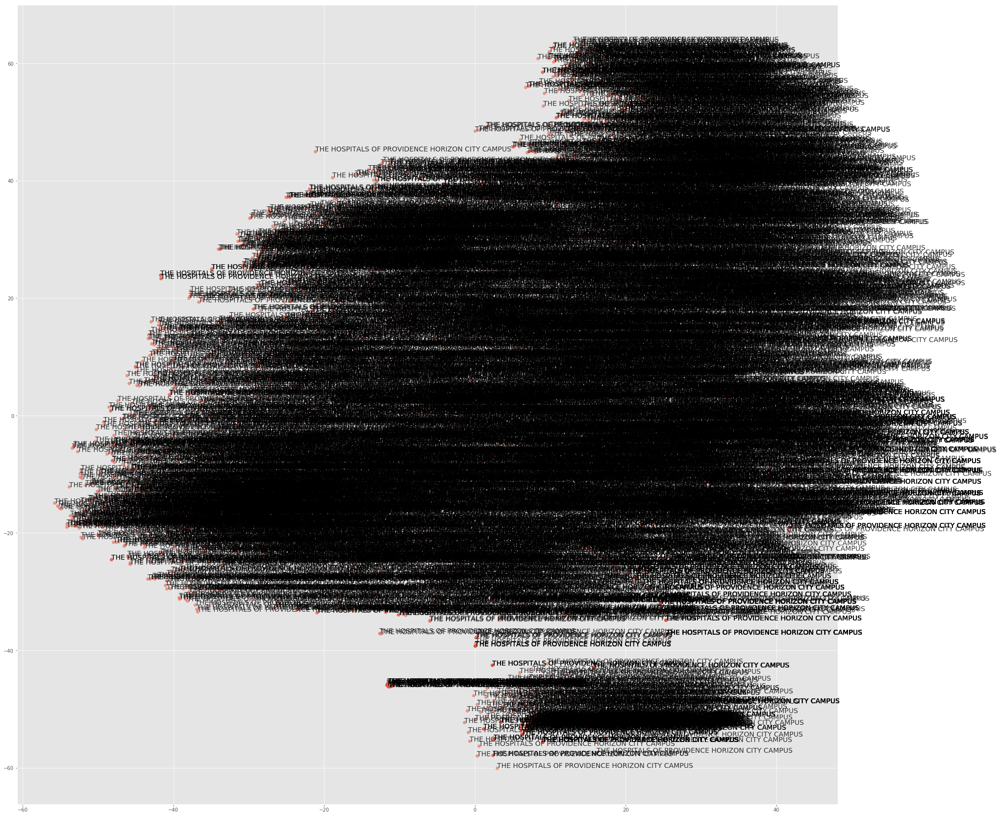

In [94]:
#Inspect the dataset via vizualization
plt.figure(figsize=(30,30))
# Select the 0th feature: xs
xs =Tsne_transformed[:,0]
# Select the 1th feature: ys
ys=Tsne_transformed[:,1]
# Scatter plot
plt.scatter(xs,ys, alpha=0.5)
for x, y in zip(xs, ys):
    plt.annotate(aircrafts, (x, y), fontsize=14, alpha=0.80)
plt.show()

[[ 1.05104864e+00  1.55111961e+00  2.94867432e+00 ... -1.94412204e+00
   8.65366224e-01 -1.11086510e+00]
 [ 1.05104864e+00  2.72566401e+00 -2.06245276e-15 ... -1.59591353e-01
   6.35249623e-01 -2.34944772e-02]
 [ 2.61488075e+00  2.02093737e+00 -7.00756711e-02 ... -1.58721590e+00
  -5.51001778e-02 -1.11086510e+00]
 ...
 [ 0.00000000e+00 -4.17281996e-15 -2.06245276e-15 ...  5.07194126e-15
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -4.17281996e-15 -2.06245276e-15 ...  9.11127059e-01
   8.65366224e-01  1.06387614e+00]
 [ 0.00000000e+00 -4.17281996e-15 -2.06245276e-15 ...  5.07194126e-15
   0.00000000e+00  0.00000000e+00]]


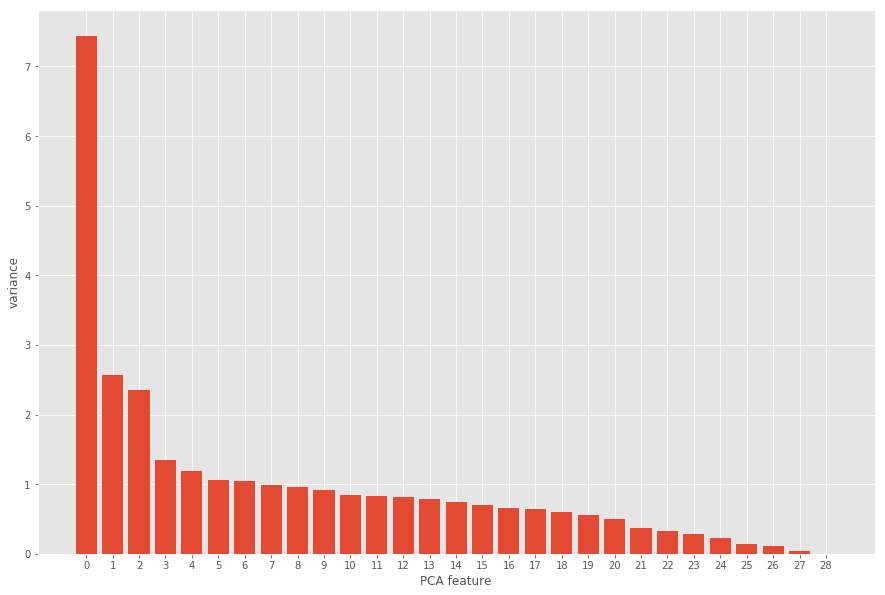

In [95]:
#PCA
#Import relevant libraries
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

# Create scaler: scaler
scaler = StandardScaler()

# Create a PCA instance: pca
pca = PCA()

# Create pipeline: pipeline
pipeline = make_pipeline(scaler, pca)

# Fit the pipeline to 'samples'
pipeline.fit(data) 
print(data) #shows percentage of each variance

# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(features)
plt.show()

In [96]:
# Create a PCA instance with 3 components: pca
pca = PCA(n_components=3)

# Fit the PCA instance to the scaled samples
pca.fit(data)

# Transform the scaled samples: pca_features
pca_features = pca.transform(data)

# Print the shape of pca_features
print(pca_features.shape)

(4944, 3)


Text(0.5,0,'PC3')

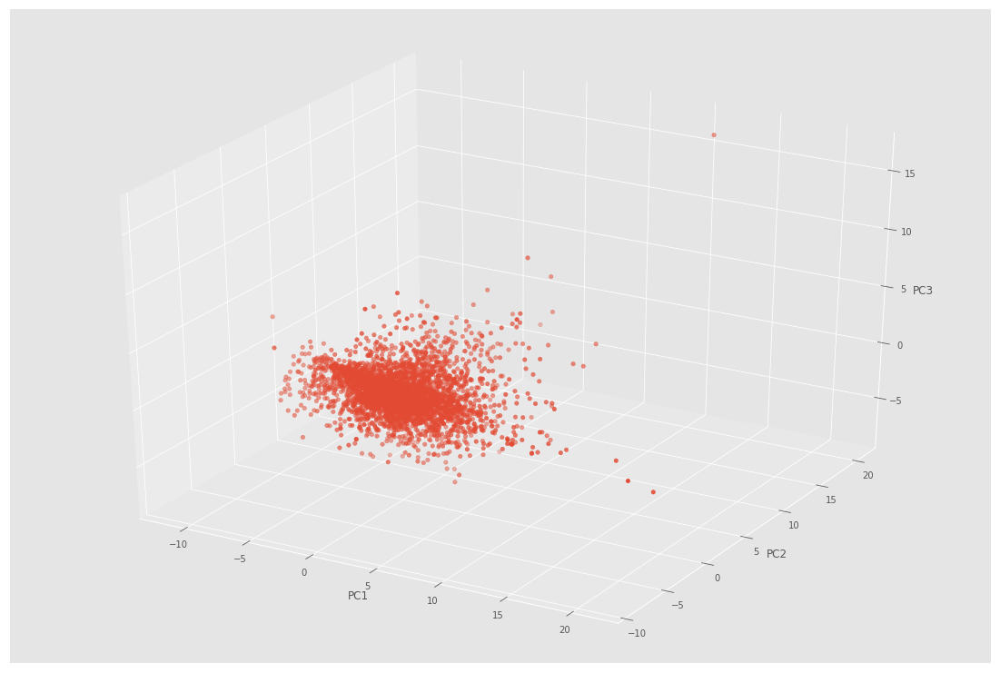

In [97]:
#Visualize the reduced dimensionality
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(pca_features[:, 0], pca_features[:, 1], pca_features[:, 2])

# label the axes
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

In [98]:
#Hierarchical Clustering
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')  
cluster.fit_predict(data)

array([1, 5, 1, ..., 4, 8, 4])

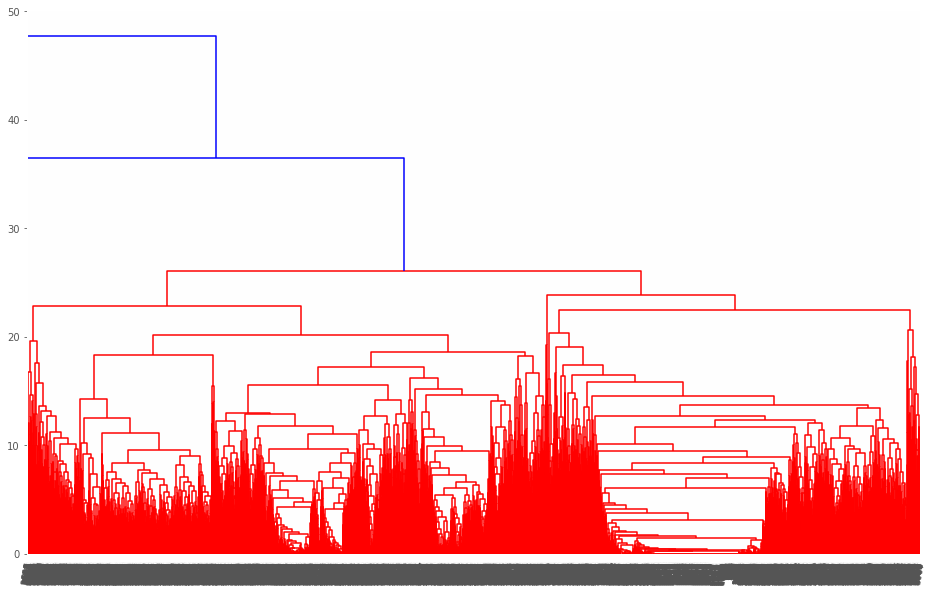

In [101]:
# Perform the necessary imports
from scipy.cluster.hierarchy import linkage, dendrogram

# Calculate the linkage: mergings
mergings = linkage(data, method='complete')
plt.figure(figsize=(16,10))
# Plot the dendrogram, using Hospital names as labels
dendrogram(mergings,
           leaf_rotation=80,
           leaf_font_size=9,
)

plt.show()

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
df=pd.read_csv('hospitalData.csv')

In [3]:
df.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,83.0,86.0,84.0,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,...,88.0,85.0,88.0,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135.0,34.0
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,84.0,82.0,84.0,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0
3,3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,...,85.0,86.0,85.0,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185.0,27.0
4,4,010008,NaN,NaN,NaN,8.0,12.9,15.7,NaN,NaN,...,NaN,NaN,NaN,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63.0,31.0


In [51]:
df.shape

(4944, 39)

In [4]:
df.loc[df['H_RECMND_LINEAR_SCORE'] < 81, 'STAR_RATING'] = 1
df.loc[(df['H_RECMND_LINEAR_SCORE'] >= 81) & (df['H_RECMND_LINEAR_SCORE'] < 86), 'STAR_RATING'] = 2
df.loc[(df['H_RECMND_LINEAR_SCORE'] >= 86) & (df['H_RECMND_LINEAR_SCORE'] < 91), 'STAR_RATING'] = 3
df.loc[(df['H_RECMND_LINEAR_SCORE'] >= 91) & (df['H_RECMND_LINEAR_SCORE'] < 95), 'STAR_RATING'] = 4
df.loc[df['H_RECMND_LINEAR_SCORE'] >= 95, 'STAR_RATING'] = 5

In [5]:
df.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,86.0,84.0,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0,2.0
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,...,85.0,88.0,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135.0,34.0,3.0
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,82.0,84.0,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0,2.0
3,3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,...,86.0,85.0,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185.0,27.0,2.0
4,4,010008,NaN,NaN,NaN,8.0,12.9,15.7,NaN,NaN,...,NaN,NaN,CRENSHAW COMMUNITY HOSPITAL,101 HOSPITAL CIRCLE,LUVERNE,AL,36049.0,63.0,31.0,NaN


In [6]:
c = df['STAR_RATING'].value_counts(dropna=True)
p = df['STAR_RATING'].value_counts(dropna=True, normalize=True)
pd.concat([c,p], axis=1, keys=['counts', '%'])

,counts,%
3.0,1612,0.456787
4.0,890,0.252196
2.0,683,0.193539
1.0,180,0.051006
5.0,164,0.046472


In [7]:
df_clean = df.dropna()

In [8]:
df_clean.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,86.0,84.0,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0,2.0
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,82.0,84.0,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0,2.0
5,5,010011,2.6,14.1,3.7,8.9,13.1,16.1,12.4,1.74,...,81.0,86.0,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235.0,2193.0,33.0,3.0
7,7,010016,2.2,16.0,3.3,7.1,13.2,16.4,13.9,2.11,...,84.0,88.0,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007.0,1103.0,21.0,3.0
12,12,010023,2.5,13.1,5.9,10.8,12.7,18.5,14.7,0.89,...,84.0,86.0,BAPTIST MEDICAL CENTER SOUTH,2105 EAST SOUTH BOULEVARD,MONTGOMERY,AL,36116.0,702.0,24.0,3.0


In [9]:
c = df_clean['STAR_RATING'].value_counts(dropna=False)
p = df_clean['STAR_RATING'].value_counts(dropna=False, normalize=True)
pd.concat([c,p], axis=1, keys=['counts', '%'])

,counts,%
3.0,489,0.519108
4.0,277,0.294055
2.0,145,0.153928
1.0,22,0.023355
5.0,9,0.009554


In [50]:
df_clean.shape

(942, 41)

In [10]:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
df_clean['STATE_CODE'] = lb_make.fit_transform(df_clean['State'])
df_clean['CITY_CODE'] = lb_make.fit_transform(df_clean['City'])

df_clean.head() #Results in appending a new column to df

/Users/zainiqbal/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/zainiqbal/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING,STATE_CODE,CITY_CODE
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506.0,21.0,2.0,1,141
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579.0,22.0,2.0,1,184
5,5,010011,2.6,14.1,3.7,8.9,13.1,16.1,12.4,1.74,...,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235.0,2193.0,33.0,3.0,1,52
7,7,010016,2.2,16.0,3.3,7.1,13.2,16.4,13.9,2.11,...,SHELBY BAPTIST MEDICAL CENTER,1000 FIRST STREET NORTH,ALABASTER,AL,35007.0,1103.0,21.0,3.0,1,4
12,12,010023,2.5,13.1,5.9,10.8,12.7,18.5,14.7,0.89,...,BAPTIST MEDICAL CENTER SOUTH,2105 EAST SOUTH BOULEVARD,MONTGOMERY,AL,36116.0,702.0,24.0,3.0,1,358


# Model Selection

In [43]:
y=df_clean['STAR_RATING']
cols=["COMP_HIP_KNEE","MORT_30_AMI","MORT_30_CABG","MORT_30_COPD","MORT_30_HF","MORT_30_PN","MORT_30_STK",
      "PSI_10_POST_KIDNEY","PSI_11_POST_RESP","PSI_12_POSTOP_PULMEMB_DVT","PSI_13_POST_SEPSIS","PSI_14_POSTOP_DEHIS",
      "PSI_15_ACC_LAC","PSI_3_ULCER","PSI_4_SURG_COMP","PSI_6_IAT_PTX","PSI_8_POST_HIP","PSI_90_SAFETY",
      "PSI_9_POST_HEM","H_CLEAN_LINEAR_SCORE","H_COMP_1_LINEAR_SCORE","H_COMP_2_LINEAR_SCORE",
      "H_COMP_3_LINEAR_SCORE","H_COMP_5_LINEAR_SCORE","H_COMP_6_LINEAR_SCORE","H_COMP_7_LINEAR_SCORE"
      ,"H_HSP_RATING_LINEAR_SCORE","H_QUIET_LINEAR_SCORE"
      #,"ZIP Code"
      ,"STATE_CODE"
      #,"CITY_CODE"
     ]
x=df_clean[cols]

In [44]:
import sklearn.model_selection as cv

SEED = 1

(x_train, x_test, y_train, y_test) = cv.train_test_split(x, y, test_size=.20, random_state = SEED)

In [45]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn import svm
#from sklearn import xgb

# Instantiate individual classifiers
dt = DecisionTreeClassifier(max_depth=6, random_state=SEED)
rf = RandomForestClassifier(n_estimators=60, random_state=SEED)
lr = LogisticRegression(random_state=SEED)
knn = KNN()
svc = svm.SVC(kernel='linear', C=1,random_state=SEED)
rbf_svc = svm.SVC(kernel='rbf', gamma=0.7, C=1,random_state=SEED)
poly_svc = svm.SVC(kernel='poly', degree=3, C=1,random_state=SEED)
#xgb = xgb.XGBClassifier(objective="binary:logistic",learning_rate=0.03,n_estimators=500, max_depth=1, subsample=0.4, random_state=SEED)

# Define a list called classifier that contains
# the tuples (classifier_name, classifier)
classifiers = [('Classification Tree', dt),
               ('Random Forest', rf),
               ('Logistic Regression', lr), 
               ('K Nearest Neighbours', knn),
               ('SVM Linear', svc),
               ('SVM RBF', rbf_svc)#,
               #('SVM Poly', poly_svc)#,
               #('XGBoost',xgb)
              ]

In [46]:
for clf_name, clf in classifiers:
#fit clf to the training set
    clf.fit(x_train, y_train)
# Predict the labels of the test set
    y_pred = clf.predict(x_test)

# Evaluate the accuracy of clf on the test set
    print('{:s} : {:.3f}'.format(clf_name, accuracy_score(y_test, y_pred)))

Classification Tree : 0.762
Random Forest : 0.836
Logistic Regression : 0.661
K Nearest Neighbours : 0.667
SVM Linear : 0.783
SVM RBF : 0.513


# Cross Validation

In [47]:
# Import train_test_split from sklearn.model_selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

# Instantiate a RandomForest
rf = RandomForestClassifier(n_estimators=60, random_state=SEED)

# Compute the array containing the 10-folds
scores = cross_val_score(rf, x_train, y_train, cv=10) 

scores

/Users/zainiqbal/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 7 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


array([0.75641026, 0.76923077, 0.68831169, 0.88      , 0.81333333,
       0.85333333, 0.76      , 0.78378378, 0.83561644, 0.78082192])

# Feature Importance

In [48]:
model = rf.fit(x_train, y_train)

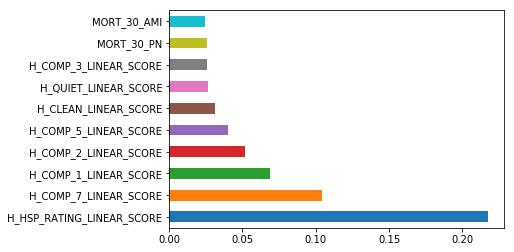

In [49]:
feat_importances = pd.Series(model.feature_importances_, index=cols)
feat_importances.nlargest(10).plot(kind='barh')

# Data Exploration with tSNE

<b>Overview:</b> t-SNE reduction analysis was performed on our data set to identify potential opportunities for clustering. This analysis was performed on the raw x features and standardized x features. The following code shows the analysis on our iteratively imputed data set (to fill missign values) given this was the ultimate approach our group decided to pursue. 

## Import and Prepare Data (Beyond Initial Data Clean Up)

In [1]:
#Import packages
import os
import pandas as pd
import numpy as np
import seaborn as sns

In [32]:
dataset = pd.read_csv("hospitaldata_iterative.csv.txt")

In [39]:
dataset.head()

,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,...,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.500000,4.500000,8.9,...,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0
1,010005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,3.0,15.500000,3.996645,10.9,...,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0,3.0
2,010006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,3.6,14.900000,3.200000,8.8,...,83.0,76.0,83.0,80.0,84.0,82.0,84.0,579.0,22.0,2.0
3,010007,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,2.8,14.439599,3.997644,8.3,...,84.0,79.0,85.0,80.0,85.0,86.0,85.0,185.0,27.0,2.0
4,010011,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235.0,2.6,14.100000,3.700000,8.9,...,83.0,77.0,86.0,82.0,87.0,81.0,86.0,2193.0,33.0,3.0


In [34]:
#Drop blank columns
dataset.drop(["Unnamed: 0", "Unnamed: 0.1"], axis = 1, inplace = True)

### Create X and Y data sets

In [130]:
#Create X and Y forboth  regression model and classification models (with Hospital Recommend and Star Scores, respectively)
x = dataset.copy()
x.drop(["Provider ID", "Hospital Name", "Address", "City", "ZIP Code", "State", "STAR_RATING", "H_RECMND_LINEAR_SCORE"], \
           axis = 1, inplace = True)
y_reg = dataset["H_RECMND_LINEAR_SCORE"]
y_class = dataset["STAR_RATING"]

### Create a Standardized Version of X variables to standardize features

<b>Note: </b>This step was taken given the varying scales of our X variables.

In [131]:
#create a copy
x_s = x.copy()

#standardize features to weight them equally
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler(copy=True, with_mean=True, with_std=True)
x_s = scaler.fit_transform(x)

## Initial t-SNE Analysis to Determine Optimal Learning Rate

<b>Purpose:</b> The purpose of this step is to determine the optimal learning rate. Ideally we are looking for potential clusters to emerge from the data set.

### Step 1: Iterate On Different Learning Rates to Identify Optimal Parameters for Raw X Variables

#### t-SNE with Learning Rate of 50

In [105]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=50)

#Apply fit transform to x 
tsne_features = model.fit_transform(x)

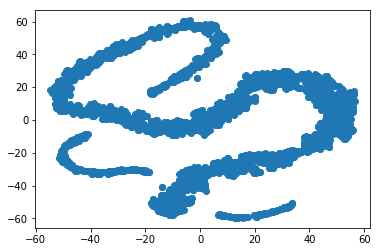

In [51]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 100

In [54]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=100)

#Apply fit transform to x 
tsne_features = model.fit_transform(x)

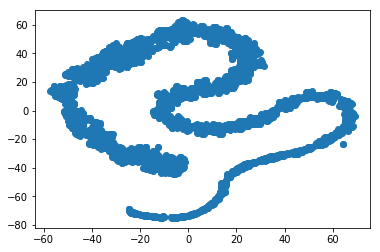

In [55]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 150

In [56]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=150)

#Apply fit transform to x 
tsne_features = model.fit_transform(x)

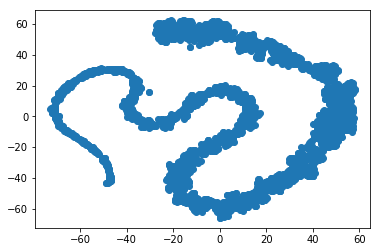

In [57]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 200

In [58]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=200)

#Apply fit transform to x 
tsne_features = model.fit_transform(x)

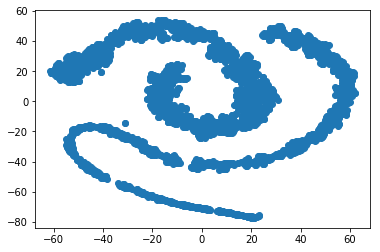

In [59]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

### Step 2: Iterate On Different Learning Rates to Identify Optimal Parameters for Standardized X Variables

#### t-SNE with Learning Rate of 50

In [132]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=50)

#Apply fit transform to x 
tsne_features = model.fit_transform(x_s)

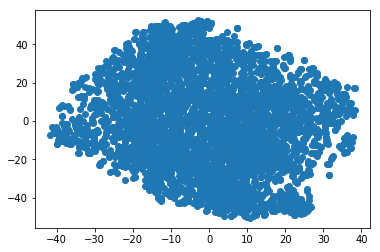

In [133]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 100

In [134]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=100)

#Apply fit transform to x 
tsne_features = model.fit_transform(x_s)

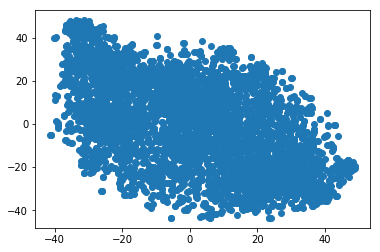

In [136]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 150

In [137]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=150)

#Apply fit transform to x 
tsne_features = model.fit_transform(x_s)

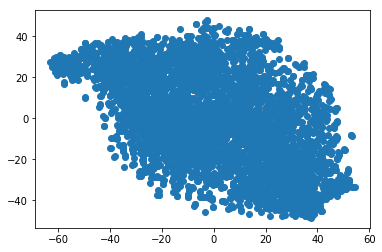

In [138]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### t-SNE with Learning Rate of 200

In [139]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=200)

#Apply fit transform to x 
tsne_features = model.fit_transform(x_s)

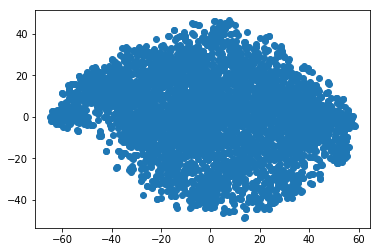

In [140]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

### Analysis

Based on upon the various iterations of t-SNE, some interesting shapes arising suggesting further analysis may be warranted. While we do not see clear clusters (i.e., separation), the "tail" shape based on the raw features may suggest potential clustering opportunities. Based upon our initial analysis, there does not seem to be significant differences in the outputs based on upon the various learning rates, so for the purposes of further analysis we chose a learning rate of 200.

## Final t-SNE Analysis & Conclusions

<b>Purpose:</b> The purpose of this step is to further analyse our t-SNE outputs by layering on our Y variables (regression: Hospital Recommend Score; classification: Star Rating).

### t-SNE with Raw Variables

In [141]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=200)

#Apply fit transform to x 
tsne_features = model.fit_transform(x)

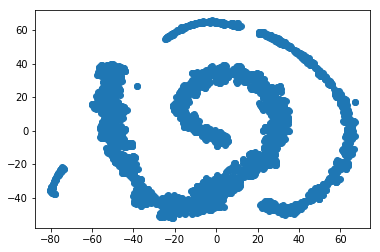

In [142]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### Output with Hospital Recommend Score Layered On (Regression Target Variable)

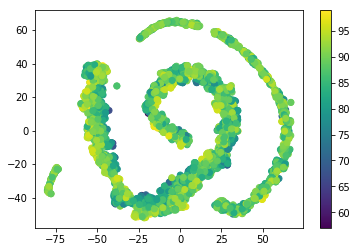

In [143]:
#Color plot based on our target 'Y'
fig, ax = plt.subplots()
im = ax.scatter(xs, ys, c=y_reg)
fig.colorbar(im, ax=ax)

#### Output with Star Rating Layered On (Classification Target Variable)

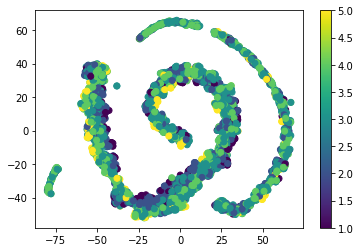

In [144]:
#Color plot based on our target 'Y'
fig, ax = plt.subplots()
im = ax.scatter(xs, ys, c=y_class)
fig.colorbar(im, ax=ax)

### t-SNE with Standardized Variables

In [157]:
#Perform t-SNE reduction

#Import t-SNE
from sklearn.manifold import TSNE

#Create a t-SNE instance
model = TSNE(learning_rate=200)

#Apply fit transform to x 
tsne_features = model.fit_transform(x_s)

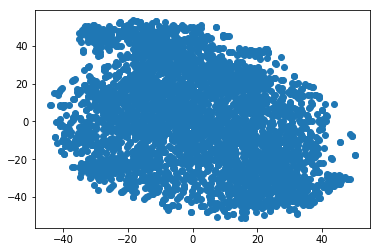

In [158]:
import matplotlib.pyplot as plt

# Select the 0th feature: xs
xs = tsne_features[:,0]

# Select the 1th feature: ys
ys = tsne_features[:,1]

# Scatter plot
plt.scatter(xs, ys)
plt.show()

#### Output with Hospital Recommend Score Layered On (Regression Target Variable)

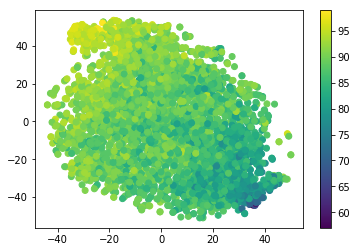

In [159]:
#Color plot based on our target 'Y'
fig, ax = plt.subplots()
im = ax.scatter(xs, ys, c=y_reg)
fig.colorbar(im, ax=ax)

#### Output with Star Rating Layered On (Classification Target Variable)

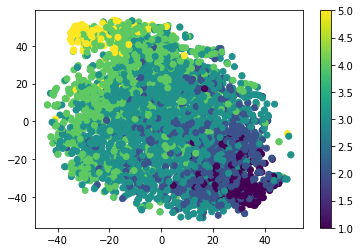

In [160]:
#Color plot based on our target 'Y'
fig, ax = plt.subplots()
im = ax.scatter(xs, ys, c=y_class)
fig.colorbar(im, ax=ax)

### Conclusions

Based upon the t-SNE reduction analysis, we see interesting outputs, which indicate further clustering analysis is likely warranted. The t-SNE on our raw X variables shows interesting shapes with some separation in the form of a "tail" shape (even though they are not fully separated clusters). When we layer on our Y variables, it is difficult to see any clear patterns. However, when t-SNE is performed on our standardized X variablese and the Y variables are layered on, it is worth noting the separation between our high and low value Y variables (for both Hospital Recommend Score and Star Rating). Therefore, even though we don't see clear clusters in our ouput, we recommend performing further clustering analysis given the nature of our results.

# **Data Imputation <<< Starts from here >>>**

In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
# import fancyimpute

# os.chdir('C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project')
df = pd.read_csv('hospitalDataTarget.csv')

In [3]:
df.head()

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506,21
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,...,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135,34
2,2,010006,3.6,14.9,3.2,8.8,13.2,17.2,17.2,1.28,...,84,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,579,22
3,3,010007,2.8,NaN,NaN,8.3,13.3,21.6,15.9,1.30,...,85,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467.0,185,27
4,5,010011,2.6,14.1,3.7,8.9,13.1,16.1,12.4,1.74,...,87,81,86,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235.0,2193,33


In [4]:
# what is the pattern of the blank scores needing to be filled?

df.isnull().sum(axis=0)

Unnamed: 0                         0
Provider ID                        0
COMP_HIP_KNEE                    870
MORT_30_AMI                     1149
MORT_30_CABG                    2516
MORT_30_COPD                     438
MORT_30_HF                       291
MORT_30_PN                       196
MORT_30_STK                      991
PSI_10_POST_KIDNEY               828
PSI_11_POST_RESP                 848
PSI_12_POSTOP_PULMEMB_DVT        625
PSI_13_POST_SEPSIS               841
PSI_14_POSTOP_DEHIS              805
PSI_15_ACC_LAC                   655
PSI_3_ULCER                      573
PSI_4_SURG_COMP                 1823
PSI_6_IAT_PTX                    564
PSI_8_POST_HIP                   564
PSI_90_SAFETY                    562
PSI_9_POST_HEM                   628
H_CLEAN_LINEAR_SCORE               0
H_COMP_1_LINEAR_SCORE              0
H_COMP_2_LINEAR_SCORE              0
H_COMP_3_LINEAR_SCORE              0
H_COMP_5_LINEAR_SCORE              0
H_COMP_6_LINEAR_SCORE              0
H

Since they have less than half of the records populated, we will consider removing MORT_30_CABG and PSI_4_SURG_COMP when we run our models.

In [5]:
# set metadata - we will not impute values for these, but will add back later

df_metadata = df[['Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code']]

In [6]:
df_survey_predictors = df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']]

df_survey_predictors.head()
df_survey_predictors.isnull().sum(axis=0)

COMP_HIP_KNEE                    870
MORT_30_AMI                     1149
MORT_30_CABG                    2516
MORT_30_COPD                     438
MORT_30_HF                       291
MORT_30_PN                       196
MORT_30_STK                      991
PSI_10_POST_KIDNEY               828
PSI_11_POST_RESP                 848
PSI_12_POSTOP_PULMEMB_DVT        625
PSI_13_POST_SEPSIS               841
PSI_14_POSTOP_DEHIS              805
PSI_15_ACC_LAC                   655
PSI_3_ULCER                      573
PSI_4_SURG_COMP                 1823
PSI_6_IAT_PTX                    564
PSI_8_POST_HIP                   564
PSI_90_SAFETY                    562
PSI_9_POST_HEM                   628
H_CLEAN_LINEAR_SCORE               0
H_COMP_1_LINEAR_SCORE              0
H_COMP_2_LINEAR_SCORE              0
H_COMP_3_LINEAR_SCORE              0
H_COMP_5_LINEAR_SCORE              0
H_COMP_6_LINEAR_SCORE              0
H_COMP_7_LINEAR_SCORE              0
H_HSP_RATING_LINEAR_SCORE          0
H

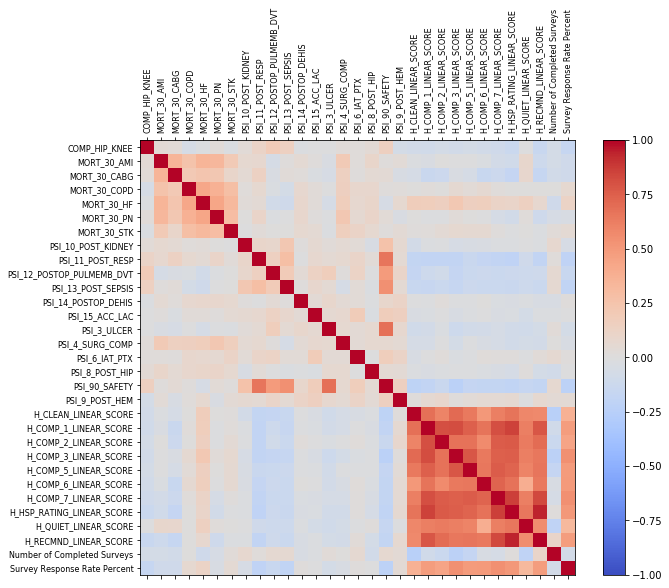

In [14]:

corr = df_survey_predictors.corr()
# fig = plt.figure()
fig = plt.figure(figsize=[10,8])
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_survey_predictors.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_survey_predictors.columns, fontsize=8)
ax.set_yticklabels(df_survey_predictors.columns, fontsize=8)
plt.show()

Survey response rate % seems to be the most correlated with survey scores. However, there are 716 rows that don't have response rate provided, so we will have to work around that. Since the survey responses seem to be all or nothing (they are either all populated or all null), we can't use one survey response to predict another, despite the high correlation between them. In addition, all of the complication rates have missing values that will need to be examined separately and filled.

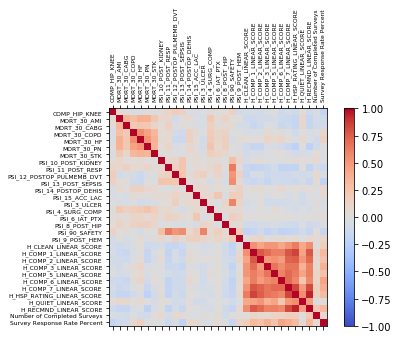

In [74]:
# out of curiosity - let's see how the correlation matrix is affected when you keep only 
# filled rows

df_predictors = df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']]
df_drop_na = df_predictors.dropna(how='any')
df_drop_na.count()

corr = df_drop_na.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_drop_na.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_drop_na.columns, fontsize=6)
ax.set_yticklabels(df_drop_na.columns, fontsize=6)
plt.show()

# doesn't particularly highlight other correlations, and actually removes the useful negative
# correlation between number of completed surveys and survey scores

We'll try two methods using fancyimpute. The first is IterativeImputer, which models each feature as a function of other features (mulitple regression). The second is KNN, which chooses the 3 nearest neighbors that have the feature filled and takes the average of those.

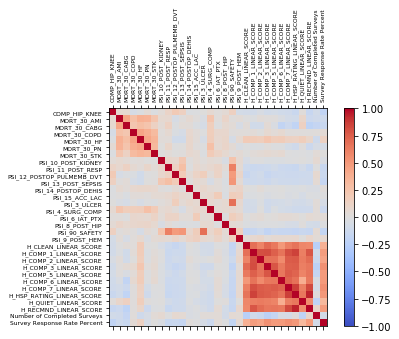

In [75]:
# Model each feature with missing values as a function of other features, and
# use that estimate for imputation.
#filled_iterative_np = fancyimpute.IterativeImputer().fit_transform(df_predictors)

df_filled_iterative = pd.DataFrame(filled_iterative_np)
df_filled_iterative.columns = ['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']
df_filled_iterative.head()

corr = df_filled_iterative.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(df_filled_iterative.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(df_filled_iterative.columns, fontsize=6)
ax.set_yticklabels(df_filled_iterative.columns, fontsize=6)
plt.show()

# looks like the correlations we saw before are generally retained

In [76]:
# look at means of each measure

df_filled_iterative.mean()

COMP_HIP_KNEE                     2.605102
MORT_30_AMI                      13.210216
MORT_30_CABG                      3.340519
MORT_30_COPD                      8.387088
MORT_30_HF                       11.750039
MORT_30_PN                       15.749078
MORT_30_STK                      14.243472
PSI_10_POST_KIDNEY                1.310920
PSI_11_POST_RESP                  8.110251
PSI_12_POSTOP_PULMEMB_DVT         3.802057
PSI_13_POST_SEPSIS                5.222166
PSI_14_POSTOP_DEHIS               0.857925
PSI_15_ACC_LAC                    1.290815
PSI_3_ULCER                       0.382598
PSI_4_SURG_COMP                 161.284288
PSI_6_IAT_PTX                     0.289004
PSI_8_POST_HIP                    0.110929
PSI_90_SAFETY                     0.996808
PSI_9_POST_HEM                    2.594627
H_CLEAN_LINEAR_SCORE             87.965146
H_COMP_1_LINEAR_SCORE            91.375177
H_COMP_2_LINEAR_SCORE            91.430434
H_COMP_3_LINEAR_SCORE            85.736753
H_COMP_5_LI

In [77]:
# Use 10 nearest rows which have a feature to fill in each row's missing features

filled_knn_np = fancyimpute.KNN(k=10).fit_transform(df_predictors)

Imputing row 1/3529 with 0 missing, elapsed time: 2.729
Imputing row 101/3529 with 1 missing, elapsed time: 2.739
Imputing row 201/3529 with 3 missing, elapsed time: 2.751
Imputing row 301/3529 with 0 missing, elapsed time: 2.756
Imputing row 401/3529 with 0 missing, elapsed time: 2.764
Imputing row 501/3529 with 2 missing, elapsed time: 2.779
Imputing row 601/3529 with 0 missing, elapsed time: 2.787
Imputing row 701/3529 with 0 missing, elapsed time: 2.791
Imputing row 801/3529 with 2 missing, elapsed time: 2.799
Imputing row 901/3529 with 2 missing, elapsed time: 2.813
Imputing row 1001/3529 with 1 missing, elapsed time: 2.819
Imputing row 1101/3529 with 2 missing, elapsed time: 2.830
Imputing row 1201/3529 with 13 missing, elapsed time: 2.846
Imputing row 1301/3529 with 8 missing, elapsed time: 2.860
Imputing row 1401/3529 with 10 missing, elapsed time: 2.874
Imputing row 1501/3529 with 2 missing, elapsed time: 2.885
Imputing row 1601/3529 with 16 missing, elapsed time: 2.890
Imputi

In [78]:
# convert knn np array back to dataframe and rename columns

df_filled_knn = pd.DataFrame(filled_knn_np)
df_filled_knn.columns = ['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'H_RECMND_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']
df_filled_knn.head()
df_filled_knn.isnull().sum(axis=0)

COMP_HIP_KNEE                   0
MORT_30_AMI                     0
MORT_30_CABG                    0
MORT_30_COPD                    0
MORT_30_HF                      0
MORT_30_PN                      0
MORT_30_STK                     0
PSI_10_POST_KIDNEY              0
PSI_11_POST_RESP                0
PSI_12_POSTOP_PULMEMB_DVT       0
PSI_13_POST_SEPSIS              0
PSI_14_POSTOP_DEHIS             0
PSI_15_ACC_LAC                  0
PSI_3_ULCER                     0
PSI_4_SURG_COMP                 0
PSI_6_IAT_PTX                   0
PSI_8_POST_HIP                  0
PSI_90_SAFETY                   0
PSI_9_POST_HEM                  0
H_CLEAN_LINEAR_SCORE            0
H_COMP_1_LINEAR_SCORE           0
H_COMP_2_LINEAR_SCORE           0
H_COMP_3_LINEAR_SCORE           0
H_COMP_5_LINEAR_SCORE           0
H_COMP_6_LINEAR_SCORE           0
H_COMP_7_LINEAR_SCORE           0
H_HSP_RATING_LINEAR_SCORE       0
H_QUIET_LINEAR_SCORE            0
H_RECMND_LINEAR_SCORE           0
Number of Comp

In [79]:
# reattach provider IDs and location columns to datasets

final_filled_iterative = pd.concat([df_metadata, df_filled_iterative], axis=1)
final_filled_knn = pd.concat([df_metadata, df_filled_knn], axis=1)

In [80]:
# print iterativeImpute and knn filled datasets to csv

final_filled_iterative.to_csv('C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/filled_iterative.csv')
final_filled_knn.to_csv('C:/Users/mgow/Documents/UChicago/Courses/Data Mining/Group Project/filled_knn.csv')

In [145]:
#import the required packages
%matplotlib inline
import numpy as np
import pandas as pd
from scipy import stats

In [146]:
## Upload CSV File
Hospital_data = pd.read_csv('/Users/michaeldiarra/OneDrive/Samsung Ultra/U Chicago Ms Analytics/Program/Spring 2019/MSCA 31008 01 - Data Mining Principles/Graded Assignments/Group Project/hospitalDataTarget.csv')
Hospital_data.head(2)

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,0.65,...,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506,21
1,1,010005,3.0,15.5,NaN,10.9,15.3,20.8,15.7,1.10,...,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135,34


In [148]:
# Explore dataset
Hospital_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 38 columns):
Unnamed: 0                      3529 non-null int64
Provider ID                     3529 non-null object
COMP_HIP_KNEE                   2659 non-null float64
MORT_30_AMI                     2380 non-null float64
MORT_30_CABG                    1013 non-null float64
MORT_30_COPD                    3091 non-null float64
MORT_30_HF                      3238 non-null float64
MORT_30_PN                      3333 non-null float64
MORT_30_STK                     2538 non-null float64
PSI_10_POST_KIDNEY              2701 non-null float64
PSI_11_POST_RESP                2681 non-null float64
PSI_12_POSTOP_PULMEMB_DVT       2904 non-null float64
PSI_13_POST_SEPSIS              2688 non-null float64
PSI_14_POSTOP_DEHIS             2724 non-null float64
PSI_15_ACC_LAC                  2874 non-null float64
PSI_3_ULCER                     2956 non-null float64
PSI_4_SURG_COMP                 

In [149]:
# Explore missing values
import warnings
warnings.filterwarnings('ignore')
total = Hospital_data.isnull().sum().sort_values(ascending=False)
percent = Hospital_data.isnull().sum()/Hospital_data.isnull().count()*100
percent_2H = (round(percent, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Number of missing Values','Percentage of missing values'])
missing_data

,Number of missing Values,Percentage of missing values
Address,0,0.000000
COMP_HIP_KNEE,870,24.652876
City,0,0.000000
H_CLEAN_LINEAR_SCORE,0,0.000000
H_COMP_1_LINEAR_SCORE,0,0.000000
H_COMP_2_LINEAR_SCORE,0,0.000000
H_COMP_3_LINEAR_SCORE,0,0.000000
H_COMP_5_LINEAR_SCORE,0,0.000000
H_COMP_6_LINEAR_SCORE,0,0.000000
H_COMP_7_LINEAR_SCORE,0,0.000000


In [150]:
# Compute Column non-missing values mean
Hospital_data['COMP_HIP_KNEE'].describe()

count    2659.000000
mean        2.598270
std         0.520227
min         1.200000
25%         2.200000
50%         2.500000
75%         2.900000
max         5.400000
Name: COMP_HIP_KNEE, dtype: float64

In [151]:
# Use the computed mean to impute missing values
mean_value = 2.598270
data = [Hospital_data]

for dataset in data:
    dataset['COMP_HIP_KNEE'] = dataset['COMP_HIP_KNEE'].fillna(mean_value)

In [152]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_AMI'].describe()

count    2380.000000
mean       13.172227
std         1.220191
min         8.900000
25%        12.400000
50%        13.100000
75%        13.900000
max        18.700000
Name: MORT_30_AMI, dtype: float64

In [153]:
# Use the computed mean to impute missing values
mean_value = 13.172227
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_AMI'] = dataset['MORT_30_AMI'].fillna(mean_value)

In [154]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_CABG'].describe()

count    1013.000000
mean        3.230405
std         0.951815
min         1.300000
25%         2.600000
50%         3.000000
75%         3.700000
max         8.500000
Name: MORT_30_CABG, dtype: float64

In [155]:
# Use the computed mean to impute missing values
mean_value = 3.230405
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_CABG'] = dataset['MORT_30_CABG'].fillna(mean_value)

In [156]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_COPD'].describe()

count    3091.000000
mean        8.409609
std         1.153897
min         4.900000
25%         7.600000
50%         8.300000
75%         9.100000
max        14.400000
Name: MORT_30_COPD, dtype: float64

In [157]:
# Use the computed mean to impute missing values
mean_value = 8.409609
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_COPD'] = dataset['MORT_30_COPD'].fillna(mean_value)

In [158]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_HF'].describe()

count    3238.000000
mean       11.720568
std         1.757129
min         5.000000
25%        10.500000
50%        11.600000
75%        12.900000
max        18.500000
Name: MORT_30_HF, dtype: float64

In [159]:
# Use the computed mean to impute missing values
mean_value = 11.720568
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_HF'] = dataset['MORT_30_HF'].fillna(mean_value)

In [160]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_PN'].describe()

count    3333.000000
mean       15.772187
std         2.051998
min         9.000000
25%        14.400000
50%        15.700000
75%        17.000000
max        24.800000
Name: MORT_30_PN, dtype: float64

In [161]:
# Use the computed mean to impute missing values
mean_value = 15.772187
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_PN'] = dataset['MORT_30_PN'].fillna(mean_value)

In [162]:
# Compute Column non-missing values mean
Hospital_data['MORT_30_STK'].describe()

count    2538.000000
mean       14.284555
std         1.526956
min         8.900000
25%        13.300000
50%        14.200000
75%        15.200000
max        21.400000
Name: MORT_30_STK, dtype: float64

In [163]:
# Use the computed mean to impute missing values
mean_value = 14.284555
data = [Hospital_data]

for dataset in data:
    dataset['MORT_30_STK'] = dataset['MORT_30_STK'].fillna(mean_value)

In [164]:
# Compute Column non-missing values mean
Hospital_data['PSI_10_POST_KIDNEY'].describe()

count    2701.000000
mean        1.307827
std         0.313357
min         0.330000
25%         1.180000
50%         1.270000
75%         1.310000
max         4.310000
Name: PSI_10_POST_KIDNEY, dtype: float64

In [165]:
# Use the computed mean to impute missing values
mean_value = 1.307827
data = [Hospital_data]

for dataset in data:
    dataset['PSI_10_POST_KIDNEY'] = dataset['PSI_10_POST_KIDNEY'].fillna(mean_value)

In [166]:
# Compute Column non-missing values mean
Hospital_data['PSI_11_POST_RESP'].describe()

count    2681.000000
mean        8.047139
std         2.950221
min         1.550000
25%         6.160000
50%         7.370000
75%         9.440000
max        34.750000
Name: PSI_11_POST_RESP, dtype: float64

In [167]:
# Use the computed mean to impute missing values
mean_value = 8.047139
data = [Hospital_data]

for dataset in data:
    dataset['PSI_11_POST_RESP'] = dataset['PSI_11_POST_RESP'].fillna(mean_value)

In [168]:
# Compute Column non-missing values mean
Hospital_data['PSI_12_POSTOP_PULMEMB_DVT'].describe()

count    2904.000000
mean        3.812930
std         0.924873
min         1.210000
25%         3.250000
50%         3.680000
75%         4.240000
max         9.820000
Name: PSI_12_POSTOP_PULMEMB_DVT, dtype: float64

In [169]:
# Use the computed mean to impute missing values
mean_value = 3.812930
data = [Hospital_data]

for dataset in data:
    dataset['PSI_12_POSTOP_PULMEMB_DVT'] = dataset['PSI_12_POSTOP_PULMEMB_DVT'].fillna(mean_value)

In [170]:
# Compute Column non-missing values mean
Hospital_data['PSI_13_POST_SEPSIS'].describe()

count    2688.000000
mean        5.214059
std         1.081294
min         2.090000
25%         4.610000
50%         5.050000
75%         5.660000
max        14.450000
Name: PSI_13_POST_SEPSIS, dtype: float64

In [171]:
# Use the computed mean to impute missing values
mean_value = 5.214059
data = [Hospital_data]

for dataset in data:
    dataset['PSI_13_POST_SEPSIS'] = dataset['PSI_13_POST_SEPSIS'].fillna(mean_value)

In [172]:
# Compute Column non-missing values mean
Hospital_data['PSI_14_POSTOP_DEHIS'].describe()

count    2724.000000
mean        0.857948
std         0.251599
min         0.270000
25%         0.730000
50%         0.800000
75%         0.840000
max         2.700000
Name: PSI_14_POSTOP_DEHIS, dtype: float64

In [173]:
# Use the computed mean to impute missing values
mean_value = 0.857948
data = [Hospital_data]

for dataset in data:
    dataset['PSI_14_POSTOP_DEHIS'] = dataset['PSI_14_POSTOP_DEHIS'].fillna(mean_value)

In [174]:
# Compute Column non-missing values mean
Hospital_data['PSI_15_ACC_LAC'].describe()

count    2874.000000
mean        1.290052
std         0.238634
min         0.570000
25%         1.160000
50%         1.250000
75%         1.380000
max         2.980000
Name: PSI_15_ACC_LAC, dtype: float64

In [175]:
# Use the computed mean to impute missing values
mean_value = 1.290052
data = [Hospital_data]

for dataset in data:
    dataset['PSI_15_ACC_LAC'] = dataset['PSI_15_ACC_LAC'].fillna(mean_value)

In [176]:
# Compute Column non-missing values mean
Hospital_data['PSI_3_ULCER'].describe()

count    2956.000000
mean        0.383332
std         0.429161
min         0.020000
25%         0.170000
50%         0.280000
75%         0.440000
max        12.600000
Name: PSI_3_ULCER, dtype: float64

In [177]:
# Use the computed mean to impute missing values
mean_value = 0.383332
data = [Hospital_data]

for dataset in data:
    dataset['PSI_3_ULCER'] = dataset['PSI_3_ULCER'].fillna(mean_value)

In [178]:
# Compute Column non-missing values mean
Hospital_data['PSI_4_SURG_COMP'].describe()

count    1706.000000
mean      161.794959
std        17.033773
min        96.820000
25%       150.687500
50%       160.900000
75%       172.277500
max       225.890000
Name: PSI_4_SURG_COMP, dtype: float64

In [179]:
# Use the computed mean to impute missing values
mean_value = 161.794959
data = [Hospital_data]

for dataset in data:
    dataset['PSI_4_SURG_COMP'] = dataset['PSI_4_SURG_COMP'].fillna(mean_value)

In [180]:
# Compute Column non-missing values mean
Hospital_data['PSI_6_IAT_PTX'].describe()

count    2965.000000
mean        0.287423
std         0.048992
min         0.110000
25%         0.260000
50%         0.280000
75%         0.310000
max         0.680000
Name: PSI_6_IAT_PTX, dtype: float64

In [181]:
# Use the computed mean to impute missing values
mean_value = 0.287423
data = [Hospital_data]

for dataset in data:
    dataset['PSI_6_IAT_PTX'] = dataset['PSI_6_IAT_PTX'].fillna(mean_value)

In [182]:
# Compute Column non-missing values mean
Hospital_data['PSI_8_POST_HIP'].describe()

count    2965.000000
mean        0.110958
std         0.009690
min         0.080000
25%         0.110000
50%         0.110000
75%         0.110000
max         0.170000
Name: PSI_8_POST_HIP, dtype: float64

In [183]:
# Use the computed mean to impute missing values
mean_value = 0.110958
data = [Hospital_data]

for dataset in data:
    dataset['PSI_8_POST_HIP'] = dataset['PSI_8_POST_HIP'].fillna(mean_value)

In [184]:
# Compute Column non-missing values mean
Hospital_data['PSI_90_SAFETY'].describe()

count    2967.000000
mean        0.994392
std         0.180281
min         0.520000
25%         0.890000
50%         0.970000
75%         1.070000
max         4.210000
Name: PSI_90_SAFETY, dtype: float64

In [185]:
# Use the computed mean to impute missing values
mean_value = 0.994392
data = [Hospital_data]

for dataset in data:
    dataset['PSI_90_SAFETY'] = dataset['PSI_90_SAFETY'].fillna(mean_value)

In [186]:
# Compute Column non-missing values mean
Hospital_data['PSI_9_POST_HEM'].describe()

count    2901.000000
mean        2.589211
std         0.362182
min         1.290000
25%         2.410000
50%         2.540000
75%         2.730000
max         4.690000
Name: PSI_9_POST_HEM, dtype: float64

In [187]:
# Use the computed mean to impute missing values
mean_value = 2.589211
data = [Hospital_data]

for dataset in data:
    dataset['PSI_9_POST_HEM'] = dataset['PSI_9_POST_HEM'].fillna(mean_value)

In [188]:
# Explore missing values
import warnings
warnings.filterwarnings('ignore')
total = Hospital_data.isnull().sum().sort_values(ascending=False)
percent = Hospital_data.isnull().sum()/Hospital_data.isnull().count()*100
percent_2H = (round(percent, 1)).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Number of missing Values','Percentage of missing values'])
missing_data

,Number of missing Values,Percentage of missing values
Address,0,0.0
COMP_HIP_KNEE,0,0.0
City,0,0.0
H_CLEAN_LINEAR_SCORE,0,0.0
H_COMP_1_LINEAR_SCORE,0,0.0
H_COMP_2_LINEAR_SCORE,0,0.0
H_COMP_3_LINEAR_SCORE,0,0.0
H_COMP_5_LINEAR_SCORE,0,0.0
H_COMP_6_LINEAR_SCORE,0,0.0
H_COMP_7_LINEAR_SCORE,0,0.0


In [189]:
# Explore dataset
Hospital_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 38 columns):
Unnamed: 0                      3529 non-null int64
Provider ID                     3529 non-null object
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT       3529 non-null float64
PSI_13_POST_SEPSIS              3529 non-null float64
PSI_14_POSTOP_DEHIS             3529 non-null float64
PSI_15_ACC_LAC                  3529 non-null float64
PSI_3_ULCER                     3529 non-null float64
PSI_4_SURG_COMP                 

In [190]:
Hospital_data.head(2)

,Unnamed: 0,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,...,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent
0,0,010001,3.0,14.5,4.500000,8.9,12.5,16.2,13.7,0.65,...,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,506,21
1,1,010005,3.0,15.5,3.230405,10.9,15.3,20.8,15.7,1.10,...,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,1135,34


In [191]:
# Export Data to a CSV File
Hospital_data.to_csv(r'/Users/michaeldiarra/OneDrive/Samsung Ultra/U Chicago Ms Analytics/Program/Spring 2019/MSCA 31008 01 - Data Mining Principles/Graded Assignments/Group Project/hospitalDataTarget_MeanImpute.csv')

# **Model evaluation <<< Starts from here >>>**

In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
import sklearn
from sklearn.ensemble import GradientBoostingRegressor

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', -1)

In [2]:
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn import metrics

In [3]:
sklearn.__version__

'0.20.3'

In [4]:
fill_iter_impute = pd.read_csv("./hospitaldata_iterative.csv")
fill_knn = pd.read_csv("./hospitaldata_knn.csv")
fill_mean = pd.read_csv("./hospitaldata_mean.csv")

In [5]:
fill_iter_impute.head(3)

,Unnamed: 0,Unnamed: 0.1,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.5,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0
1,1,1,010005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,3.0,15.5,3.996645,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0,3.0
2,2,2,010006,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631.0,3.6,14.9,3.200000,8.8,13.2,17.2,17.2,1.28,7.19,3.31,4.95,0.65,1.38,0.46,181.42,0.30,0.11,0.97,3.38,79.0,89.0,91.0,83.0,76.0,83.0,80.0,84.0,82.0,84.0,579.0,22.0,2.0


In [6]:
fill_knn.head(2)

,Unnamed: 0,Unnamed: 0.1,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.5,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0
1,1,1,010005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,3.0,15.5,2.982951,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0,3.0


In [7]:
fill_mean.head(2)

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.5,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83,87,90,75,70,85,79,83,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,2
1,1,1,10005,3.0,15.5,3.230405,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87,91,94,85,81,88,81,88,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,1135,34,3


In [8]:
# Doing this to match colum as other data sets.
fill_mean = fill_mean[fill_knn.columns]

# Iterative inpute

In [9]:
fill_iter_impute.head(2)

,Unnamed: 0,Unnamed: 0.1,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,PSI_13_POST_SEPSIS,PSI_14_POSTOP_DEHIS,PSI_15_ACC_LAC,PSI_3_ULCER,PSI_4_SURG_COMP,PSI_6_IAT_PTX,PSI_8_POST_HIP,PSI_90_SAFETY,PSI_9_POST_HEM,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.5,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,4.45,0.57,1.13,0.17,161.31,0.38,0.14,0.90,2.65,83.0,87.0,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0
1,1,1,010005,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957.0,3.0,15.5,3.996645,10.9,15.3,20.8,15.7,1.10,12.17,3.17,5.20,0.75,1.30,0.70,181.81,0.24,0.10,1.14,2.09,87.0,91.0,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0,3.0


In [10]:
fill_iter_impute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
Hospital Name                   3529 non-null object
Address                         3529 non-null object
City                            3529 non-null object
State                           3529 non-null object
ZIP Code                        3529 non-null float64
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 n

In [26]:
def getXY(data): 
    data_copy = data.copy(deep=True)
    data_copy.drop(data_copy.columns[list(range(0,8))], axis=1, inplace=True)
    data_copy.drop(['H_RECMND_LINEAR_SCORE'], axis=1, inplace=True)
#     len(fill_iter_impute_copy.columns)
    X = data_copy.iloc[:,list(range(0,30))]
    YY = data_copy.iloc[:,[-1]]
    Y = YY.STAR_RATING
    return X, Y

In [47]:
def getXY_regression(data):
    data_copy = fill_iter_impute.copy(deep=True)
    data_copy.drop(data_copy.columns[list(range(0,8))], axis=1, inplace=True)
    data_copy.drop(['STAR_RATING'], axis=1, inplace=True)
    # X = data_copy.iloc[:,list(range(0,30))]
    Y = data_copy['H_RECMND_LINEAR_SCORE']
    data_copy.drop(['H_RECMND_LINEAR_SCORE'],axis=1, inplace=True)
    X = data_copy.copy(deep=True)
    return X, Y

In [156]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


def run_model(model, X, Y, fit_only=False):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
    labels_predicted = [1,2,3,4,5]
#     model_lda = LDA()
    if not fit_only:
        predicted = model.fit_transform(X_train, y_train)
    if fit_only:
        predicted = model.fit(X_train, y_train)
    score = model.score(X_test, y_test)
    print("Score for the model {0}".format(score))
    # model_lda.predict(X.iloc[0:1,:])
    y_pred_on_test_data = model.predict(X_test)
    confusion_matrix = metrics.confusion_matrix(y_test, y_pred_on_test_data)
    # confusion_matrix
    conf_matrix = pd.DataFrame(confusion_matrix, columns=[1,2,3,4,5])
    conf_matrix.index = np.arange(1, len(conf_matrix)+1)

    class_names=[1,2,3,4,5] # name  of classes
    fig, ax = plt.subplots()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)
    # create heatmap
    sns.heatmap(conf_matrix, annot=True, cmap="YlGnBu" ,fmt='g')
    ax.xaxis.set_label_position("top")
    plt.tight_layout()
    plt.title('Confusion matrix', y=1.1)
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    precision_recall = metrics.classification_report(y_test, y_pred_on_test_data)
    print(precision_recall)
    
    print("Accuracy:",metrics.accuracy_score(y_test, y_pred_on_test_data))
    print("Precision:",metrics.precision_score(y_test, y_pred_on_test_data, labels=class_names, average='weighted'))
    print("Recall:",metrics.recall_score(y_test, y_pred_on_test_data,labels=class_names, average='weighted'))
    print("F1 Score", metrics.f1_score(y_test, y_pred_on_test_data, labels=labels_predicted, average='weighted'))
    
#     np.count_nonzero(y_pred_on_test_data[y_pred_on_test_data==1])
#     print(np.count_nonzero(y_pred_on_test_data[y_pred_on_test_data==2]))
#     print(14+107+14)
#     np.count_nonzero(y_pred_on_test_data[y_pred_on_test_data==3])
#     np.count_nonzero(y_pred_on_test_data[y_pred_on_test_data==4])
#     np.count_nonzero(y_pred_on_test_data[y_pred_on_test_data==5])

# Precision = True+ve/True+ve + False
    return score, precision_recall, conf_matrix, model  

In [157]:
# precision (predicted labels)
print(26/(26+1))

0.9629629629629629


In [158]:
# Recall
print(26/(26+14))

0.65


# LDA

## Impute

Score for the model 0.7960339943342776
              precision    recall  f1-score   support

         1.0       0.96      0.65      0.78        40
         2.0       0.79      0.75      0.77       143
         3.0       0.78      0.88      0.83       302
         4.0       0.81      0.76      0.78       190
         5.0       0.76      0.61      0.68        31

   micro avg       0.80      0.80      0.80       706
   macro avg       0.82      0.73      0.77       706
weighted avg       0.80      0.80      0.79       706

Accuracy: 0.7960339943342776
Precision: 0.7996480325495843
Recall: 0.7960339943342776
F1 Score 0.7943089718954809


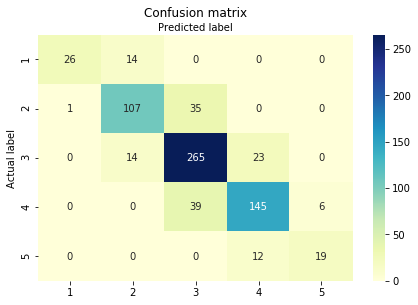

In [159]:
X, Y = getXY(fill_iter_impute)
model_lda = LDA()
lda_output = run_model(model_lda, X, Y)

Score for the model 0.7960339943342776
              precision    recall  f1-score   support

         1.0       0.96      0.65      0.78        40
         2.0       0.79      0.75      0.77       143
         3.0       0.78      0.88      0.83       302
         4.0       0.81      0.76      0.78       190
         5.0       0.76      0.61      0.68        31

   micro avg       0.80      0.80      0.80       706
   macro avg       0.82      0.73      0.77       706
weighted avg       0.80      0.80      0.79       706

Accuracy: 0.7960339943342776
Precision: 0.8205644051130776
Recall: 0.7303592625007302


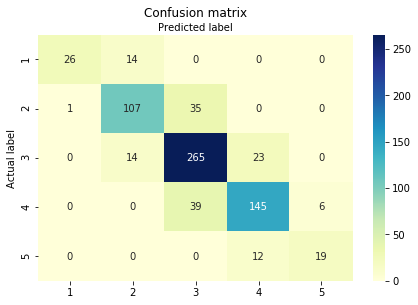

In [118]:
X, Y = getXY(fill_iter_impute)
model_qda = LDA()
qda_output = run_model(model_qda, X, Y, fit_only=True)

# KNN data

Score for the model 0.8031161473087819
              precision    recall  f1-score   support

         1.0       0.96      0.62      0.76        40
         2.0       0.78      0.76      0.77       143
         3.0       0.80      0.87      0.83       302
         4.0       0.82      0.79      0.80       190
         5.0       0.79      0.61      0.69        31

   micro avg       0.80      0.80      0.80       706
   macro avg       0.83      0.73      0.77       706
weighted avg       0.81      0.80      0.80       706

Accuracy: 0.8031161473087819
Precision: 0.8284349341944942
Recall: 0.7327573715370407


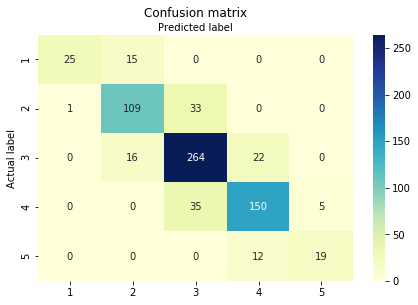

In [119]:
X, Y = getXY(fill_knn)
model_qda_knn = LDA()
model_qda_knn_output = run_model(model_qda_knn, X, Y, fit_only=True)

## Mean Data

Score for the model 0.660056657223796
              precision    recall  f1-score   support

           1       0.67      0.35      0.46        40
           2       0.61      0.63      0.62       143
           3       0.71      0.79      0.75       302
           4       0.73      0.53      0.61       190
           5       0.35      0.71      0.47        31

   micro avg       0.66      0.66      0.66       706
   macro avg       0.61      0.60      0.58       706
weighted avg       0.68      0.66      0.66       706

Accuracy: 0.660056657223796
Precision: 0.6143283766744904
Recall: 0.6020131649908238


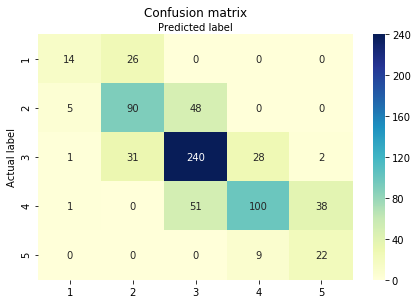

In [117]:
X, Y = getXY(fill_mean)
model_qda_mean = QDA()
model_qda_mean_output = run_model(model_qda_mean, X, Y, fit_only=True)

# Logistic Regression

## Imputate Data

In [18]:
from sklearn.linear_model import LogisticRegression

Score for the model 0.5963172804532578
              precision    recall  f1-score   support

         1.0       0.89      0.20      0.33        40
         2.0       0.52      0.24      0.33       143
         3.0       0.56      0.92      0.70       302
         4.0       0.74      0.46      0.57       190
         5.0       0.79      0.48      0.60        31

   micro avg       0.60      0.60      0.60       706
   macro avg       0.70      0.46      0.50       706
weighted avg       0.63      0.60      0.56       706

Accuracy: 0.5963172804532578
Precision: 0.6993399582873268
Recall: 0.45934929707852723


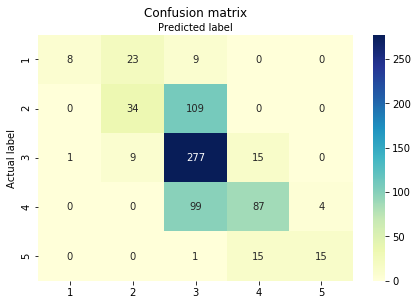

In [19]:
# solver='lbfgs','newton-cg' failed to converge
X, Y = getXY(fill_iter_impute)
model_logistic = LogisticRegression(solver='liblinear', fit_intercept=False,C=1000000,multi_class='auto', max_iter=1000)
# .fit(X,Y)
# model_logistic.predict(X_test)

logistic_impute = run_model(model_logistic, X, Y, fit_only=True)

## KNN Data

Score for the model 0.5934844192634561
              precision    recall  f1-score   support

         1.0       0.88      0.17      0.29        40
         2.0       0.52      0.24      0.33       143
         3.0       0.56      0.91      0.69       302
         4.0       0.73      0.47      0.57       190
         5.0       0.88      0.45      0.60        31

   micro avg       0.59      0.59      0.59       706
   macro avg       0.71      0.45      0.49       706
weighted avg       0.63      0.59      0.56       706

Accuracy: 0.5934844192634561
Precision: 0.7102679747632292
Recall: 0.44867844402193785


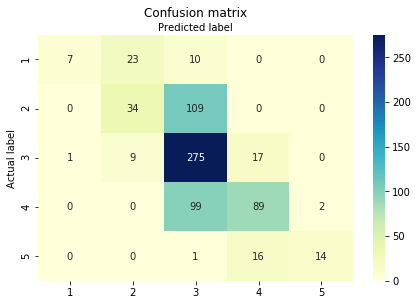

In [20]:
X, Y = getXY(fill_knn)
model_logistic_knn = LogisticRegression(solver='liblinear', fit_intercept=False,C=1000000,multi_class='auto', max_iter=1000)
logistic_knn = run_model(model_logistic_knn, X, Y, fit_only=True)

## Mean

Score for the model 0.5892351274787535
              precision    recall  f1-score   support

           1       0.80      0.20      0.32        40
           2       0.50      0.22      0.30       143
           3       0.55      0.91      0.69       302
           4       0.72      0.47      0.57       190
           5       0.88      0.45      0.60        31

   micro avg       0.59      0.59      0.59       706
   macro avg       0.69      0.45      0.49       706
weighted avg       0.62      0.59      0.55       706

Accuracy: 0.5892351274787535
Precision: 0.6904225178615423
Recall: 0.4488203881705045


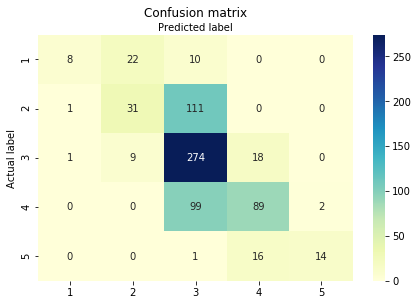

In [21]:
X, Y = getXY(fill_mean)
model_logistic_mean = LogisticRegression(solver='liblinear', fit_intercept=False,C=1000000,multi_class='auto', max_iter=1000)
logistic_mean = run_model(model_logistic_mean, X, Y, fit_only=True)

# GradientBoostingRegressor 

In [160]:
import matplotlib.pylab as plt
def regression_metrics(model, X, Y, plot=False):
    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
    model.fit(X_train,y_train)
#     print("******Score {0}".format(model.score())
    
#     plt.plot(model.staged_predict(X_test))
    y_pred_on_test_data = model.predict(X_test)
    mse_dt = mean_squared_error(y_test, y_pred_on_test_data)
    rmse_dt = mse_dt**(1/2)

    # Print rmse_dt
    print("Test set RMSE of dt: {:.2f} (before the square root-{:.2f})".format(rmse_dt, mse_dt))
    MSE_CV_scores = - cross_val_score(model, X_train, y_train, cv=10, 
                                      scoring='neg_mean_squared_error', 
                                      n_jobs=-1) 

    # Compute the 10-folds CV RMSE
    RMSE_CV = (MSE_CV_scores.mean())**(1/2)

    # Print RMSE_CV
    print('CV RMSE: {:.2f}'.format(RMSE_CV))
    if plot:
        plt.plot(model.train_score_)
        plt.show()
    if plot:
        plt.barh(model.feature_importances_, height=0.5, width=0.5)
        plt.show()
    return model

## Impute Data

In [161]:
X, Y = getXY_regression(fill_iter_impute)
model_gradient_impute = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=i, random_state=0, loss='ls')
mod = regression_metrics(model_gradient_impute, X, Y, plot=False)

Test set RMSE of dt: 1.74 (before the square root-3.02)
CV RMSE: 1.70


In [162]:
mod.feature_importances_

array([0.00373189, 0.00621715, 0.00435857, 0.00210365, 0.00230862,
       0.0030111 , 0.00440614, 0.00318086, 0.00424663, 0.00280044,
       0.00227945, 0.00321823, 0.00380428, 0.00425636, 0.00315708,
       0.00354973, 0.00091318, 0.00153219, 0.00371742, 0.00427755,
       0.00833455, 0.00135301, 0.00403589, 0.00304821, 0.00267655,
       0.00389136, 0.88363472, 0.00382189, 0.01771766, 0.00441563])

In [111]:
feature = pd.Series(mod.feature_importances_)

<BarContainer object of 30 artists>

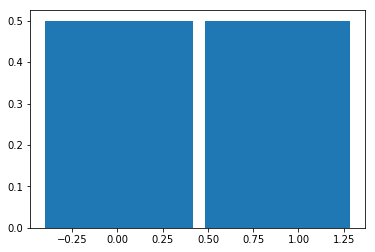

In [112]:
plt.bar(feature, height=0.5)

In [163]:
X, Y = getXY_regression(fill_iter_impute)
for i in range(1,20):
    print("*"*50," Max Depth: ",i )
    model_gradient_impute = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=i, random_state=0, loss='ls')
    regression_metrics(model_gradient_impute, X, Y)

**************************************************  Max Depth:  1
Test set RMSE of dt: 1.29 (before the square root-1.67)
CV RMSE: 1.31
**************************************************  Max Depth:  2
Test set RMSE of dt: 1.26 (before the square root-1.59)
CV RMSE: 1.28
**************************************************  Max Depth:  3
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
**************************************************  Max Depth:  4
Test set RMSE of dt: 1.28 (before the square root-1.63)
CV RMSE: 1.26
**************************************************  Max Depth:  5
Test set RMSE of dt: 1.28 (before the square root-1.64)
CV RMSE: 1.27
**************************************************  Max Depth:  6
Test set RMSE of dt: 1.33 (before the square root-1.76)
CV RMSE: 1.28
**************************************************  Max Depth:  7
Test set RMSE of dt: 1.33 (before the square root-1.78)
CV RMSE: 1.29
************************************************

## KNN data

In [164]:
X, Y = getXY_regression(fill_knn)

for i in range(1,10):
    print("*"*50,"KNN data Max Depth: ",i )
    model_gradient_knn = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=3, random_state=0, loss='ls')
    regression_metrics(model_gradient_knn, X, Y)

************************************************** KNN data Max Depth:  1
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  2
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  3
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  4
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  5
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  6
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** KNN data Max Depth:  7
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMS

## Mean data

In [165]:
X, Y = getXY_regression(fill_mean)
for i in range(1,10):
    print("*"*50,"Mean Data-  Max Depth: ",i )
    model_gradient_mean = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=i, random_state=0, loss='ls')
    regression_metrics(model_gradient_mean, X, Y)

************************************************** Mean Data-  Max Depth:  1
Test set RMSE of dt: 1.29 (before the square root-1.67)
CV RMSE: 1.31
************************************************** Mean Data-  Max Depth:  2
Test set RMSE of dt: 1.26 (before the square root-1.59)
CV RMSE: 1.28
************************************************** Mean Data-  Max Depth:  3
Test set RMSE of dt: 1.25 (before the square root-1.57)
CV RMSE: 1.27
************************************************** Mean Data-  Max Depth:  4
Test set RMSE of dt: 1.28 (before the square root-1.63)
CV RMSE: 1.26
************************************************** Mean Data-  Max Depth:  5
Test set RMSE of dt: 1.28 (before the square root-1.64)
CV RMSE: 1.27
************************************************** Mean Data-  Max Depth:  6
Test set RMSE of dt: 1.33 (before the square root-1.76)
CV RMSE: 1.28
************************************************** Mean Data-  Max Depth:  7
Test set RMSE of dt: 1.33 (before the squ

In [28]:
import pandas as pd
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler

# read in all three filled datasets
mean = pd.read_csv('hospitaldata_mean.csv')  # filled with mean values
iterative = pd.read_csv('hospitaldata_iterative.csv')  # filled with linear regression
knn = pd.read_csv('hospitaldata_knn.csv')  # filled with knn

mean.head()

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,...,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,2
1,1,1,10005,3.0,15.500000,3.230405,10.9,15.3,20.8,15.7,...,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,1135,34,3
2,2,2,10006,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,...,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,579,22,2
3,3,3,10007,2.8,13.172227,3.230405,8.3,13.3,21.6,15.9,...,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467,185,27,2
4,4,4,10011,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,...,81,86,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,2193,33,3


In [13]:
def run_OLS(df):
    
    # split train and test data
    xtrain, xtest, ytrain, ytest = train_test_split(
        df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
                  'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
                  'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
                  'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
                  'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
                  'H_QUIET_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']], 
        df[['H_RECMND_LINEAR_SCORE']], test_size=0.2, random_state=0)

    X = xtrain
    y = ytrain

    # fit multiple regression model
    model = sm.OLS(y, X).fit()
    predictions = model.predict(X) # make the predictions by the model

    # Print out the statistics
    model.summary()
    
    # Compute y_pred_ols
    y_pred_ols = model.predict(xtest)

    # Compute mse_dt
    mse_ols = MSE(ytest, y_pred_ols)

    # Compute rmse_dt
    rmse_ols = mse_ols**(1/2)

    # Print rmse_dt
    print("Test set RMSE of OLS: {:.2f}".format(rmse_ols))

In [19]:
run_OLS(mean)

Test set RMSE of OLS: 1.34


In [20]:
run_OLS(iterative)

Test set RMSE of OLS: 1.34


In [21]:
run_OLS(knn)

Test set RMSE of OLS: 1.34


No difference between the 3 filled datasets when using multiple linear regression. All achieved RMSE of 1.34. 

In [40]:
def run_SVM(df, kernel_type):
    
    # split trainn and test data
    xtrain, xtest, ytrain, ytest = train_test_split(
        df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
                  'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
                  'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
                  'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
                  'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
                  'H_QUIET_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']], 
        df[['STAR_RATING']], test_size=0.2, random_state=0)
    
    # scale data
    scaler = StandardScaler()
    xtrain = scaler.fit_transform(xtrain)
    xtest = scaler.fit_transform(xtest)

    # run SVM
    svc = svm.SVC(kernel=kernel_type, C=1)
    svc.fit(xtrain, ytrain)
    y_pred_svm = svc.predict(xtest)
    print(classification_report(ytest, y_pred_svm))

In [41]:
run_SVM(mean, 'linear')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           1       0.97      0.75      0.85        40
           2       0.82      0.72      0.77       143
           3       0.77      0.88      0.82       302
           4       0.82      0.74      0.78       190
           5       0.73      0.71      0.72        31

    accuracy                           0.80       706
   macro avg       0.82      0.76      0.79       706
weighted avg       0.80      0.80      0.80       706



In [38]:
df = knn
xtrain, xtest, ytrain, ytest = train_test_split(
    df[['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD', 'MORT_30_HF', 'MORT_30_PN',
              'MORT_30_STK', 'PSI_10_POST_KIDNEY', 'PSI_11_POST_RESP', 'PSI_12_POSTOP_PULMEMB_DVT', 'PSI_13_POST_SEPSIS',
              'PSI_14_POSTOP_DEHIS', 'PSI_15_ACC_LAC', 'PSI_3_ULCER', 'PSI_4_SURG_COMP', 'PSI_6_IAT_PTX',
              'PSI_8_POST_HIP', 'PSI_90_SAFETY', 'PSI_9_POST_HEM', 'H_CLEAN_LINEAR_SCORE', 'H_COMP_1_LINEAR_SCORE', 'H_COMP_2_LINEAR_SCORE', 'H_COMP_3_LINEAR_SCORE',
              'H_COMP_5_LINEAR_SCORE', 'H_COMP_6_LINEAR_SCORE', 'H_COMP_7_LINEAR_SCORE', 'H_HSP_RATING_LINEAR_SCORE',
              'H_QUIET_LINEAR_SCORE', 'Number of Completed Surveys', 'Survey Response Rate Percent']], 
    df[['STAR_RATING']], test_size=0.2, random_state=0)
scaler = StandardScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.fit_transform(xtest)

# run SVM
svc = svm.SVC(kernel='rbf', C=1)
svc.fit(xtrain, ytrain)
y_pred_svm = svc.predict(xtest)
print(classification_report(ytest, y_pred_svm))

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.88      0.38      0.53        40
         2.0       0.71      0.63      0.67       143
         3.0       0.72      0.89      0.80       302
         4.0       0.81      0.70      0.75       190
         5.0       0.73      0.61      0.67        31

    accuracy                           0.75       706
   macro avg       0.77      0.64      0.68       706
weighted avg       0.75      0.75      0.74       706



In [42]:
run_SVM(mean, 'rbf')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           1       0.88      0.38      0.53        40
           2       0.71      0.62      0.66       143
           3       0.72      0.89      0.80       302
           4       0.80      0.72      0.76       190
           5       0.81      0.55      0.65        31

    accuracy                           0.75       706
   macro avg       0.78      0.63      0.68       706
weighted avg       0.75      0.75      0.74       706



In [43]:
run_SVM(mean, 'poly')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

           1       0.88      0.53      0.66        40
           2       0.60      0.35      0.44       143
           3       0.60      0.91      0.72       302
           4       0.80      0.47      0.59       190
           5       0.76      0.61      0.68        31

    accuracy                           0.64       706
   macro avg       0.72      0.57      0.62       706
weighted avg       0.67      0.64      0.62       706



In [44]:
run_SVM(iterative, 'linear')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.97      0.75      0.85        40
         2.0       0.82      0.73      0.77       143
         3.0       0.78      0.89      0.83       302
         4.0       0.82      0.76      0.79       190
         5.0       0.78      0.68      0.72        31

    accuracy                           0.80       706
   macro avg       0.83      0.76      0.79       706
weighted avg       0.81      0.80      0.80       706



In [45]:
run_SVM(iterative, 'rbf')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.89      0.42      0.58        40
         2.0       0.71      0.63      0.67       143
         3.0       0.72      0.88      0.79       302
         4.0       0.79      0.71      0.75       190
         5.0       0.78      0.58      0.67        31

    accuracy                           0.75       706
   macro avg       0.78      0.65      0.69       706
weighted avg       0.75      0.75      0.74       706



In [46]:
run_SVM(iterative, 'poly')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.92      0.57      0.71        40
         2.0       0.61      0.37      0.46       143
         3.0       0.60      0.89      0.72       302
         4.0       0.79      0.49      0.60       190
         5.0       0.79      0.61      0.69        31

    accuracy                           0.65       706
   macro avg       0.74      0.59      0.64       706
weighted avg       0.68      0.65      0.63       706



In [47]:
run_SVM(knn, 'linear')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.97      0.70      0.81        40
         2.0       0.80      0.72      0.76       143
         3.0       0.77      0.88      0.83       302
         4.0       0.81      0.76      0.78       190
         5.0       0.74      0.65      0.69        31

    accuracy                           0.80       706
   macro avg       0.82      0.74      0.77       706
weighted avg       0.80      0.80      0.79       706



In [48]:
run_SVM(knn, 'rbf')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.88      0.38      0.53        40
         2.0       0.71      0.63      0.67       143
         3.0       0.72      0.89      0.80       302
         4.0       0.81      0.70      0.75       190
         5.0       0.73      0.61      0.67        31

    accuracy                           0.75       706
   macro avg       0.77      0.64      0.68       706
weighted avg       0.75      0.75      0.74       706



In [49]:
run_SVM(knn, 'poly')

C:\Users\mgow\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

         1.0       0.84      0.53      0.65        40
         2.0       0.58      0.35      0.44       143
         3.0       0.60      0.90      0.72       302
         4.0       0.80      0.49      0.61       190
         5.0       0.79      0.61      0.69        31

    accuracy                           0.64       706
   macro avg       0.72      0.58      0.62       706
weighted avg       0.67      0.64      0.63       706



The filled datasets also performed roughly the same, with a linear kernel achieving accuracy of .80, rbf .75, and poly .64-.65. 

# Gradient Boosted Classification and XGBoost Regression Models

### Upload Relevant Datasets

In [1]:
import pandas as pd

In [2]:
#Upload hospitaldata_iterative.csv
hd_iter = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_iterative.csv')

In [3]:
hd_iter.head(1)

,Unnamed: 0,Unnamed: 0.1,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,...,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.5,...,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0


In [4]:
#Upload hospitaldata_knn.csv
hd_KMeans = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_knn.csv')

In [5]:
hd_KMeans.head(1)

,Unnamed: 0,Unnamed: 0.1,Provider ID,Hospital Name,Address,City,State,ZIP Code,COMP_HIP_KNEE,MORT_30_AMI,...,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301.0,3.0,14.5,...,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0


In [6]:
#Upload hospitaldata_mean.csv
hd_means = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_mean.csv')

In [7]:
hd_means.head(1)

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.5,4.5,8.9,12.5,16.2,13.7,...,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,2


## XGBoost

### Prepare the hospitaldata_iterative Dataset for the Regression Model Run

In [8]:
# Explore the Iter dataset
hd_iter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
Hospital Name                   3529 non-null object
Address                         3529 non-null object
City                            3529 non-null object
State                           3529 non-null object
ZIP Code                        3529 non-null float64
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 n

In [9]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_iter.drop(['STAR_RATING', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [10]:
# Explore the Iter dataset
hd_iter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [11]:
#import the required packages
%matplotlib inline
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
# Importing Classifier Modules
from sklearn.linear_model import LogisticRegression
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="white")

In [12]:
#split dataset in features and target variable
feature_cols = ['COMP_HIP_KNEE', 'MORT_30_AMI', 'MORT_30_CABG', 'MORT_30_COPD','MORT_30_HF','MORT_30_PN','MORT_30_STK','PSI_10_POST_KIDNEY','PSI_11_POST_RESP','PSI_12_POSTOP_PULMEMB_DVT','PSI_13_POST_SEPSIS','PSI_14_POSTOP_DEHIS','PSI_15_ACC_LAC','PSI_3_ULCER','PSI_4_SURG_COMP','PSI_6_IAT_PTX','PSI_8_POST_HIP','PSI_90_SAFETY','H_CLEAN_LINEAR_SCORE','H_COMP_1_LINEAR_SCORE','H_COMP_2_LINEAR_SCORE','H_COMP_3_LINEAR_SCORE','H_COMP_5_LINEAR_SCORE','H_COMP_6_LINEAR_SCORE','H_COMP_7_LINEAR_SCORE','H_HSP_RATING_LINEAR_SCORE','H_QUIET_LINEAR_SCORE']
X = hd_iter[feature_cols] # Features
Y = hd_iter.H_RECMND_LINEAR_SCORE # Target variable

In [13]:
# split X and Y into training and testing sets
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.33, random_state=42)

In [14]:
X_train.head(2)

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,PSI_90_SAFETY,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE
2499,2.8,13.1,3.2,8.8,13.9,14.0,13.0,1.64,8.29,4.66,...,1.02,87.0,92.0,93.0,85.0,76.0,87.0,83.0,91.0,86.0
2357,2.7,13.6,3.6,9.4,12.2,14.6,12.9,1.21,10.32,4.34,...,1.12,80.0,90.0,91.0,81.0,74.0,87.0,80.0,86.0,74.0


In [15]:
Y_train.head(2)

2499    92.0
2357    85.0
Name: H_RECMND_LINEAR_SCORE, dtype: float64

### Run XGBoost on the hospitaldata_iterative Dataset

In [16]:
import xgboost as xgb
from xgboost import plot_importance

In [17]:
# xgb models only accept 'DMatrix' input; convert the data here
dtrain = xgb.DMatrix(X_train, label=Y_train)
dtest = xgb.DMatrix(X_test, label=Y_test)

# parameter grid for xgb model
param_dict = {
    # Parameters that we are going to tune. See discussion below for explanation of 
    # parameters and tuning
    'max_depth':6, 
    'min_child_weight': 1,
    'eta':.1,
    'subsample': 1,
    'colsample_bytree': 1,
    # Other parameters
    'objective':'reg:linear',
    'eval_metric':'rmse'
}

# train XGB model on split training data using split test data
num_boost_round=999
model = xgb.train(
    param_dict,
    dtrain,
    num_boost_round=num_boost_round,
    evals=[(dtest, "Test")],
    early_stopping_rounds=10
)

print("Model's best RMSE on test set: ", model.best_score)
print("Model's best iteration: ", model.best_iteration+1)

[0]	Test-rmse:78.995
Will train until Test-rmse hasn't improved in 10 rounds.
[1]	Test-rmse:71.111
[2]	Test-rmse:64.014
[3]	Test-rmse:57.6291
[4]	Test-rmse:51.8816
[5]	Test-rmse:46.7042
[6]	Test-rmse:42.0455
[7]	Test-rmse:37.8542
[8]	Test-rmse:34.0823
[9]	Test-rmse:30.6833
[10]	Test-rmse:27.6284
[11]	Test-rmse:24.8799
[12]	Test-rmse:22.407
[13]	Test-rmse:20.1804
[14]	Test-rmse:18.1772
[15]	Test-rmse:16.3744
[16]	Test-rmse:14.7527
[17]	Test-rmse:13.2952
[18]	Test-rmse:11.9844
[19]	Test-rmse:10.8062
[20]	Test-rmse:9.74886
[21]	Test-rmse:8.79642
[22]	Test-rmse:7.94322
[23]	Test-rmse:7.1801
[24]	Test-rmse:6.49303
[25]	Test-rmse:5.87411
[26]	Test-rmse:5.32376
[27]	Test-rmse:4.83231
[28]	Test-rmse:4.39434
[29]	Test-rmse:4.00009
[30]	Test-rmse:3.65169
[31]	Test-rmse:3.34173
[32]	Test-rmse:3.06626
[33]	Test-rmse:2.82421
[34]	Test-rmse:2.61072
[35]	Test-rmse:2.42424
[36]	Test-rmse:2.26033
[37]	Test-rmse:2.11751
[38]	Test-rmse:1.99386
[39]	Test-rmse:1.88885
[40]	Test-rmse:1.79651
[41]	Test-rmse:

In [18]:
from sklearn.metrics import mean_squared_error
from math import sqrt
# convert training data to DMatrix object
dpred=xgb.DMatrix(X_train)

# predict RMSE of Gradient Boosted Decision Tree model on training data
print("RMSE of XGB model on training data: ",
      np.sqrt(mean_squared_error(model.predict(dpred), Y_train)))
RMSE_iter_t = np.sqrt(mean_squared_error(model.predict(dpred), Y_train))

# predict RMSE of model on test data
GBDT_test_pred = model.predict(xgb.DMatrix(X_test))
print("RMSE of XGB model on test data: ",
      np.sqrt(mean_squared_error(GBDT_test_pred, Y_test)))
RMSE_iter_test = np.sqrt(mean_squared_error(GBDT_test_pred, Y_test))


RMSE of XGB model on training data:  0.6481981464358001
RMSE of XGB model on test data:  1.310065897247246


Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit.
https://www.statisticshowto.datasciencecentral.com/rmse/

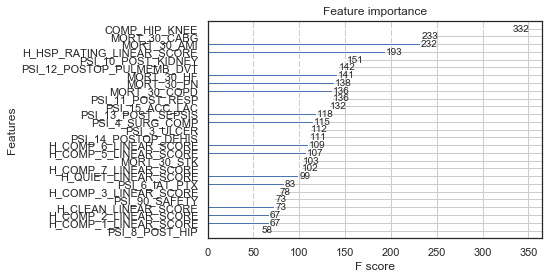

In [19]:
# plot F-score of each feature using xgboost's .plot_importance() method
plt.show(plot_importance(model))

F Value in Regression
The F value in regression is the result of a test where the null hypothesis is that all of the regression coefficients are equal to zero. In other words, the model has no predictive capability. Basically, the f-test compares your model with zero predictor variables (the intercept only model), and decides whether your added coefficients improved the model. If you get a significant result, then whatever coefficients you included in your model improved the model’s fit.
https://www.statisticshowto.datasciencecentral.com/probability-and-statistics/f-statistic-value-test/

The F statistic is a ratio of 2 different measure of variance for the data. If the null hypothesis is true then these are both estimates of the same thing and the ratio will be around 1.

The numerator is computed by measuring the variance of the means and if the true means of the groups are identical then this is a function of the overall variance of the data. But if the null hypothesis is false and the means are not all equal, then this measure of variance will be larger.

The denominator is an average of the sample variances for each group, which is an estimate of the overall population variance (assuming all groups have equal variances).

So when the null of all means equal is true then the 2 measures (with some extra terms for degrees of freedom) will be similar and the ratio will be close to 1. If the null is false, then the numerator will be large relative to the denominator and the ratio will be greater than 1.

### Prepare the hospitaldata_knn.csv Dataset for the Regression Model Run

In [20]:
# Explore the KNN dataset
hd_KMeans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
Hospital Name                   3529 non-null object
Address                         3529 non-null object
City                            3529 non-null object
State                           3529 non-null object
ZIP Code                        3529 non-null float64
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 n

In [21]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_KMeans.drop(['STAR_RATING', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [22]:
# Explore the KNN dataset
hd_KMeans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [23]:
#split dataset in features and target variable
X_k = hd_KMeans[feature_cols] # Features
Y_k = hd_KMeans.H_RECMND_LINEAR_SCORE # Target variable

In [24]:
# split X and Y into training and testing sets
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_k,Y_k,test_size=0.33, random_state=42)

In [25]:
X_train.head(2)

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,PSI_90_SAFETY,H_CLEAN_LINEAR_SCORE,H_COMP_1_LINEAR_SCORE,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE
2499,2.8,13.1,3.2,8.8,13.9,14.0,13.0,1.64,8.29,4.66,...,1.02,87.0,92.0,93.0,85.0,76.0,87.0,83.0,91.0,86.0
2357,2.7,13.6,3.6,9.4,12.2,14.6,12.9,1.21,10.32,4.34,...,1.12,80.0,90.0,91.0,81.0,74.0,87.0,80.0,86.0,74.0


In [26]:
Y_train.head(2)

2499    92.0
2357    85.0
Name: H_RECMND_LINEAR_SCORE, dtype: float64

### Run XGBoost on the hospitaldata_knn Dataset

In [27]:
# xgb models only accept 'DMatrix' input; convert the data here
dtrain = xgb.DMatrix(X_train, label=Y_train)
dtest = xgb.DMatrix(X_test, label=Y_test)

# parameter grid for xgb model
param_dict = {
    # Parameters that we are going to tune. See discussion below for explanation of 
    # parameters and tuning
    'max_depth':6, 
    'min_child_weight': 1,
    'eta':.1,
    'subsample': 1,
    'colsample_bytree': 1,
    # Other parameters
    'objective':'reg:linear',
    'eval_metric':'rmse'
}

# train XGB model on split training data using split test data
num_boost_round=999
model = xgb.train(
    param_dict,
    dtrain,
    num_boost_round=num_boost_round,
    evals=[(dtest, "Test")],
    early_stopping_rounds=10
)

print("Model's best RMSE on test set: ", model.best_score)
print("Model's best iteration: ", model.best_iteration+1)

[0]	Test-rmse:78.995
Will train until Test-rmse hasn't improved in 10 rounds.
[1]	Test-rmse:71.111
[2]	Test-rmse:64.014
[3]	Test-rmse:57.6291
[4]	Test-rmse:51.8816
[5]	Test-rmse:46.7042
[6]	Test-rmse:42.0455
[7]	Test-rmse:37.8542
[8]	Test-rmse:34.0823
[9]	Test-rmse:30.6833
[10]	Test-rmse:27.6284
[11]	Test-rmse:24.8799
[12]	Test-rmse:22.407
[13]	Test-rmse:20.1804
[14]	Test-rmse:18.1772
[15]	Test-rmse:16.3744
[16]	Test-rmse:14.7527
[17]	Test-rmse:13.2952
[18]	Test-rmse:11.9844
[19]	Test-rmse:10.8055
[20]	Test-rmse:9.74798
[21]	Test-rmse:8.79561
[22]	Test-rmse:7.94182
[23]	Test-rmse:7.17118
[24]	Test-rmse:6.48391
[25]	Test-rmse:5.86907
[26]	Test-rmse:5.31781
[27]	Test-rmse:4.82748
[28]	Test-rmse:4.39016
[29]	Test-rmse:3.99836
[30]	Test-rmse:3.65117
[31]	Test-rmse:3.3451
[32]	Test-rmse:3.07196
[33]	Test-rmse:2.83048
[34]	Test-rmse:2.61553
[35]	Test-rmse:2.42884
[36]	Test-rmse:2.26754
[37]	Test-rmse:2.1263
[38]	Test-rmse:2.00295
[39]	Test-rmse:1.89879
[40]	Test-rmse:1.80834
[41]	Test-rmse:1

In [28]:
from sklearn.metrics import mean_squared_error
from math import sqrt
# convert training data to DMatrix object
dpred=xgb.DMatrix(X_train)

# predict RMSE of Gradient Boosted Decision Tree model on training data
print("RMSE of XGB model on training data: ",
      np.sqrt(mean_squared_error(model.predict(dpred), Y_train)))
RMSE_knn_t = np.sqrt(mean_squared_error(model.predict(dpred), Y_train))

# predict RMSE of model on test data
GBDT_test_pred = model.predict(xgb.DMatrix(X_test))
print("RMSE of XGB model on test data: ",
      np.sqrt(mean_squared_error(GBDT_test_pred, Y_test)))
RMSE_knn_test = np.sqrt(mean_squared_error(GBDT_test_pred, Y_test))

RMSE of XGB model on training data:  0.8589708529100836
RMSE of XGB model on test data:  1.3471061889410627


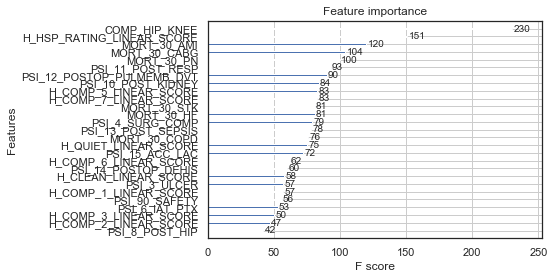

In [29]:
# plot F-score of each feature using xgboost's .plot_importance() method
plt.show(plot_importance(model))

### Prepare the hospitaldata_mean.csv Dataset for the Regression Model Run

In [30]:
# Explore the Means dataset
hd_means.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT       3529 non-null float64
PSI_13_POST_SEPSIS              3529 non-null float64
PSI_14_POSTOP_DEHIS             3529 non-null float64
PSI_15_ACC_LAC                  3529 non-null float64
PSI_3_ULCER                     35

In [31]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_means.drop(['STAR_RATING', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [32]:
# Explore the Means dataset
hd_means.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [33]:
#split dataset in features and target variable
X_m = hd_means[feature_cols] # Features
Y_m = hd_means.H_RECMND_LINEAR_SCORE # Target variable

In [34]:
# split X and Y into training and testing sets
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_m,Y_m,test_size=0.33, random_state=42)

### Run XGBoost on the hospitaldata_mean Dataset

In [35]:
# xgb models only accept 'DMatrix' input; convert the data here
dtrain = xgb.DMatrix(X_train, label=Y_train)
dtest = xgb.DMatrix(X_test, label=Y_test)

# parameter grid for xgb model
param_dict = {
    # Parameters that we are going to tune. See discussion below for explanation of 
    # parameters and tuning
    'max_depth':6, 
    'min_child_weight': 1,
    'eta':.1,
    'subsample': 1,
    'colsample_bytree': 1,
    # Other parameters
    'objective':'reg:linear',
    'eval_metric':'rmse'
}

# train XGB model on split training data using split test data
num_boost_round=999
model = xgb.train(
    param_dict,
    dtrain,
    num_boost_round=num_boost_round,
    evals=[(dtest, "Test")],
    early_stopping_rounds=10
)

print("Model's best RMSE on test set: ", model.best_score)
print("Model's best iteration: ", model.best_iteration+1)

[0]	Test-rmse:78.995
Will train until Test-rmse hasn't improved in 10 rounds.
[1]	Test-rmse:71.111
[2]	Test-rmse:64.014
[3]	Test-rmse:57.6291
[4]	Test-rmse:51.8816
[5]	Test-rmse:46.7042
[6]	Test-rmse:42.0455
[7]	Test-rmse:37.8542
[8]	Test-rmse:34.0823
[9]	Test-rmse:30.6833
[10]	Test-rmse:27.6284
[11]	Test-rmse:24.8799
[12]	Test-rmse:22.407
[13]	Test-rmse:20.1804
[14]	Test-rmse:18.1772
[15]	Test-rmse:16.3744
[16]	Test-rmse:14.7527
[17]	Test-rmse:13.2952
[18]	Test-rmse:11.9844
[19]	Test-rmse:10.8067
[20]	Test-rmse:9.74805
[21]	Test-rmse:8.79706
[22]	Test-rmse:7.94277
[23]	Test-rmse:7.17638
[24]	Test-rmse:6.48802
[25]	Test-rmse:5.87411
[26]	Test-rmse:5.32474
[27]	Test-rmse:4.83129
[28]	Test-rmse:4.39277
[29]	Test-rmse:3.99906
[30]	Test-rmse:3.65018
[31]	Test-rmse:3.34053
[32]	Test-rmse:3.06744
[33]	Test-rmse:2.82485
[34]	Test-rmse:2.61304
[35]	Test-rmse:2.42526
[36]	Test-rmse:2.2619
[37]	Test-rmse:2.1218
[38]	Test-rmse:1.9979
[39]	Test-rmse:1.89335
[40]	Test-rmse:1.80377
[41]	Test-rmse:1.

In [36]:
from sklearn.metrics import mean_squared_error
from math import sqrt
# convert training data to DMatrix object
dpred=xgb.DMatrix(X_train)

# predict RMSE of Gradient Boosted Decision Tree model on training data
print("RMSE of XGB model on training data: ",
      np.sqrt(mean_squared_error(model.predict(dpred), Y_train)))
RMSE_means_t = np.sqrt(mean_squared_error(model.predict(dpred), Y_train))

# predict RMSE of model on test data
GBDT_test_pred = model.predict(xgb.DMatrix(X_test))
print("RMSE of XGB model on test data: ",
      np.sqrt(mean_squared_error(GBDT_test_pred, Y_test)))
RMSE_means_test = np.sqrt(mean_squared_error(GBDT_test_pred, Y_test))

RMSE of XGB model on training data:  0.8563673282875041
RMSE of XGB model on test data:  1.3407072651250194


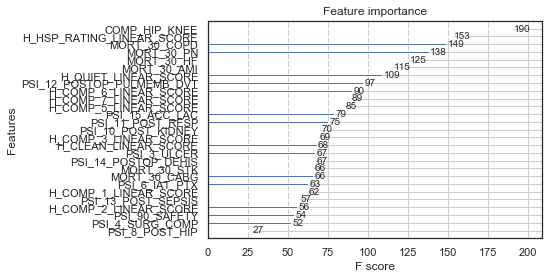

In [37]:
# plot F-score of each feature using xgboost's .plot_importance() method
plt.show(plot_importance(model))

## Gradient Boosted Classification

### Prepare the hospitaldata_iterative Dataset for the Classification Model Run

In [38]:
#Upload hospitaldata_iterative.csv
hd_iter = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_iterative.csv')

In [39]:
# Explore the Iter dataset
hd_iter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
Hospital Name                   3529 non-null object
Address                         3529 non-null object
City                            3529 non-null object
State                           3529 non-null object
ZIP Code                        3529 non-null float64
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 n

In [40]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_iter.drop(['H_RECMND_LINEAR_SCORE', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [41]:
# Explore the Iter dataset
hd_iter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [42]:
#split dataset in features and target variable
X_ig = hd_iter[feature_cols] # Features
Y_ig = hd_iter.STAR_RATING # Target variable

### Run Gradient Boosted on the hospitaldata_iterative Dataset

In [44]:
# Fit the Gradient Boosted Model
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(
    X_ig, Y_ig, random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, Y_train)
gbrt.score(X_train, Y_train)
acc_gbrt = round(gbrt.score(X_train, Y_train) * 100, 2)

In [45]:
# Check the Gradient Boosted Accuracy against the test dataset
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, Y_train)))
acc_train_iter = gbrt.score(X_train, Y_train)
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, Y_test)))
acc_test_iter = gbrt.score(X_test, Y_test)

Accuracy on training set: 0.926
Accuracy on test set: 0.818


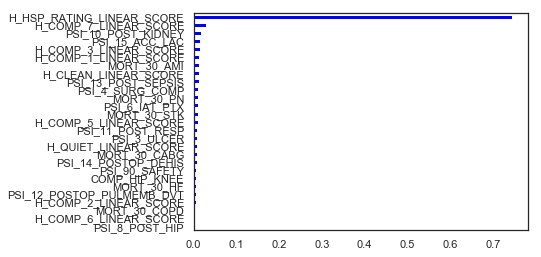

In [46]:
# Check the importance of the features
import pandas as pd
import matplotlib.pyplot as plt
# Create a pd.Series of features importances
importances_gbrt = pd.Series(gbrt.feature_importances_,
index = X.columns)
# Sort importances_fgbrt
sorted_importances_gbrt = importances_gbrt.sort_values()
# Make a horizontal bar plot
sorted_importances_gbrt.plot(kind='barh', color='blue')
plt.show()

In [47]:
# import the metrics class to compute the confusion matrix
from sklearn import metrics
Y_pred=gbrt.predict(X_test)
cnf_matrix = metrics.confusion_matrix(Y_test, Y_pred)
cnf_matrix

array([[ 39,  12,   0,   0,   0],
       [  3, 135,  44,   0,   0],
       [  0,  20, 326,  25,   0],
       [  0,   0,  43, 191,   2],
       [  0,   0,   0,  12,  31]])

Text(0.5, 257.44, 'Predicted label')

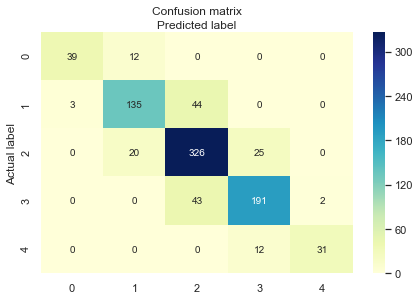

In [48]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# compute the confusion matrix heatmap
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [49]:
# Cross Validation - Entire dataset
from sklearn.model_selection import cross_val_score
gbrt = GradientBoostingClassifier(random_state=0)
scores = cross_val_score(gbrt, X_ig, Y_ig, cv=10, scoring = "accuracy")
print("Scores:", scores)
print("Mean:", scores.mean())
print("Standard Deviation:", scores.std())

Scores: [0.8        0.81408451 0.81355932 0.75637394 0.82386364 0.78977273
 0.78409091 0.74147727 0.78409091 0.80397727]
Mean: 0.7911290494025932
Standard Deviation: 0.024737665860501024


In [50]:
# Cross Validation - Training dataset
from sklearn.model_selection import cross_val_score
gbrt = GradientBoostingClassifier(random_state=0)
scores = cross_val_score(gbrt, X_train, Y_train, cv=10, scoring = "accuracy")
print("Scores:", scores)
print("Mean:", scores.mean())
print("Standard Deviation:", scores.std())

Scores: [0.78358209 0.75471698 0.77735849 0.7509434  0.75       0.76893939
 0.78409091 0.79166667 0.82954545 0.79087452]
Mean: 0.778171790643402
Standard Deviation: 0.022843147151134006


In [51]:
# Cross Validation - Training testing dataset
from sklearn.model_selection import cross_val_score
gbrt = GradientBoostingClassifier(random_state=0)
scores = cross_val_score(gbrt, X_test, Y_test, cv=10, scoring = "accuracy")
print("Scores:", scores)
print("Mean:", scores.mean())
print("Standard Deviation:", scores.std())

Scores: [0.75       0.77777778 0.70786517 0.77272727 0.79545455 0.77272727
 0.8045977  0.77011494 0.87356322 0.89655172]
Mean: 0.792137962343309
Standard Deviation: 0.05293471496133599


### Model Validation - Accuracy - Precision - Recall - F1

#### Train Data Accuracy Report 

In [57]:
# Fit the Gradient Boosted Model
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(
    X_ig, Y_ig, random_state=0)

from sklearn.metrics import classification_report
y_true = Y_train
y_pred = gbrt.predict(X_train)
target_names = ['1 Star', '2 Stars', '3 Stars', '4 Stars', '5 Stars']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

      1 Star       1.00      0.96      0.98       129
     2 Stars       0.93      0.87      0.90       501
     3 Stars       0.91      0.95      0.93      1241
     4 Stars       0.93      0.92      0.92       654
     5 Stars       0.99      0.95      0.97       121

    accuracy                           0.93      2646
   macro avg       0.95      0.93      0.94      2646
weighted avg       0.93      0.93      0.93      2646



#### Test Data Accuracy Report

In [58]:
# Fit the Gradient Boosted Model
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(
    X_ig, Y_ig, random_state=0)

from sklearn.metrics import classification_report
y_true = Y_test
y_pred = gbrt.predict(X_test)
target_names = ['1 Star', '2 Stars', '3 Stars', '4 Stars', '5 Stars']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

      1 Star       0.93      0.76      0.84        51
     2 Stars       0.81      0.74      0.77       182
     3 Stars       0.79      0.88      0.83       371
     4 Stars       0.84      0.81      0.82       236
     5 Stars       0.94      0.72      0.82        43

    accuracy                           0.82       883
   macro avg       0.86      0.78      0.82       883
weighted avg       0.82      0.82      0.82       883



#### Model Results Interpretation

https://tutorials.datasciencedojo.com/introduction-precision-recall-f1/

https://www.youtube.com/watch?v=xugjARegisk


In [62]:
## print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp

# Define dataset
y_true = Y_test
y_pred = gbrt.predict(X_test)

# Binarize the output
y_true = label_binarize(y_true, classes=[1, 2, 3, 4, 5])
n_classes = y_true.shape[1]
y_pred = label_binarize(y_pred, classes=[1, 2, 3, 4, 5])
n_classes2 = y_pred.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_pred[:, i], y_true[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_pred.ravel(), y_true.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

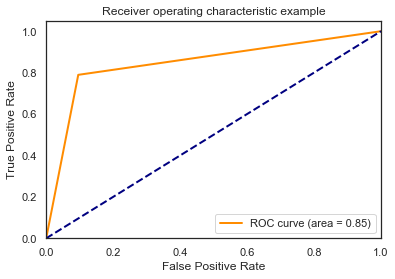

In [63]:
plt.figure()
lw = 2
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### Prepare the hospitaldata_knn Dataset for the Classification Model Run

In [169]:
#Upload hospitaldata_knn.csv
hd_KMeans_G = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_knn.csv')

In [170]:
# Explore the KNN dataset
hd_KMeans_G.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
Hospital Name                   3529 non-null object
Address                         3529 non-null object
City                            3529 non-null object
State                           3529 non-null object
ZIP Code                        3529 non-null float64
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 n

In [171]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_KMeans_G.drop(['H_RECMND_LINEAR_SCORE', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [172]:
# Explore the KNN dataset
hd_KMeans_G.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [173]:
#split dataset in features and target variable
X_kg = hd_KMeans_G[feature_cols] # Features
Y_kg = hd_KMeans_G.STAR_RATING # Target variable

### Run Gradient Boosted on the hospitaldata_knn Dataset

In [174]:
# Fit the Gradient Boosted Model
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(
    X_kg, Y_kg, random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, Y_train)
gbrt.score(X_train, Y_train)
acc_gbrt = round(gbrt.score(X_train, Y_train) * 100, 2)

In [175]:
# Check the Gradient Boosted Accuracy against the test dataset
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, Y_train)))
acc_train_kmeans = gbrt.score(X_train, Y_train)
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, Y_test)))
acc_test_kmeans = gbrt.score(X_test, Y_test)

Accuracy on training set: 0.922
Accuracy on test set: 0.806


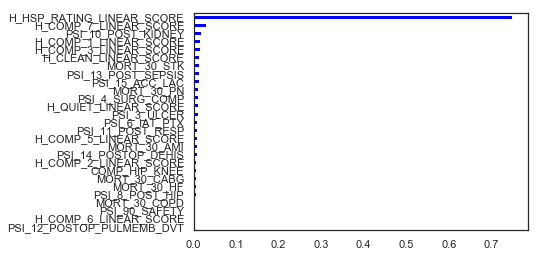

In [176]:
# Check the importance of the features
import pandas as pd
import matplotlib.pyplot as plt
# Create a pd.Series of features importances
importances_gbrt = pd.Series(gbrt.feature_importances_,
index = X.columns)
# Sort importances_fgbrt
sorted_importances_gbrt = importances_gbrt.sort_values()
# Make a horizontal bar plot
sorted_importances_gbrt.plot(kind='barh', color='blue')
plt.show()

In [177]:
# import the metrics class to compute the confusion matrix
from sklearn import metrics
Y_pred=gbrt.predict(X_test)
cnf_matrix = metrics.confusion_matrix(Y_test, Y_pred)
cnf_matrix

array([[ 37,  14,   0,   0,   0],
       [  5, 134,  43,   0,   0],
       [  0,  20, 324,  27,   0],
       [  0,   0,  45, 183,   8],
       [  0,   0,   0,   9,  34]])

Text(0.5, 257.44, 'Predicted label')

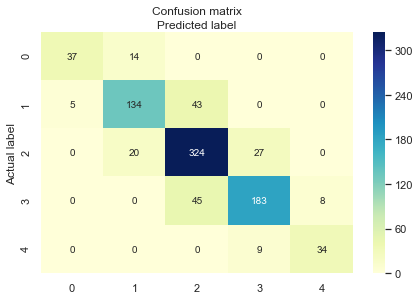

In [178]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# compute the confusion matrix heatmap
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [179]:
# Cross Validation
from sklearn.model_selection import cross_val_score
gbrt = GradientBoostingClassifier(random_state=0)
scores = cross_val_score(gbrt, X_train, Y_train, cv=10, scoring = "accuracy")
print("Scores:", scores)
print("Mean:", scores.mean())
print("Standard Deviation:", scores.std())

Scores: [0.7761194  0.76603774 0.77735849 0.7509434  0.74621212 0.76136364
 0.79545455 0.76893939 0.81060606 0.78707224]
Mean: 0.774010702654835
Standard Deviation: 0.018813328194241603


### Prepare the hospitaldata_mean Dataset for the Classification Model Run

In [180]:
#Upload hospitaldata_mean.csv
hd_means_GB = pd.read_csv('https://raw.githubusercontent.com/maringow/DataMiningGroupProject/master/hospitaldata_mean.csv')

In [181]:
# Explore the Means dataset
hd_means_GB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 40 columns):
Unnamed: 0                      3529 non-null int64
Unnamed: 0.1                    3529 non-null int64
Provider ID                     3529 non-null object
COMP_HIP_KNEE                   3529 non-null float64
MORT_30_AMI                     3529 non-null float64
MORT_30_CABG                    3529 non-null float64
MORT_30_COPD                    3529 non-null float64
MORT_30_HF                      3529 non-null float64
MORT_30_PN                      3529 non-null float64
MORT_30_STK                     3529 non-null float64
PSI_10_POST_KIDNEY              3529 non-null float64
PSI_11_POST_RESP                3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT       3529 non-null float64
PSI_13_POST_SEPSIS              3529 non-null float64
PSI_14_POSTOP_DEHIS             3529 non-null float64
PSI_15_ACC_LAC                  3529 non-null float64
PSI_3_ULCER                     35

In [182]:
# Drop columns flagged based on the Group Features Engineering strategy
hd_means_GB.drop(['H_RECMND_LINEAR_SCORE', 'Survey Response Rate Percent', 'Number of Completed Surveys', 'Unnamed: 0', 'Unnamed: 0.1', 'Provider ID', 'Hospital Name', 'Address', 'City', 'State', 'ZIP Code' ], axis=1, inplace=True)

In [183]:
# Explore the Means dataset
hd_means_GB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3529 entries, 0 to 3528
Data columns (total 29 columns):
COMP_HIP_KNEE                3529 non-null float64
MORT_30_AMI                  3529 non-null float64
MORT_30_CABG                 3529 non-null float64
MORT_30_COPD                 3529 non-null float64
MORT_30_HF                   3529 non-null float64
MORT_30_PN                   3529 non-null float64
MORT_30_STK                  3529 non-null float64
PSI_10_POST_KIDNEY           3529 non-null float64
PSI_11_POST_RESP             3529 non-null float64
PSI_12_POSTOP_PULMEMB_DVT    3529 non-null float64
PSI_13_POST_SEPSIS           3529 non-null float64
PSI_14_POSTOP_DEHIS          3529 non-null float64
PSI_15_ACC_LAC               3529 non-null float64
PSI_3_ULCER                  3529 non-null float64
PSI_4_SURG_COMP              3529 non-null float64
PSI_6_IAT_PTX                3529 non-null float64
PSI_8_POST_HIP               3529 non-null float64
PSI_90_SAFETY             

In [184]:
#split dataset in features and target variable
X_mg = hd_means_GB[feature_cols] # Features
Y_mg = hd_means_GB.STAR_RATING # Target variable

### Run Gradient Boosted on the hospitaldata_mean Dataset

In [185]:
# Fit the Gradient Boosted Model
from sklearn.ensemble import GradientBoostingClassifier
X_train, X_test, Y_train, Y_test = train_test_split(
    X_mg, Y_mg, random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, Y_train)
gbrt.score(X_train, Y_train)
acc_gbrt = round(gbrt.score(X_train, Y_train) * 100, 2)

In [186]:
# Check the Gradient Boosted Accuracy against the test dataset
print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, Y_train)))
acc_train_means  = gbrt.score(X_train, Y_train)
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, Y_test)))
acc_test_means = gbrt.score(X_test, Y_test)

Accuracy on training set: 0.916
Accuracy on test set: 0.815


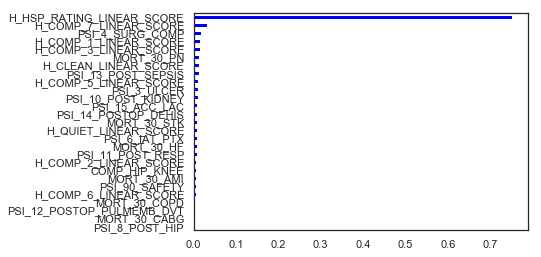

In [187]:
# Check the importance of the features
import pandas as pd
import matplotlib.pyplot as plt
# Create a pd.Series of features importances
importances_gbrt = pd.Series(gbrt.feature_importances_,
index = X.columns)
# Sort importances_fgbrt
sorted_importances_gbrt = importances_gbrt.sort_values()
# Make a horizontal bar plot
sorted_importances_gbrt.plot(kind='barh', color='blue')
plt.show()

In [188]:
# import the metrics class to compute the confusion matrix
from sklearn import metrics
Y_pred=gbrt.predict(X_test)
cnf_matrix = metrics.confusion_matrix(Y_test, Y_pred)
cnf_matrix

array([[ 37,  14,   0,   0,   0],
       [  3, 136,  43,   0,   0],
       [  0,  17, 330,  24,   0],
       [  0,   0,  46, 185,   5],
       [  0,   0,   0,  11,  32]])

Text(0.5, 257.44, 'Predicted label')

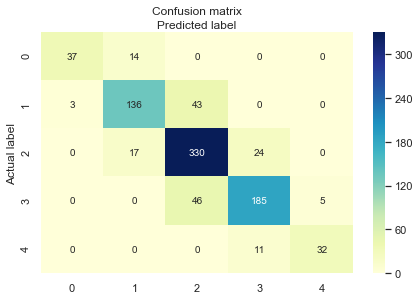

In [189]:
# import required modules
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# compute the confusion matrix heatmap
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [190]:
# Cross Validation
from sklearn.model_selection import cross_val_score
gbrt = GradientBoostingClassifier(random_state=0)
scores = cross_val_score(gbrt, X_train, Y_train, cv=10, scoring = "accuracy")
print("Scores:", scores)
print("Mean:", scores.mean())
print("Standard Deviation:", scores.std())

Scores: [0.79850746 0.74716981 0.76603774 0.77735849 0.75       0.78030303
 0.79166667 0.76893939 0.82954545 0.76425856]
Mean: 0.7773786601010042
Standard Deviation: 0.02326938057829828


## XGBoost Regression Summary

In [193]:
results = pd.DataFrame({
    'Model': ['XGBoost Iterative', 
              'XGBoost KMeans', 
              'XGBoost Means'],
    'RMSE_Train': [RMSE_iter_t, RMSE_knn_t, RMSE_means_t],
    'RMSE_Test': [RMSE_iter_test, RMSE_knn_test, RMSE_means_test]})
result_df = results.sort_values(by='RMSE_Test', ascending=True)
result_df = result_df.set_index('Model')
result_df

,RMSE_Train,RMSE_Test
Model,,
XGBoost Iterative,0.648198,1.310066
XGBoost Means,0.856367,1.340707
XGBoost KMeans,0.858971,1.347106


## Gradient Boosted Classification Summary

In [192]:
results = pd.DataFrame({
    'Model': ['Gradient Boosted Iterative', 
              'Gradient Boosted KMeans', 
              'Gradient Boosted Means'],
    'Score_Train': [acc_train_iter, acc_train_kmeans, acc_train_means],
    'Score_Test': [acc_test_iter, acc_test_kmeans, acc_test_means]})
result_df = results.sort_values(by='Score_Test', ascending=False)
result_df = result_df.set_index('Model')
result_df

,Score_Train,Score_Test
Model,,
Gradient Boosted Iterative,0.925926,0.817667
Gradient Boosted Means,0.915722,0.815402
Gradient Boosted KMeans,0.922147,0.806342


## Recommended Model = Gradient Boosted Classification Using Dataset with Iterative Missing values Imputation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
df_mean=pd.read_csv('hospitaldata_mean.csv')
df_knn=pd.read_csv('hospitaldata_knn.csv')
df_iterative=pd.read_csv('hospitaldata_iterative.csv')

In [3]:
df_mean.head()

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,...,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,2
1,1,1,10005,3.0,15.500000,3.230405,10.9,15.3,20.8,15.7,...,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,1135,34,3
2,2,2,10006,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,...,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,579,22,2
3,3,3,10007,2.8,13.172227,3.230405,8.3,13.3,21.6,15.9,...,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467,185,27,2
4,4,4,10011,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,...,81,86,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,2193,33,3


In [4]:
df_mean.shape

(3529, 40)

In [5]:
c = df_mean['STAR_RATING'].value_counts(dropna=True)
p = df_mean['STAR_RATING'].value_counts(dropna=True, normalize=True)
pd.concat([c,p], axis=1, keys=['counts', '%'])

,counts,%
3,1612,0.456787
4,890,0.252196
2,683,0.193539
1,180,0.051006
5,164,0.046472


# Drop Last Two Digits of ZIP Code

In [6]:
df_mean['ZIP Code'] = df_mean['ZIP Code'].astype(str).str[:-2].astype(np.int64)
df_knn['ZIP Code'] = df_knn['ZIP Code'].astype(str).str[:-2].astype(np.int64)
df_iterative['ZIP Code'] = df_iterative['ZIP Code'].astype(str).str[:-2].astype(np.int64)

In [7]:
df_mean.head()

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,...,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,363,506,21,2
1,1,1,10005,3.0,15.500000,3.230405,10.9,15.3,20.8,15.7,...,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,359,1135,34,3
2,2,2,10006,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,...,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,356,579,22,2
3,3,3,10007,2.8,13.172227,3.230405,8.3,13.3,21.6,15.9,...,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,364,185,27,2
4,4,4,10011,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,...,81,86,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,352,2193,33,3


# Model Selection - Mean

In [8]:
y=df_mean['STAR_RATING']
cols=["COMP_HIP_KNEE","MORT_30_AMI","MORT_30_CABG","MORT_30_COPD","MORT_30_HF","MORT_30_PN","MORT_30_STK",
      "PSI_10_POST_KIDNEY","PSI_11_POST_RESP","PSI_12_POSTOP_PULMEMB_DVT","PSI_13_POST_SEPSIS","PSI_14_POSTOP_DEHIS",
      "PSI_15_ACC_LAC","PSI_3_ULCER","PSI_4_SURG_COMP","PSI_6_IAT_PTX","PSI_8_POST_HIP","PSI_90_SAFETY",
      "PSI_9_POST_HEM"
      ,"H_CLEAN_LINEAR_SCORE","H_COMP_1_LINEAR_SCORE","H_COMP_2_LINEAR_SCORE",
      "H_COMP_3_LINEAR_SCORE","H_COMP_5_LINEAR_SCORE","H_COMP_6_LINEAR_SCORE","H_COMP_7_LINEAR_SCORE"
      ,"H_QUIET_LINEAR_SCORE"
      #,'ZIP Code'
      #,"H_HSP_RATING_LINEAR_SCORE"
     ]
x=df_mean[cols]

In [9]:
#from sklearn.preprocessing import StandardScaler
#import numpy as np
#stscaler = StandardScaler().fit(x)
#x_stand = stscaler.transform(x)

In [10]:
#from sklearn.preprocessing import normalize
#x_norm=x.values
# Any Pre-processing needed?
#x_norm = normalize(x_norm)

In [11]:
import sklearn.model_selection as cv

SEED = 1

(x_train, x_test, y_train, y_test) = cv.train_test_split(x, y, test_size=.20, random_state = SEED)

In [12]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.metrics import f1_score


# Instantiate individual classifiers
rf = RandomForestClassifier(n_estimators=150, random_state=SEED)
knn = KNN(n_neighbors=11)

# Define a list called classifier that contains
# the tuples (classifier_name, classifier)
classifiers = [('Random Forest', rf),
               ('K Nearest Neighbours', knn)
              ]

In [13]:
for clf_name, clf in classifiers:
#fit clf to the training set
    clf.fit(x_train, y_train)
# Predict the labels of the test set
    y_pred = clf.predict(x_test)

# Evaluate the accuracy of clf on the test set
    print('Accuracy: {:s} : {:.3f}'.format(clf_name,accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name,precision_score(y_test, y_pred, average='macro')))
    print('Recall: {:s} : {:.3f}'.format(clf_name,recall_score(y_test, y_pred, average='macro')))
    print('F1 Score: {:s} : {:.3f}'.format(clf_name,f1_score(y_test, y_pred, average='macro')))

Accuracy: Random Forest : 0.661
Precision: Random Forest : 0.672
Recall: Random Forest : 0.562
F1 Score: Random Forest : 0.602
Accuracy: K Nearest Neighbours : 0.598
Precision: K Nearest Neighbours : 0.639
Recall: K Nearest Neighbours : 0.486
F1 Score: K Nearest Neighbours : 0.532


# Feature Importance

In [14]:
model = rf.fit(x_train, y_train)

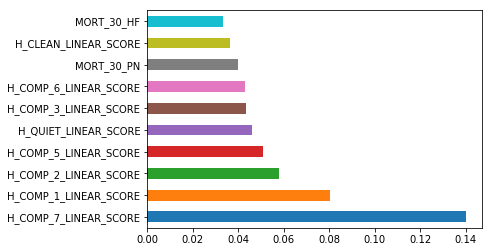

In [15]:
feat_importances = pd.Series(model.feature_importances_, index=cols)
feat_importances.nlargest(10).plot(kind='barh')

# Model Selection - KNN

In [16]:
y=df_knn['STAR_RATING']
cols=["COMP_HIP_KNEE","MORT_30_AMI","MORT_30_CABG","MORT_30_COPD","MORT_30_HF","MORT_30_PN","MORT_30_STK",
      "PSI_10_POST_KIDNEY","PSI_11_POST_RESP","PSI_12_POSTOP_PULMEMB_DVT","PSI_13_POST_SEPSIS","PSI_14_POSTOP_DEHIS",
      "PSI_15_ACC_LAC","PSI_3_ULCER","PSI_4_SURG_COMP","PSI_6_IAT_PTX","PSI_8_POST_HIP","PSI_90_SAFETY",
      "PSI_9_POST_HEM"
      ,"H_CLEAN_LINEAR_SCORE","H_COMP_1_LINEAR_SCORE","H_COMP_2_LINEAR_SCORE",
      "H_COMP_3_LINEAR_SCORE","H_COMP_5_LINEAR_SCORE","H_COMP_6_LINEAR_SCORE","H_COMP_7_LINEAR_SCORE"
      ,"H_QUIET_LINEAR_SCORE"
      #,'ZIP Code'
      #,"H_HSP_RATING_LINEAR_SCORE"
     ]
x=df_knn[cols]

In [17]:
#from sklearn.preprocessing import StandardScaler
#import numpy as np
#stscaler = StandardScaler().fit(x)
#x_stand = stscaler.transform(x)

In [18]:
#from sklearn.preprocessing import normalize
#x_norm=x.values
# Any Pre-processing needed?
#x_norm = normalize(x_norm)

In [19]:
import sklearn.model_selection as cv

SEED = 1

(x_train, x_test, y_train, y_test) = cv.train_test_split(x, y, test_size=.20, random_state = SEED)

In [20]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.metrics import f1_score


# Instantiate individual classifiers
rf = RandomForestClassifier(n_estimators=125, random_state=SEED)
knn = KNN(n_neighbors=15)

# Define a list called classifier that contains
# the tuples (classifier_name, classifier)
classifiers = [('Random Forest', rf),
               ('K Nearest Neighbours', knn)
              ]

In [21]:
for clf_name, clf in classifiers:
#fit clf to the training set
    clf.fit(x_train, y_train)
# Predict the labels of the test set
    y_pred = clf.predict(x_test)

# Evaluate the accuracy of clf on the test set
    print('Accuracy: {:s} : {:.3f}'.format(clf_name,accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name,precision_score(y_test, y_pred, average='macro')))
    print('Recall: {:s} : {:.3f}'.format(clf_name,recall_score(y_test, y_pred, average='macro')))
    print('F1 Score: {:s} : {:.3f}'.format(clf_name,f1_score(y_test, y_pred, average='macro')))

Accuracy: Random Forest : 0.669
Precision: Random Forest : 0.682
Recall: Random Forest : 0.560
F1 Score: Random Forest : 0.603
Accuracy: K Nearest Neighbours : 0.609
Precision: K Nearest Neighbours : 0.635
Recall: K Nearest Neighbours : 0.490
F1 Score: K Nearest Neighbours : 0.532


# Feature Importance

In [22]:
model = rf.fit(x_train, y_train)

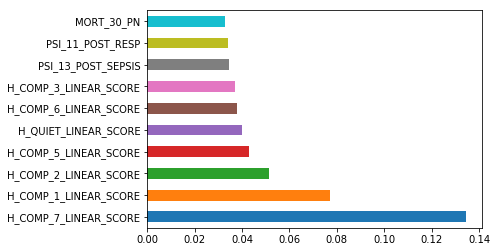

In [23]:
feat_importances = pd.Series(model.feature_importances_, index=cols)
feat_importances.nlargest(10).plot(kind='barh')

# Model Selection - Iterative

In [24]:
y=df_iterative['STAR_RATING']
cols=["COMP_HIP_KNEE","MORT_30_AMI","MORT_30_CABG","MORT_30_COPD","MORT_30_HF","MORT_30_PN","MORT_30_STK",
      "PSI_10_POST_KIDNEY","PSI_11_POST_RESP","PSI_12_POSTOP_PULMEMB_DVT","PSI_13_POST_SEPSIS","PSI_14_POSTOP_DEHIS",
      "PSI_15_ACC_LAC","PSI_3_ULCER","PSI_4_SURG_COMP","PSI_6_IAT_PTX","PSI_8_POST_HIP","PSI_90_SAFETY",
      "PSI_9_POST_HEM"
      ,"H_CLEAN_LINEAR_SCORE","H_COMP_1_LINEAR_SCORE","H_COMP_2_LINEAR_SCORE",
      "H_COMP_3_LINEAR_SCORE","H_COMP_5_LINEAR_SCORE","H_COMP_6_LINEAR_SCORE","H_COMP_7_LINEAR_SCORE"
      ,"H_QUIET_LINEAR_SCORE"
      #,'ZIP Code'
      #,"H_HSP_RATING_LINEAR_SCORE"
     ]
x=df_iterative[cols]

In [25]:
#from sklearn.preprocessing import StandardScaler
#import numpy as np
#stscaler = StandardScaler().fit(x)
#x_stand = stscaler.transform(x)

In [26]:
#from sklearn.preprocessing import normalize
#x_norm=x.values
# Any Pre-processing needed?
#x_norm = normalize(x_norm)

In [27]:
import sklearn.model_selection as cv

SEED = 1

(x_train, x_test, y_train, y_test) = cv.train_test_split(x, y, test_size=.20, random_state = SEED)

In [28]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.metrics import f1_score


# Instantiate individual classifiers
rf = RandomForestClassifier(n_estimators=120, random_state=SEED)
knn = KNN(n_neighbors=15)

# Define a list called classifier that contains
# the tuples (classifier_name, classifier)
classifiers = [('Random Forest', rf),
               ('K Nearest Neighbours', knn)
              ]

In [29]:
for clf_name, clf in classifiers:
#fit clf to the training set
    clf.fit(x_train, y_train)
# Predict the labels of the test set
    y_pred = clf.predict(x_test)

# Evaluate the accuracy of clf on the test set
    print('Accuracy: {:s} : {:.3f}'.format(clf_name,accuracy_score(y_test, y_pred)))
    print('Precision: {:s} : {:.3f}'.format(clf_name,precision_score(y_test, y_pred, average='macro')))
    print('Recall: {:s} : {:.3f}'.format(clf_name,recall_score(y_test, y_pred, average='macro')))
    print('F1 Score: {:s} : {:.3f}'.format(clf_name,f1_score(y_test, y_pred, average='macro')))

Accuracy: Random Forest : 0.700
Precision: Random Forest : 0.731
Recall: Random Forest : 0.595
F1 Score: Random Forest : 0.643
Accuracy: K Nearest Neighbours : 0.623
Precision: K Nearest Neighbours : 0.638
Recall: K Nearest Neighbours : 0.485
F1 Score: K Nearest Neighbours : 0.529


# Feature Importance

In [30]:
model = rf.fit(x_train, y_train)

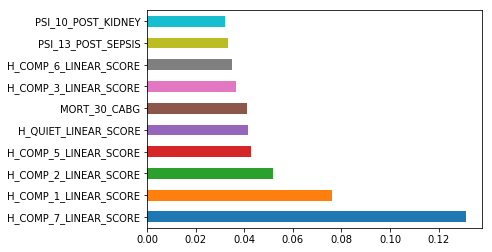

In [31]:
feat_importances = pd.Series(model.feature_importances_, index=cols)
feat_importances.nlargest(10).plot(kind='barh')

## Import Latest Cleaned Data Set

In [1]:
#Import required packages
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [2]:
#Import data
df_mean = pd.read_csv('hospitaldata_mean.csv.txt')  # filled with mean values
df_iterative = pd.read_csv('hospitaldata_iterative.csv.txt')  # filled with linear regression
df_knn = pd.read_csv('hospitaldata_knn.csv.txt')  # filled with knn

In [3]:
df_mean.head()

,Unnamed: 0,Unnamed: 0.1,Provider ID,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,...,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Hospital Name,Address,City,State,ZIP Code,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,0,0,10001,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,...,86,84,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,506,21,2
1,1,1,10005,3.0,15.500000,3.230405,10.9,15.3,20.8,15.7,...,85,88,MARSHALL MEDICAL CENTER SOUTH,2505 U S HIGHWAY 431 NORTH,BOAZ,AL,35957,1135,34,3
2,2,2,10006,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,...,82,84,ELIZA COFFEE MEMORIAL HOSPITAL,205 MARENGO STREET,FLORENCE,AL,35631,579,22,2
3,3,3,10007,2.8,13.172227,3.230405,8.3,13.3,21.6,15.9,...,86,85,MIZELL MEMORIAL HOSPITAL,702 N MAIN ST,OPP,AL,36467,185,27,2
4,4,4,10011,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,...,81,86,ST VINCENT'S EAST,50 MEDICAL PARK EAST DRIVE,BIRMINGHAM,AL,35235,2193,33,3


In [4]:
df_mean.drop(["Unnamed: 0", "Unnamed: 0.1", "Provider ID", "Hospital Name", "Address", "City", "State", "ZIP Code"], \
             axis = 1, inplace = True)
df_iterative.drop(["Unnamed: 0", "Unnamed: 0.1", "Provider ID", "Hospital Name", "Address", "City", "State", "ZIP Code"], \
             axis = 1, inplace = True)
df_knn.drop(["Unnamed: 0", "Unnamed: 0.1", "Provider ID", "Hospital Name", "Address", "City", "State", "ZIP Code"], \
             axis = 1, inplace = True)

In [5]:
df_iterative.head()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent,STAR_RATING
0,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,...,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0,2.0
1,3.0,15.500000,3.996645,10.9,15.3,20.8,15.7,1.10,12.17,3.17,...,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0,3.0
2,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,1.28,7.19,3.31,...,83.0,76.0,83.0,80.0,84.0,82.0,84.0,579.0,22.0,2.0
3,2.8,14.439599,3.997644,8.3,13.3,21.6,15.9,1.30,9.46,4.76,...,84.0,79.0,85.0,80.0,85.0,86.0,85.0,185.0,27.0,2.0
4,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,1.74,15.22,4.53,...,83.0,77.0,86.0,82.0,87.0,81.0,86.0,2193.0,33.0,3.0


In [6]:
#Drop Star Rating given this is a Regression Model
df_mean.drop(["STAR_RATING"], axis = 1, inplace = True)
df_iterative.drop(["STAR_RATING"], axis = 1, inplace = True)
df_knn.drop(["STAR_RATING"], axis = 1, inplace = True)

## Model Development

<b>Note:</b> The following exercie was performed on each of our data sets, however for the purposes for further analysis we chose the iterative data set based on our iniital modeling results.

### Iterative Imputation Data Set with Full Data Set

#### Set Up Random Forest Regression Model

In [7]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth=4)

#### Set Up X and Y / Train and Test Data Sets

In [8]:
dataset = df_iterative
y = dataset.loc[:,["H_RECMND_LINEAR_SCORE"]]
x = dataset.loc[:,dataset.columns != "H_RECMND_LINEAR_SCORE"]

In [9]:
#Define train_x and train_y
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)

#### Run Initial Model

In [10]:
rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)

C:\Users\zainj\Anaconda3\envs\py37\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\zainj\Anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


####  Evaluate Outputs

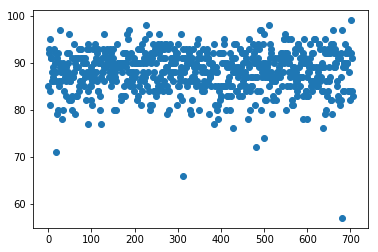

In [11]:
#look at x vs. y_test
plt.scatter(x = range(x_test.shape[0]), y = y_test)

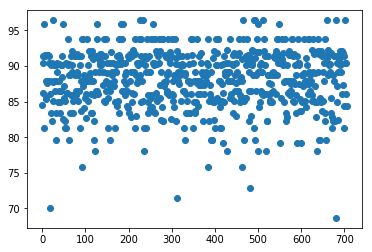

In [12]:
#look at x vs. y_pred
plt.scatter(x = range(x_test.shape[0]), y = y_pred)

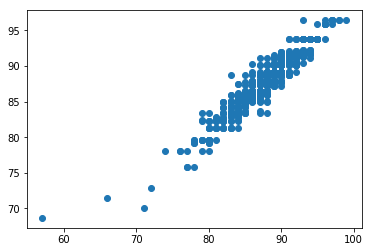

In [13]:
#look at y_test vs. y_pred
plt.scatter(x = y_test, y = y_pred)

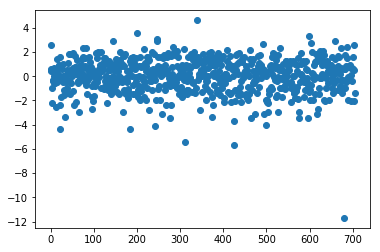

In [14]:
#look at residuals
resids = y_test["H_RECMND_LINEAR_SCORE"] - y_pred

plt.scatter(x = range(x_test.shape[0]), y = resids)

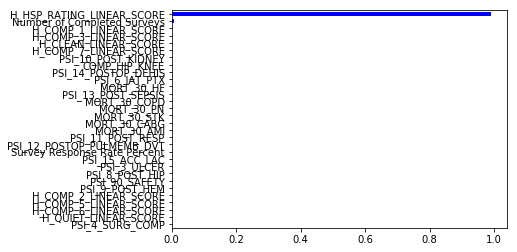

In [15]:
# Create a pd.Series of features importances
importances_rf = pd.Series(rf.feature_importances_,
index = x.columns)
# Sort importances_rf
sorted_importances_rf = importances_rf.sort_values()
# Make a horizontal bar plot
sorted_importances_rf.plot(kind='barh', color='blue')
plt.show()

####  Perform Cross Validation of Model

##### Test RMSE

In [16]:
from sklearn.metrics import mean_squared_error as MSE
mse = MSE(y_test, y_pred)
rmse = mse**(1/2)

# Compute mse_dt
mse_dt = MSE(y_test, y_pred)

# Compute rmse_dt
rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test RMSE: {:.5f}".format(rmse_dt))

Test RMSE: 1.41057


##### CV RMSE

In [17]:
from sklearn.model_selection import cross_val_score
# Compute the array containing the 10-folds CV MSEs
MSE_CV_scores = - cross_val_score(rf, x_train, y_train, cv=10, 
                                  scoring='neg_mean_squared_error', 
                                  n_jobs=-1) 

# Compute the 10-folds CV RMSE
RMSE_CV = (MSE_CV_scores.mean())**(1/2)

# Print RMSE_CV
print("CV RMSE: {:.5f}".format(RMSE_CV))

CV RMSE: 1.43683


##### Train MSE

In [18]:
# Predict the labels of the training set
y_pred_train = rf.predict(x_train)

# Evaluate the training set RMSE of dt
RMSE_train = (MSE(y_train, y_pred_train))**(1/2)

# Print RMSE_train
print('Train RMSE: {:.5f}'.format(RMSE_train))

Train RMSE: 1.38119


####  Analysis

Based on the results of our cross-validation, our model is likely overfitting. This may be due to our relatively small data set size and/or our use of a large number of features. For further analysis, we recommend feature engineering to see if we can reduce our overfitting problem.

### Iterative Imputation Data Set with Modified Data Set to Reduce Overfitting

#### Set Up Random Forest Regression Model

In [19]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 4)

In [20]:
dataset.head()

,COMP_HIP_KNEE,MORT_30_AMI,MORT_30_CABG,MORT_30_COPD,MORT_30_HF,MORT_30_PN,MORT_30_STK,PSI_10_POST_KIDNEY,PSI_11_POST_RESP,PSI_12_POSTOP_PULMEMB_DVT,...,H_COMP_2_LINEAR_SCORE,H_COMP_3_LINEAR_SCORE,H_COMP_5_LINEAR_SCORE,H_COMP_6_LINEAR_SCORE,H_COMP_7_LINEAR_SCORE,H_HSP_RATING_LINEAR_SCORE,H_QUIET_LINEAR_SCORE,H_RECMND_LINEAR_SCORE,Number of Completed Surveys,Survey Response Rate Percent
0,3.0,14.500000,4.500000,8.9,12.5,16.2,13.7,0.65,6.02,5.57,...,90.0,75.0,70.0,85.0,79.0,83.0,86.0,84.0,506.0,21.0
1,3.0,15.500000,3.996645,10.9,15.3,20.8,15.7,1.10,12.17,3.17,...,94.0,85.0,81.0,88.0,81.0,88.0,85.0,88.0,1135.0,34.0
2,3.6,14.900000,3.200000,8.8,13.2,17.2,17.2,1.28,7.19,3.31,...,91.0,83.0,76.0,83.0,80.0,84.0,82.0,84.0,579.0,22.0
3,2.8,14.439599,3.997644,8.3,13.3,21.6,15.9,1.30,9.46,4.76,...,94.0,84.0,79.0,85.0,80.0,85.0,86.0,85.0,185.0,27.0
4,2.6,14.100000,3.700000,8.9,13.1,16.1,12.4,1.74,15.22,4.53,...,91.0,83.0,77.0,86.0,82.0,87.0,81.0,86.0,2193.0,33.0


#### Set Up X and Y / Train and Test Data Sets

In [21]:
dataset = df_iterative
y = dataset.loc[:,["H_RECMND_LINEAR_SCORE"]]
x_mod = dataset.loc[:,dataset.columns != "H_RECMND_LINEAR_SCORE"]
x_mod = x_mod.drop(["H_HSP_RATING_LINEAR_SCORE", "H_COMP_7_LINEAR_SCORE", "H_COMP_1_LINEAR_SCORE", "H_COMP_2_LINEAR_SCORE", \
                   "H_COMP_5_LINEAR_SCORE", "H_COMP_6_LINEAR_SCORE"], axis = 1)
#x_mod = x_mod.loc[:, ["H_HSP_RATING_LINEAR_SCORE", "H_QUIET_LINEAR_SCORE", "Number of Completed Surveys"]]
#x_mod.drop(["H_HSP_RATING_LINEAR_SCORE", "H_COMP_7_LINEAR_SCORE", "H_COMP_1_LINEAR_SCORE", "H_COMP_2_LINEAR_SCORE",\
#           "H_COMP_5_LINEAR_SCORE", "H_COMP_3_LINEAR_SCORE", "H_COMP_6_LINEAR_SCORE", "H_CLEAN_LINEAR_SCORE",\
#           "H_QUIET_LINEAR_SCORE", "Survey Response Rate Percent", "MORT_30_CABG", "Number of Completed Surveys", \
#           "PSI_11_POST_RESP", "MORT_30_AMI"], axis = 1, inplace = True)

<b>Note:</b> This step was performed several times with various combinations of features based upon the model outputs (e.g., feature importance, cross validation results, etc.). In addition, this exercise was attempted with various model parameters (e.g., maximum depth and minimum leaf size). For the purposes of this workbook, only one iteration is shown.

In [22]:
#Define train_x and train_y
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_mod,y,test_size=0.2,random_state=0)

#### Run Initial Model

In [23]:
rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)

C:\Users\zainj\Anaconda3\envs\py37\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\zainj\Anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


####  Evaluate Outputs

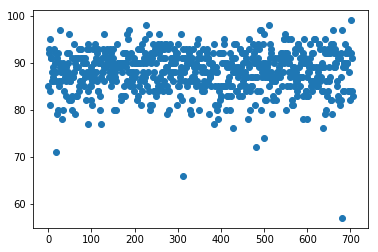

In [24]:
#look at x vs. y_test
plt.scatter(x = range(x_test.shape[0]), y = y_test)

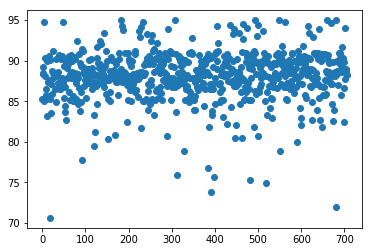

In [25]:
#look at x vs. y_pred
plt.scatter(x = range(x_test.shape[0]), y = y_pred)

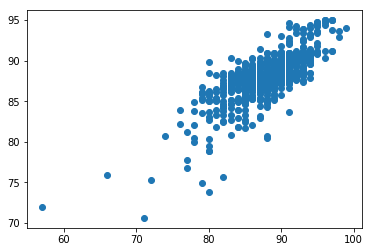

In [26]:
#look at y_test vs. y_pred
plt.scatter(x = y_test, y = y_pred)

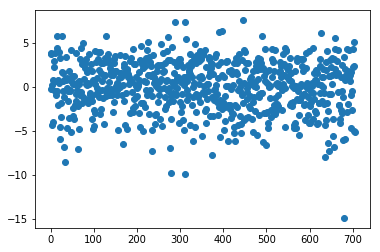

In [27]:
#look at residuals
resids = y_test["H_RECMND_LINEAR_SCORE"] - y_pred

plt.scatter(x = range(x_test.shape[0]), y = resids)

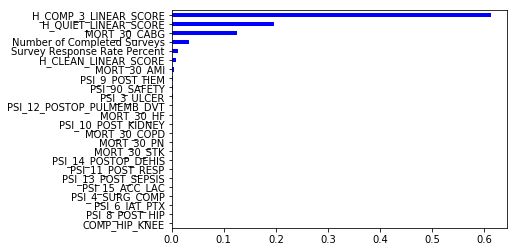

In [28]:
# Create a pd.Series of features importances
importances_rf = pd.Series(rf.feature_importances_,
index = x_mod.columns)
# Sort importances_rf
sorted_importances_rf = importances_rf.sort_values()
# Make a horizontal bar plot
sorted_importances_rf.plot(kind='barh', color='blue')
plt.show()

####  Perform Cross Validation of Model

##### Test RMSE

In [29]:
from sklearn.metrics import mean_squared_error as MSE
mse = MSE(y_test, y_pred)
rmse = mse**(1/2)

# Compute mse_dt
mse_dt = MSE(y_test, y_pred)

# Compute rmse_dt
rmse_dt = mse_dt**(1/2)

# Print rmse_dt
print("Test RMSE: {:.5f}".format(rmse_dt))

Test RMSE: 2.89547


##### CV RMSE

In [30]:
from sklearn.model_selection import cross_val_score
# Compute the array containing the 10-folds CV MSEs
MSE_CV_scores = - cross_val_score(rf, x_train, y_train, cv=10, 
                                  scoring='neg_mean_squared_error', 
                                  n_jobs=-1) 

# Compute the 10-folds CV RMSE
RMSE_CV = (MSE_CV_scores.mean())**(1/2)

# Print RMSE_CV
print("CV RMSE: {:.5f}".format(RMSE_CV))

CV RMSE: 2.87115


##### Train MSE

In [31]:
# Predict the labels of the training set
y_pred_train = rf.predict(x_train)

# Evaluate the training set RMSE of dt
RMSE_train = (MSE(y_train, y_pred_train))**(1/2)

# Print RMSE_train
print('Train RMSE: {:.5f}'.format(RMSE_train))

Train RMSE: 2.68913


## Conclusion

Based upon the cross-validation results accross several iterations of the random forest regression model - based upon modifying the features used and tuning the model parameters - we were unable to develop an effective model that did not overfit. We believe this may be due to the decision tree approach utilized by the random forest model and the relative small size of the data (approximately 3,500 hospitals). Therefore, we ultimately do not recommend utilizing the Random Forest Regression model.